In [1]:
import os
import sys
import pandas as pd
sys.path.append('../src/')
from utils_training import *
from utils_plotting import *
from utils_feature_selection import *
from configs import *
from functools import reduce
import itertools
from tqdm.notebook import tqdm

from matplotlib import rcParams
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
rcParams.update(fig_params)
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

%load_ext autoreload
%autoreload 2

## Load data

In [2]:
key = ['ID', 'Sequence', 'CPP', 'Dataset']

features = ['physicochemical',
            'AAC',
            'CKSAAP type 1',
            'TPC type 1',
            'DPC type 1',
            'DDE',
            'GAAC',
            'CKSAAGP type 1',
            'GDPC type 1',
            'GTPC type 1',
            'Moran',
            'Geary',
            'NMBroto',
            'CTDC',
            'CTDT',
            'CTDD',
            'CTriad',
            'KSCTriad',
            'SOCNumber',
            'QSOrder',
            'PAAC',
            'APAAC',
            'ASDC',
            'AC',
            'CC',
            'ACC',
            'EAAC',
            'EGAAC',
            'AAIndex',
            'BLOSUM62',
            'ZScale'
           ]

In [3]:
dfList = []
features_dict = {}

for feature in features:
    tmp = pd.read_pickle(os.path.join('..', 'features', 'comb_' + feature.split(' ')[0] + '.pickle'))
    features_dict[feature] = list(set(tmp.columns.tolist()) - set(key))
    dfList.append(tmp)
    
comb = reduce(lambda df1, df2: pd.merge(df1, df2, on=['ID', 'Sequence', 'CPP', 'Dataset']), dfList)

train = comb[comb.Dataset=='train'].copy()
test  = comb[comb.Dataset=='test'].copy()

features = sorted(list(itertools.chain.from_iterable(list(features_dict.values()))))
print(f'Features number: {len(features)}')

Features number: 13833


## Baseline

Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 1 + 0	cv_agg's valid auc: 0.942332 + 0.0238711
[200]	cv_agg's train auc: 1 + 0	cv_agg's valid auc: 0.945535 + 0.0222051
[100]	training's auc: 1	valid_1's auc: 0.924193


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.946081,0.768790,0.876009,0.904808,0.924213,0.882235,0.832365,0.932033
Test_ensemble,0.928892,0.653800,0.672000,0.614035,0.582212,0.947458,0.797468,0.958314
Test_refit,0.927788,0.648605,0.666667,0.606936,0.574330,0.946177,0.797468,0.956940


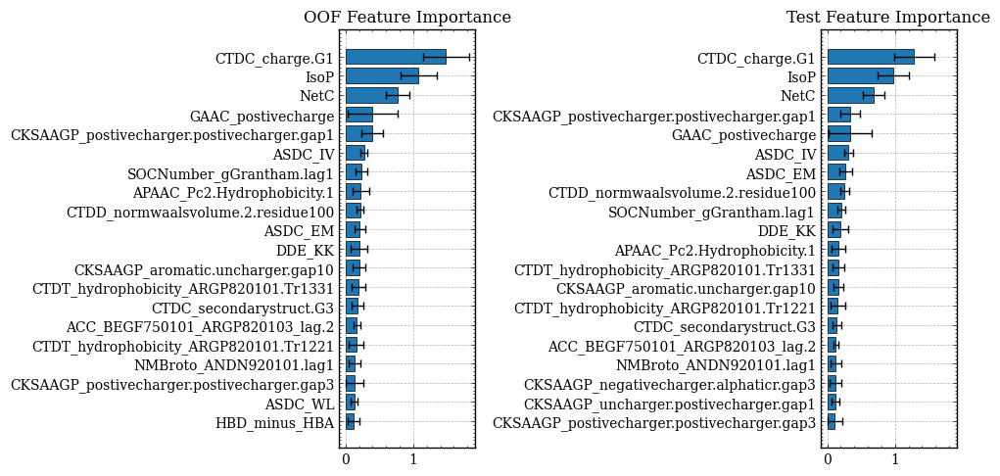

In [5]:
oof_results, test_results = cross_validate(train=train,
                                           test=test,
                                           features=features,
                                           target=TARGET,
                                           num_folds=NUM_FOLDS,
                                           num_repeats=NUM_REPEATS,
                                           seed=SEED,
                                           params={**PARAMS_GB, **{'scale_pos_weight': 0.1}},
                                           threshold=0.5,
                                           feval=None,
                                           refit=True,
                                           compute_oof_importance=True,
                                           compute_test_importance=True)
print_results(oof_results, test_results)
plot_importance(oof_results, test_results, features, max_features=20)

## Feature selection

### Part 1 - Removing features not used during training

In [6]:
feat_imp_df = pd.DataFrame(data=0.0, columns=features, index=range(len(oof_results['models'].boosters)))

for i, model in enumerate(oof_results['models'].boosters):
    feat_imp_tmp = {feature: importance for feature, importance in zip(features, model.feature_importance())}
    feat_imp_tmp = pd.DataFrame.from_records(feat_imp_tmp, index=[i])
    feat_imp_df.loc[i, features] = feat_imp_tmp.values
    
tmp = feat_imp_df.sum()
to_drop = tmp[tmp == 0.0].index.tolist()
features = sorted(list(set(features) - set(to_drop)))
print(f'Features number: {len(features)}')

Features number: 2297


Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 1 + 0	cv_agg's valid auc: 0.942332 + 0.0238711
[200]	cv_agg's train auc: 1 + 0	cv_agg's valid auc: 0.945535 + 0.0222051
Early stopping, best iteration is:
[184]	cv_agg's train auc: 1 + 0	cv_agg's valid auc: 0.946081 + 0.0220472
[100]	training's auc: 1	valid_1's auc: 0.922592


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.946081,0.768790,0.876009,0.904808,0.924213,0.882235,0.832365,0.932033
Test_ensemble,0.928892,0.653800,0.672000,0.614035,0.582212,0.947458,0.797468,0.958314
Test_refit,0.921702,0.638509,0.656250,0.593220,0.559188,0.943614,0.797468,0.954191


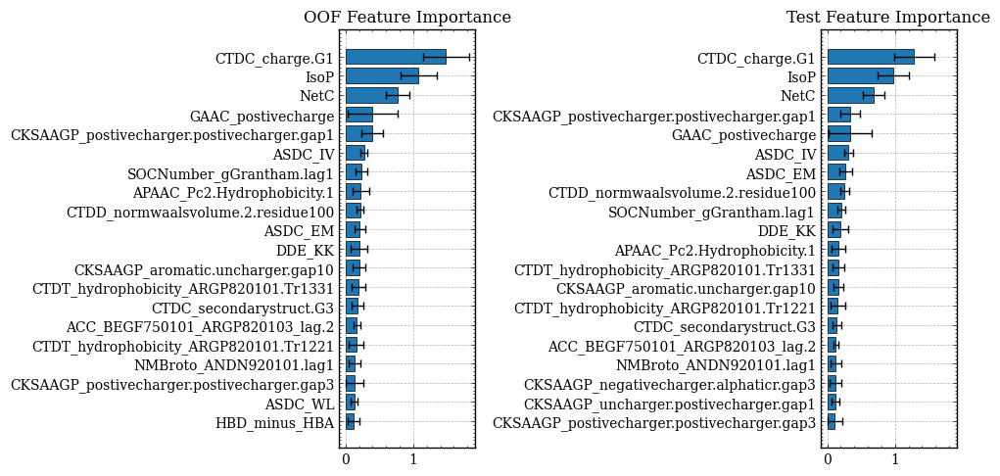

In [7]:
oof_results, test_results = cross_validate(train=train,
                                           test=test,
                                           features=features,
                                           target=TARGET,
                                           num_folds=NUM_FOLDS,
                                           num_repeats=NUM_REPEATS,
                                           seed=SEED,
                                           params={**PARAMS_GB, **{'scale_pos_weight': 0.1}},
                                           threshold=0.5,
                                           feval=None,
                                           refit=True,
                                           compute_oof_importance=True,
                                           compute_test_importance=True)
print_results(oof_results, test_results)
plot_importance(oof_results, test_results, features, max_features=20)

### Part 2 - Limiting number of leaves

Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.954319 + 0.00274989	cv_agg's valid auc: 0.919855 + 0.0244589
[200]	cv_agg's train auc: 0.97367 + 0.00209928	cv_agg's valid auc: 0.929603 + 0.0206185
[300]	cv_agg's train auc: 0.983383 + 0.00176984	cv_agg's valid auc: 0.933015 + 0.0191945
Early stopping, best iteration is:
[318]	cv_agg's train auc: 0.984778 + 0.00167675	cv_agg's valid auc: 0.93341 + 0.018476
[100]	training's auc: 0.953522	valid_1's auc: 0.927983
[200]	training's auc: 0.972119	valid_1's auc: 0.927973
[300]	training's auc: 0.981424	valid_1's auc: 0.929896


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.933410,0.649827,0.766464,0.870905,0.954379,0.806240,0.640200,0.971990
Test_ensemble,0.930299,0.687497,0.707792,0.718997,0.726283,0.961555,0.689873,0.981219
Test_refit,0.930206,0.674366,0.695082,0.710456,0.720555,0.960273,0.670886,0.981219


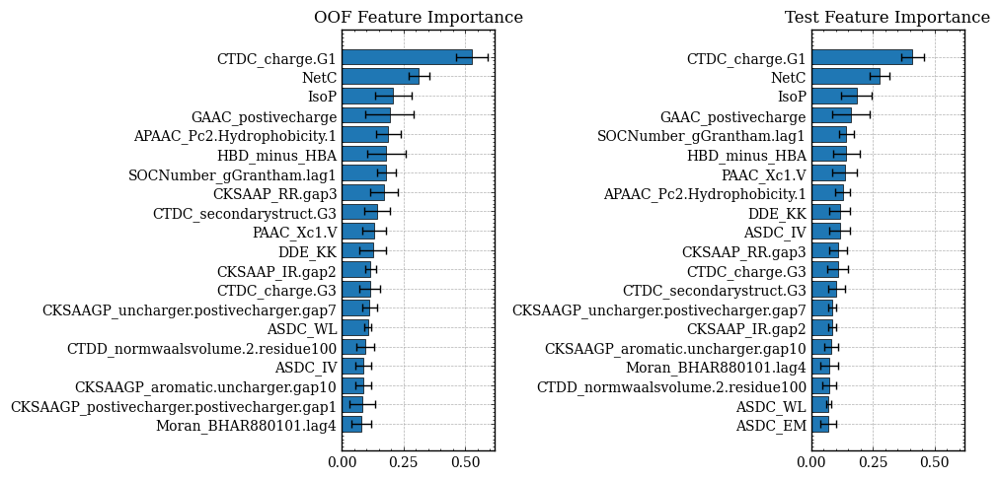

In [8]:
oof_results, test_results = cross_validate(train=train,
                                           test=test,
                                           features=features,
                                           target=TARGET,
                                           num_folds=NUM_FOLDS,
                                           num_repeats=NUM_REPEATS,
                                           seed=SEED,
                                           params={**PARAMS_GB, **{'scale_pos_weight': 0.1, 'num_leaves': 2}},
                                           threshold=0.5,
                                           feval=None,
                                           refit=True,
                                           compute_oof_importance=True,
                                           compute_test_importance=True)
print_results(oof_results, test_results)
plot_importance(oof_results, test_results, features, max_features=20)

In [9]:
feat_imp_df = pd.DataFrame(data=0.0, columns=features, index=range(len(oof_results['models'].boosters)))

for i, model in enumerate(oof_results['models'].boosters):
    feat_imp_tmp = {feature: importance for feature, importance in zip(features, model.feature_importance())}
    feat_imp_tmp = pd.DataFrame.from_records(feat_imp_tmp, index=[i])
    feat_imp_df.loc[i, features] = feat_imp_tmp.values
    
tmp = feat_imp_df.sum()
to_drop = tmp[tmp == 0.0].index.tolist()
features = sorted(list(set(features) - set(to_drop)))
print(f'Features number: {len(features)}')

Features number: 375


Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.954319 + 0.00274989	cv_agg's valid auc: 0.919855 + 0.0244589
[200]	cv_agg's train auc: 0.97367 + 0.00209928	cv_agg's valid auc: 0.929603 + 0.0206185
[300]	cv_agg's train auc: 0.983383 + 0.00176984	cv_agg's valid auc: 0.933015 + 0.0191945
Early stopping, best iteration is:
[318]	cv_agg's train auc: 0.984778 + 0.00167675	cv_agg's valid auc: 0.93341 + 0.018476
[100]	training's auc: 0.953522	valid_1's auc: 0.927983
[200]	training's auc: 0.972119	valid_1's auc: 0.927973
[300]	training's auc: 0.981257	valid_1's auc: 0.930162


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.933410,0.649827,0.766464,0.870905,0.954379,0.806240,0.640200,0.971990
Test_ensemble,0.930299,0.687497,0.707792,0.718997,0.726283,0.961555,0.689873,0.981219
Test_refit,0.930980,0.674366,0.695082,0.710456,0.720555,0.960273,0.670886,0.981219


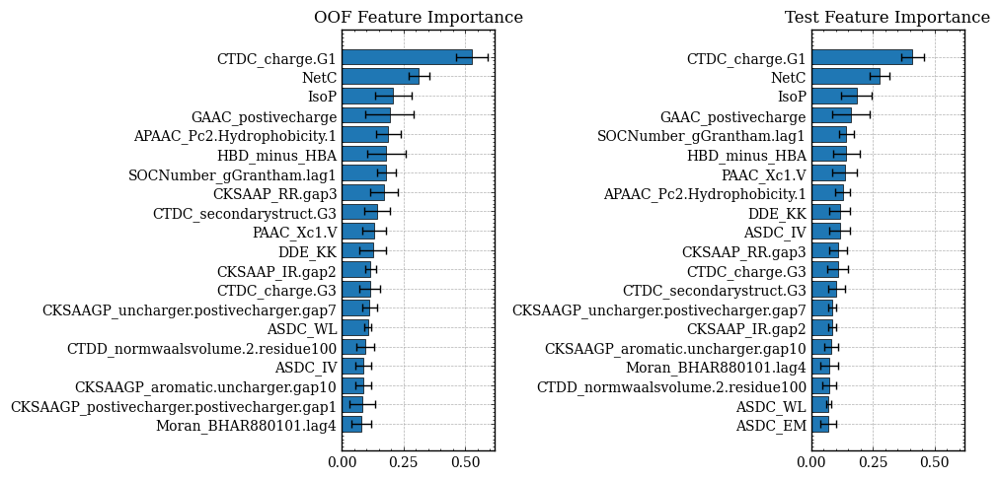

In [10]:
oof_results, test_results = cross_validate(train=train,
                                           test=test,
                                           features=features,
                                           target=TARGET,
                                           num_folds=NUM_FOLDS,
                                           num_repeats=NUM_REPEATS,
                                           seed=SEED,
                                           params={**PARAMS_GB, **{'scale_pos_weight': 0.1, 'num_leaves': 2}},
                                           threshold=0.5,
                                           feval=None,
                                           refit=True,
                                           compute_oof_importance=True,
                                           compute_test_importance=True)
print_results(oof_results, test_results)
plot_importance(oof_results, test_results, features, max_features=20)

### Part 3 - Maximum Relevance - Minimum Redundancy (MRMR)

### Optimizing for efficiency and accuracy

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    9.4s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    9.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:   10.8s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:   11.9s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:   13.0s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:   14.0s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   15.3s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   16.7s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   17.8s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   18.9s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   20.5s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   21.7s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   23.8s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   26.2s remaining:    5.1s
[Parallel(n_jobs=50)]: Done 352 out 

,Fb05,relevance
CTDC_charge.G1,0.783720,0.783720
GAAC_postivecharge,0.768566,0.768566
NetC,0.719941,0.719941
CKSAAGP_postivecharger.postivecharger.gap3,0.693799,0.693799
CKSAAGP_postivecharger.postivecharger.gap1,0.688759,0.688759
KSCTriad_g5.g5.g5.gap1,0.677277,0.677277
APAAC_Pc2.Hydrophobicity.1,0.645478,0.645478
CKSAAP_RR.gap3,0.627465,0.627465
CKSAAP_RR.gap2,0.600782,0.600782
CKSAAGP_postivecharger.postivecharger.gap10,0.597601,0.597601


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.


(375, 2)


[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.5s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.8s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    2.0s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    2.3s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    2.5s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.7s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    3.1s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    3.3s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    3.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    4.1s remaining:    0.8s
[Parallel(n_jobs=50)]: Done 352 out of 375 | elapsed:    4.7s remaining:    0.3s
[Parallel(n_jobs=50)]: Done 375 

,CTDC_charge.G1,redundancy
AAC_A,0.024413,0.024413
AAC_H,0.018387,0.018387
AAC_T,0.060931,0.060931
AAindex_p.1.ARGP820101,0.070906,0.070906
AAindex_p.1.BEGF750103,0.038836,0.038836
AAindex_p.2.ARGP820101,0.096822,0.096822
AAindex_p.6.BHAR880101,0.089743,0.089743
ACC_ANDN920101.lag1,0.037008,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.011372
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.008323


(375, 2)
['CTDC_charge.G1']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.866139 + 0.00526532	cv_agg's valid auc: 0.855575 + 0.0332041
[100]	training's auc: 0.860797	valid_1's auc: 0.822851


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.856574,0.513976,0.602998,0.78372,0.968749,0.713776,0.436146,0.991258
Test_ensemble,0.822108,0.521245,0.518519,0.63253,0.734927,0.950021,0.398734,0.989922
Test_refit,0.822851,0.521245,0.518519,0.63253,0.734927,0.950021,0.398734,0.989922


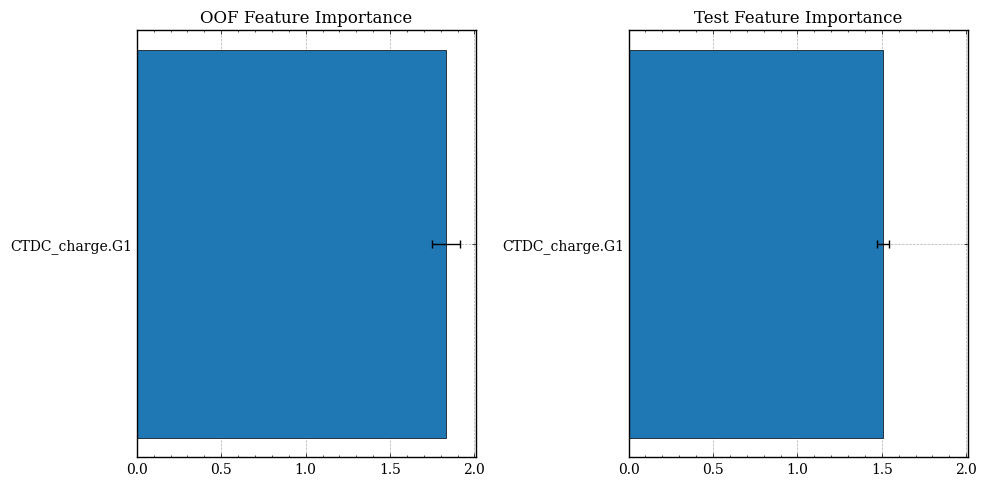

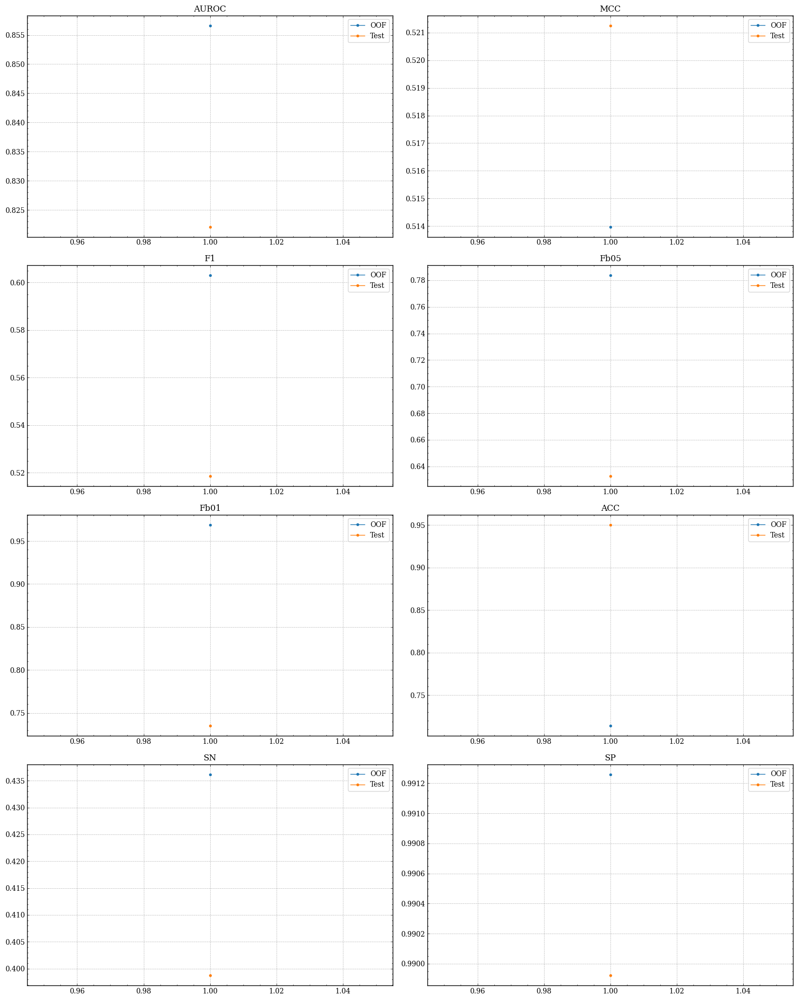

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.3s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    3.9s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.4s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.1s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.0s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.1s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    9.4s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   10.6s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.0s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.1s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   14.7s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   16.1s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   17.9s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   20.5s remaining:    4.0s
[Parallel(n_jobs=50)]: Done 352 out 

,Fb05,relevance
CTDD_hydrophobicity_ARGP820101.1.residue50,0.810437,0.810437
CTDT_hydrophobicity_ARGP820101.Tr1221,0.809674,0.809674
SOCNumber_gGrantham.lag1,0.809642,0.809642
CTDD_hydrophobicity_CASG920101.1.residue25,0.808109,0.808109
PAAC_Xc1.L,0.807975,0.807975
ASDC_LW,0.806822,0.806822
DDE_SP,0.806655,0.806655
CTDC_hydrophobicity_ARGP820101.G1,0.806035,0.806035
DDE_LA,0.805650,0.805650
CTDT_hydrophobicity_ARGP820101.Tr2332,0.804860,0.804860


(375, 2)


,relevance,redundancy
AAC_A,0.791537,0.024413
AAC_H,0.790959,0.018387
AAC_T,0.783720,0.060931
AAindex_p.1.ARGP820101,0.784028,0.070906
AAindex_p.1.BEGF750103,0.783720,0.038836
AAindex_p.2.ARGP820101,0.783720,0.096822
AAindex_p.6.BHAR880101,0.784028,0.089743
ACC_ANDN920101.lag1,0.785058,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.783720,0.011372
ACC_ANDN920101_ARGP820102_lag.3,0.781722,0.008323


(375, 2)


,relevance,redundancy,score
CTDD_hydrophobicity_ARGP820101.1.residue50,0.810437,0.115756,0.810437
CTDT_hydrophobicity_ARGP820101.Tr1221,0.809674,0.025171,0.809674
SOCNumber_gGrantham.lag1,0.809642,0.133669,0.809642
CTDD_hydrophobicity_CASG920101.1.residue25,0.808109,0.011271,0.808109
PAAC_Xc1.L,0.807975,0.113345,0.807975
ASDC_LW,0.806822,0.009288,0.806822
DDE_SP,0.806655,0.023502,0.806655
CTDC_hydrophobicity_ARGP820101.G1,0.806035,0.287572,0.806035
DDE_LA,0.805650,0.022321,0.805650
CTDT_hydrophobicity_ARGP820101.Tr2332,0.804860,0.060435,0.804860


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.4s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.8s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    2.1s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    2.3s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.8s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    3.0s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    3.3s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.8s remaining:    0.7s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50
AAC_A,0.024413,0.021951,0.019490
AAC_H,0.018387,0.020937,0.023488
AAC_T,0.060931,0.045492,0.030053
AAindex_p.1.ARGP820101,0.070906,0.060140,0.049374
AAindex_p.1.BEGF750103,0.038836,0.026243,0.013649
AAindex_p.2.ARGP820101,0.096822,0.070857,0.044892
AAindex_p.6.BHAR880101,0.089743,0.063731,0.037719
ACC_ANDN920101.lag1,0.037008,0.018915,0.000822
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.006232,0.001092
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.004161,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.877662 + 0.00409502	cv_agg's valid auc: 0.869928 + 0.0323512
[200]	cv_agg's train auc: 0.890752 + 0.00395121	cv_agg's valid auc: 0.877102 + 0.0342201
[100]	training's auc: 0.87772	valid_1's auc: 0.864659
[200]	training's auc: 0.892973	valid_1's auc: 0.860214


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.877333,0.547454,0.649165,0.810437,0.963649,0.737361,0.488506,0.985995
Test_ensemble,0.864526,0.568155,0.576923,0.662544,0.731319,0.953012,0.474684,0.987632
Test_refit,0.860200,0.564956,0.574713,0.657895,0.724326,0.952584,0.474684,0.987174


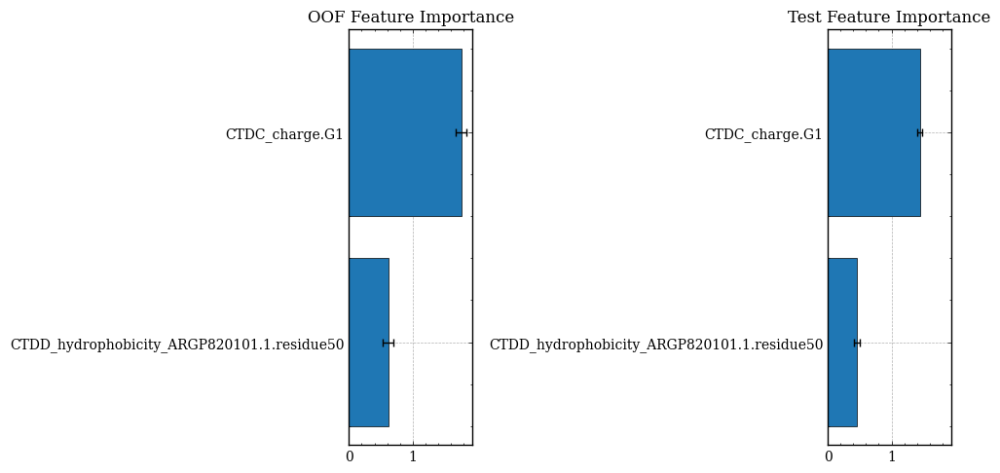

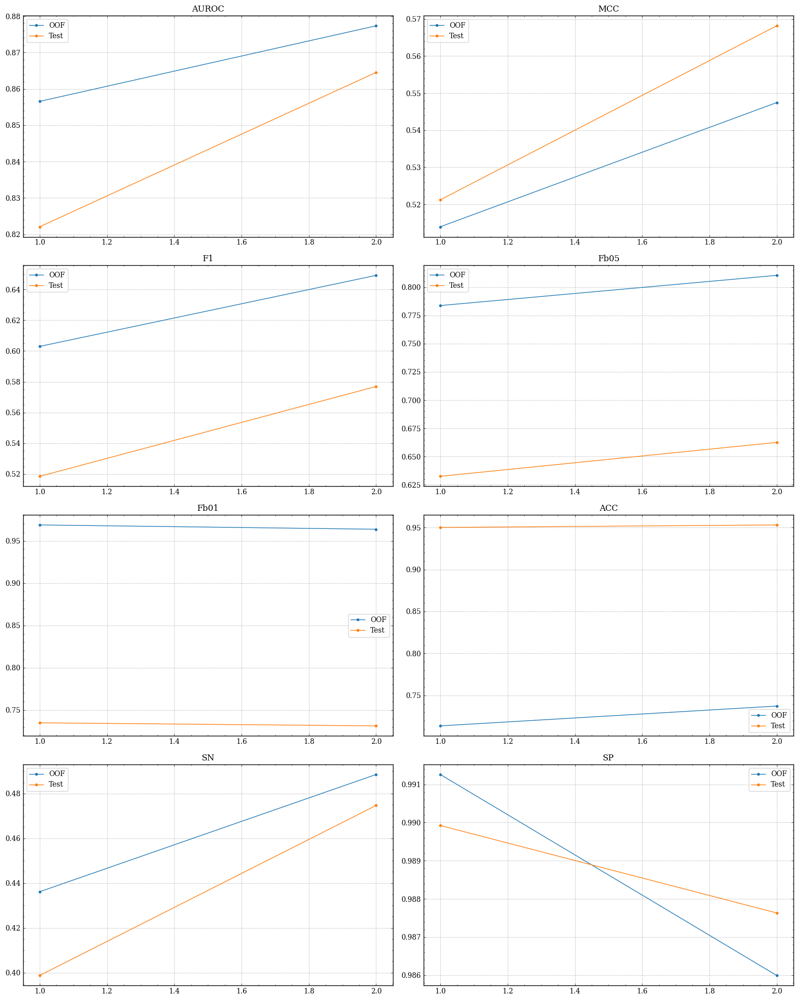

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.5s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.0s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.4s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.2s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.1s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    7.9s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    9.6s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   10.6s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   11.8s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.4s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   14.6s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   16.1s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   17.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   20.5s remaining:    4.0s
[Parallel(n_jobs=50)]: Done 352 out 

,Fb05,relevance
SOCNumber_gGrantham.lag1,0.834526,0.834526
CKSAAP_IR.gap2,0.826746,0.826746
ASDC_IR,0.823979,0.823979
CTDD_normwaalsvolume.2.residue100,0.822941,0.822941
ASDC_LW,0.822442,0.822442
DDE_TC,0.821812,0.821812
CKSAAP_LL.gap4,0.821695,0.821695
DDE_LS,0.821286,0.821286
DDE_SH,0.821026,0.821026
DDE_GI,0.820832,0.820832


(375, 2)


,relevance,redundancy
AAC_A,0.816571,0.021951
AAC_H,0.816747,0.020937
AAC_T,0.805627,0.045492
AAindex_p.1.ARGP820101,0.807243,0.060140
AAindex_p.1.BEGF750103,0.806359,0.026243
AAindex_p.2.ARGP820101,0.808167,0.070857
AAindex_p.6.BHAR880101,0.811537,0.063731
ACC_ANDN920101.lag1,0.808272,0.018915
ACC_ANDN920101_ARGP820102_lag.2,0.806941,0.006232
ACC_ANDN920101_ARGP820102_lag.3,0.809500,0.004161


(375, 2)


,relevance,redundancy,score
SOCNumber_gGrantham.lag1,0.834526,0.079056,0.834526
CKSAAP_IR.gap2,0.826746,0.001874,0.826746
ASDC_IR,0.823979,0.015062,0.823979
CTDD_normwaalsvolume.2.residue100,0.822941,0.154822,0.822941
ASDC_LW,0.822442,0.036590,0.822442
DDE_TC,0.821812,0.012629,0.821812
CKSAAP_LL.gap4,0.821695,0.004244,0.821695
DDE_LS,0.821286,0.013612,0.821286
DDE_SH,0.821026,0.020491,0.821026
DDE_GI,0.820832,0.012855,0.820832


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.4s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.8s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    2.0s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.1s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.9s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.3s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1
AAC_A,0.024413,0.016953,0.019490,0.006956
AAC_H,0.018387,0.018307,0.023488,0.013047
AAC_T,0.060931,0.031979,0.030053,0.004952
AAindex_p.1.ARGP820101,0.070906,0.042160,0.049374,0.006201
AAindex_p.1.BEGF750103,0.038836,0.017495,0.013649,0.000000
AAindex_p.2.ARGP820101,0.096822,0.055771,0.044892,0.025600
AAindex_p.6.BHAR880101,0.089743,0.045666,0.037719,0.009535
ACC_ANDN920101.lag1,0.037008,0.024919,0.000822,0.036926
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.006002,0.001092,0.005542
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.005951,0.000000,0.009530


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.878413 + 0.00383814	cv_agg's valid auc: 0.864635 + 0.0333423
Early stopping, best iteration is:
[93]	cv_agg's train auc: 0.876557 + 0.00424362	cv_agg's valid auc: 0.865914 + 0.0333544


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.865914,0.581478,0.685187,0.834526,0.969472,0.758291,0.528615,0.987750
Test_ensemble,0.860771,0.558411,0.576642,0.635048,0.678602,0.950449,0.500000,0.983051
Test_refit,0.858024,0.566257,0.583942,0.643087,0.687192,0.951303,0.506329,0.983509


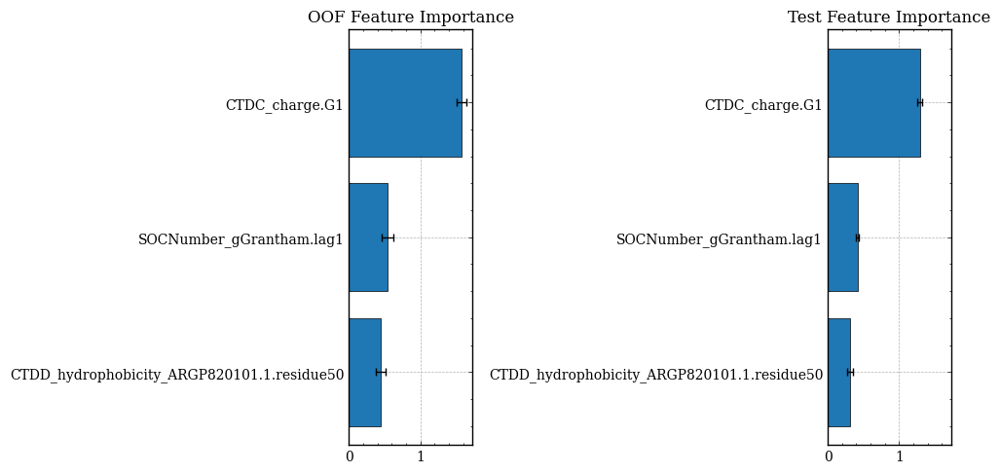

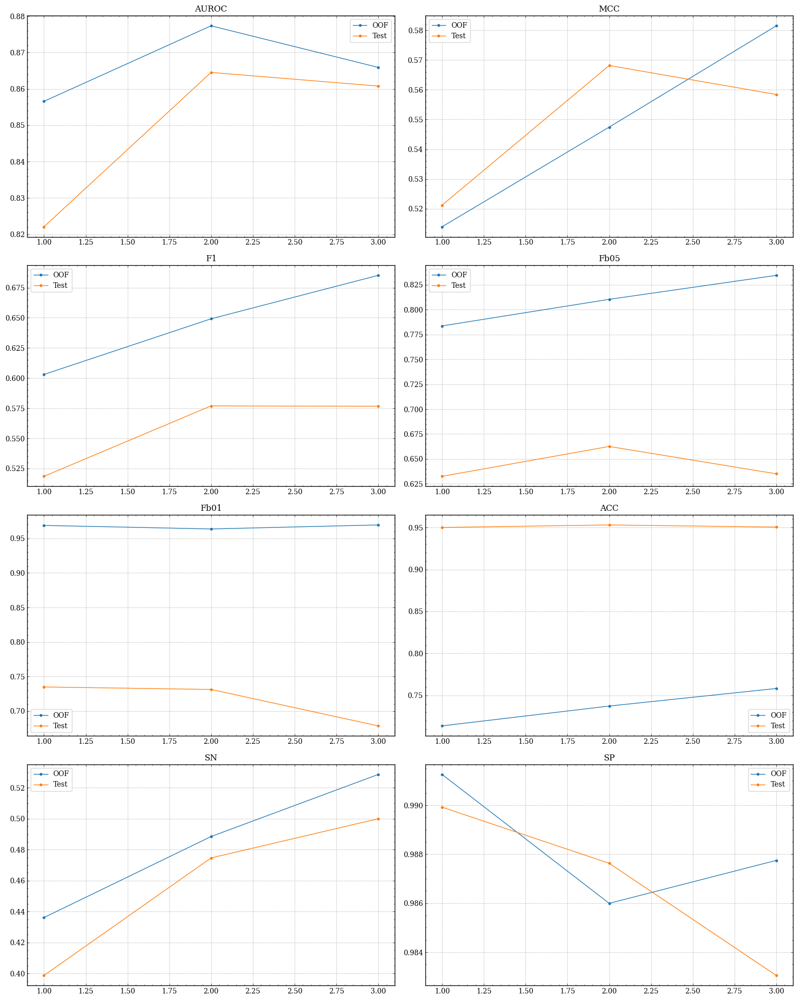

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.8s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.1s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.3s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.8s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.4s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    7.9s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.1s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   10.8s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.6s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.2s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   16.6s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.3s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   20.9s remaining:    4.1s
[Parallel(n_jobs=50)]: Done 352 out 

,Fb05,relevance
DDE_LA,0.849470,0.849470
CKSAAP_RR.gap3,0.844803,0.844803
CTDD_hydrophobicity_ZIMJ680101.2.residue0,0.844343,0.844343
DDE_DL,0.843465,0.843465
DDE_PE,0.843045,0.843045
DDE_SP,0.842926,0.842926
DDE_LN,0.842720,0.842720
DDE_RK,0.842672,0.842672
DDE_CA,0.842614,0.842614
DDE_YY,0.842500,0.842500


(375, 2)


,relevance,redundancy
AAC_A,0.828431,0.016953
AAC_H,0.836755,0.018307
AAC_T,0.830966,0.031979
AAindex_p.1.ARGP820101,0.815707,0.042160
AAindex_p.1.BEGF750103,0.825474,0.017495
AAindex_p.2.ARGP820101,0.826308,0.055771
AAindex_p.6.BHAR880101,0.815645,0.045666
ACC_ANDN920101.lag1,0.833842,0.024919
ACC_ANDN920101_ARGP820102_lag.2,0.832939,0.006002
ACC_ANDN920101_ARGP820102_lag.3,0.831125,0.005951


(375, 2)


,relevance,redundancy,score
DDE_LA,0.849470,0.015477,0.849470
CKSAAP_RR.gap3,0.844803,0.218312,0.844803
CTDD_hydrophobicity_ZIMJ680101.2.residue0,0.844343,0.021894,0.844343
DDE_DL,0.843465,0.017087,0.843465
DDE_PE,0.843045,0.008913,0.843045
DDE_SP,0.842926,0.015719,0.842926
DDE_LN,0.842720,0.009431,0.842720
DDE_RK,0.842672,0.083534,0.842672
DDE_CA,0.842614,0.012876,0.842614
DDE_YY,0.842500,0.008397,0.842500


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.4s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.8s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.1s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.8s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.3s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA
AAC_A,0.024413,0.044658,0.019490,0.006956,0.127775
AAC_H,0.018387,0.013911,0.023488,0.013047,0.000722
AAC_T,0.060931,0.025238,0.030053,0.004952,0.005018
AAindex_p.1.ARGP820101,0.070906,0.033119,0.049374,0.006201,0.005995
AAindex_p.1.BEGF750103,0.038836,0.013295,0.013649,0.000000,0.000695
AAindex_p.2.ARGP820101,0.096822,0.044530,0.044892,0.025600,0.010807
AAindex_p.6.BHAR880101,0.089743,0.035728,0.037719,0.009535,0.005916
ACC_ANDN920101.lag1,0.037008,0.019689,0.000822,0.036926,0.004001
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.004501,0.001092,0.005542,0.000000
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.004463,0.000000,0.009530,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.898946 + 0.00402713	cv_agg's valid auc: 0.886963 + 0.0324826
[200]	cv_agg's train auc: 0.911939 + 0.00434037	cv_agg's valid auc: 0.895575 + 0.0310141
[300]	cv_agg's train auc: 0.91735 + 0.00369554	cv_agg's valid auc: 0.898854 + 0.0313802
[400]	cv_agg's train auc: 0.92001 + 0.00350194	cv_agg's valid auc: 0.901143 + 0.0313935
[100]	training's auc: 0.897863	valid_1's auc: 0.863436
[200]	training's auc: 0.911101	valid_1's auc: 0.868358
[300]	training's auc: 0.917339	valid_1's auc: 0.865616
[400]	training's auc: 0.919541	valid_1's auc: 0.866193


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.901234,0.604816,0.707593,0.849470,0.974593,0.772250,0.554719,0.989504
Test_ensemble,0.869359,0.546923,0.572414,0.604956,0.627564,0.947031,0.525316,0.977554
Test_refit,0.866204,0.539701,0.566553,0.594556,0.613779,0.945750,0.525316,0.976180


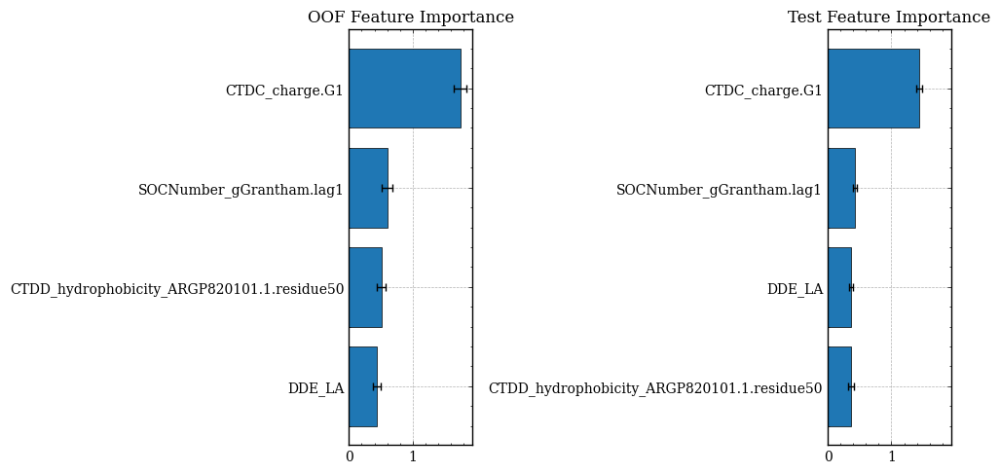

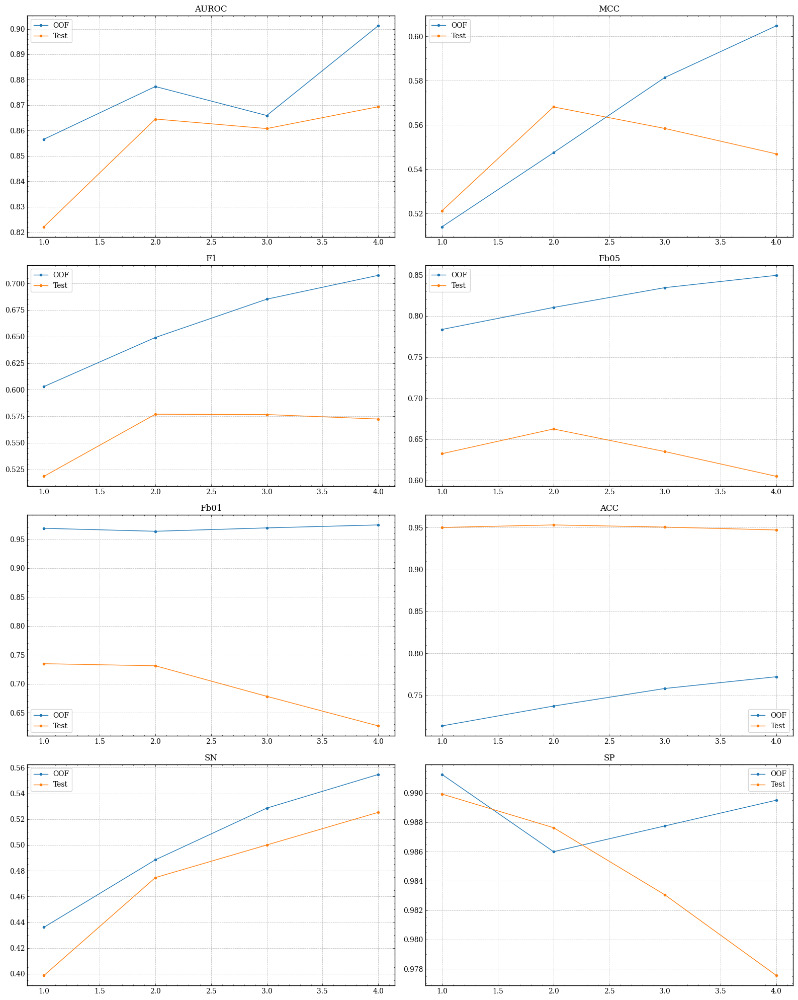

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.6s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    3.9s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.5s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.3s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.2s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    7.9s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    9.6s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   10.7s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.1s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.5s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   14.8s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   16.3s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   17.9s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   20.7s remaining:    4.0s
[Parallel(n_jobs=50)]: Done 352 out 

,Fb05,relevance
Geary_ANDN920101.lag2,0.853896,0.853896
ASDC_LW,0.853551,0.853551
CKSAAP_SR.gap4,0.852503,0.852503
ASDC_HF,0.852052,0.852052
NMBroto_ARGP820101.lag5,0.851655,0.851655
NPA,0.851137,0.851137
ZScale_p4.z5,0.851089,0.851089
CKSAAP_LL.gap4,0.851028,0.851028
ASDC_MH,0.850382,0.850382
ASDC_LT,0.850196,0.850196


(375, 2)


,relevance,redundancy
AAC_A,0.843195,0.044658
AAC_H,0.826867,0.013911
AAC_T,0.820638,0.025238
AAindex_p.1.ARGP820101,0.842431,0.033119
AAindex_p.1.BEGF750103,0.826411,0.013295
AAindex_p.2.ARGP820101,0.819453,0.044530
AAindex_p.6.BHAR880101,0.824591,0.035728
ACC_ANDN920101.lag1,0.845097,0.019689
ACC_ANDN920101_ARGP820102_lag.2,0.830102,0.004501
ACC_ANDN920101_ARGP820102_lag.3,0.824343,0.004463


(375, 2)


,relevance,redundancy,score
Geary_ANDN920101.lag2,0.853896,0.006571,0.853896
ASDC_LW,0.853551,0.022681,0.853551
CKSAAP_SR.gap4,0.852503,0.008470,0.852503
ASDC_HF,0.852052,0.000900,0.852052
NMBroto_ARGP820101.lag5,0.851655,0.000908,0.851655
NPA,0.851137,0.152888,0.851137
ZScale_p4.z5,0.851089,0.040463,0.851089
CKSAAP_LL.gap4,0.851028,0.009178,0.851028
ASDC_MH,0.850382,0.000907,0.850382
ASDC_LT,0.850196,0.013008,0.850196


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.0s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.5s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.7s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.2s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.0s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2
AAC_A,0.024413,0.035727,0.019490,0.006956,0.127775,0.000000
AAC_H,0.018387,0.011322,0.023488,0.013047,0.000722,0.000964
AAC_T,0.060931,0.020322,0.030053,0.004952,0.005018,0.000658
AAindex_p.1.ARGP820101,0.070906,0.027260,0.049374,0.006201,0.005995,0.003823
AAindex_p.1.BEGF750103,0.038836,0.010921,0.013649,0.000000,0.000695,0.001424
AAindex_p.2.ARGP820101,0.096822,0.035842,0.044892,0.025600,0.010807,0.001092
AAindex_p.6.BHAR880101,0.089743,0.029800,0.037719,0.009535,0.005916,0.006084
ACC_ANDN920101.lag1,0.037008,0.021693,0.000822,0.036926,0.004001,0.029706
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.012890,0.001092,0.005542,0.000000,0.046444
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.003571,0.000000,0.009530,0.000000,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.90398 + 0.00386858	cv_agg's valid auc: 0.888144 + 0.0325048
[200]	cv_agg's train auc: 0.913967 + 0.00418378	cv_agg's valid auc: 0.897559 + 0.0302699
[300]	cv_agg's train auc: 0.920335 + 0.00398953	cv_agg's valid auc: 0.902436 + 0.0302978
[400]	cv_agg's train auc: 0.923681 + 0.00377915	cv_agg's valid auc: 0.904663 + 0.0290629
[100]	training's auc: 0.901867	valid_1's auc: 0.871659
[200]	training's auc: 0.912872	valid_1's auc: 0.873093
[300]	training's auc: 0.919218	valid_1's auc: 0.872001
[400]	training's auc: 0.922812	valid_1's auc: 0.871369


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.905288,0.612046,0.716971,0.853896,0.972721,0.777460,0.566878,0.987780
Test_ensemble,0.872484,0.547675,0.576159,0.592643,0.603586,0.945323,0.550633,0.973889
Test_refit,0.871132,0.554542,0.581940,0.602493,0.616286,0.946604,0.550633,0.975263


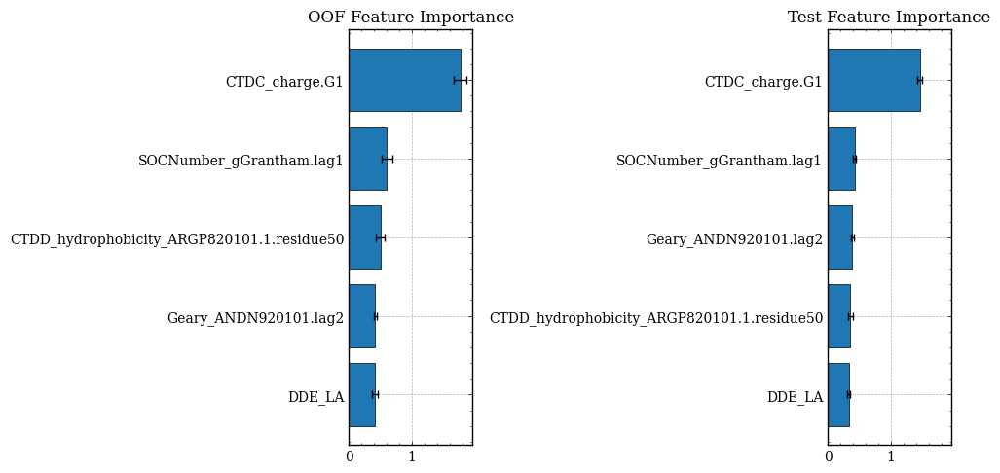

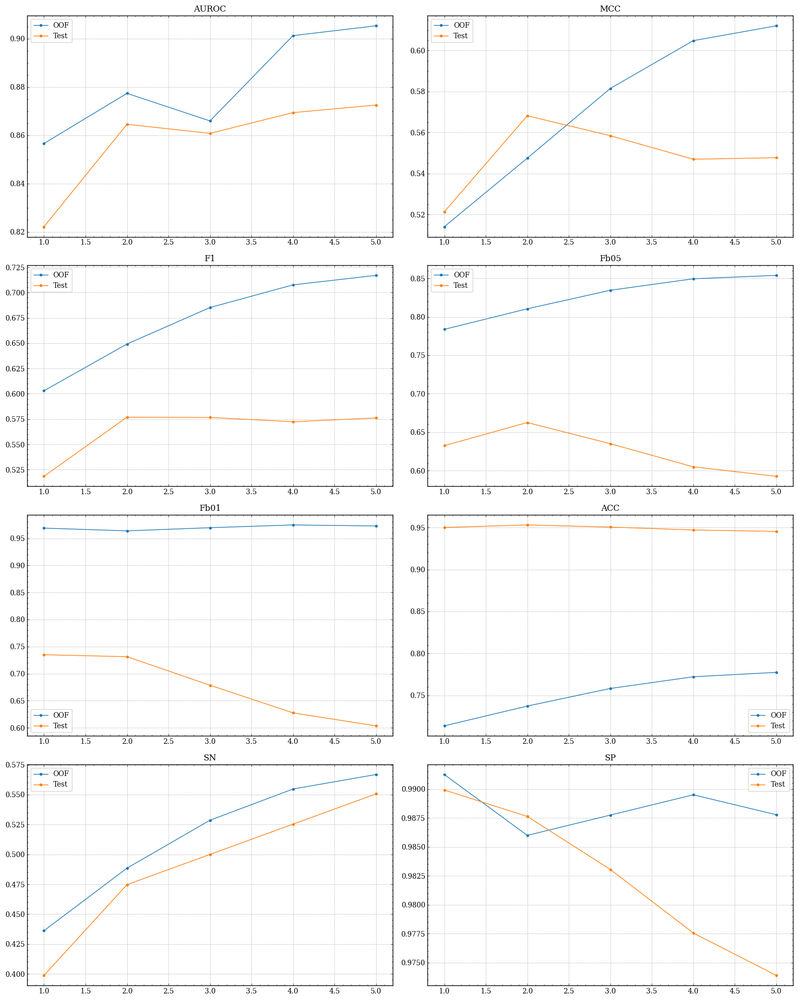

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.2s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.7s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.9s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.6s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.5s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.3s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.1s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.8s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   14.0s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.5s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   17.1s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   21.8s remaining:    4.2s
[Parallel(n_jobs=50)]: Done 352 out 

,Fb05,relevance
DDE_SP,0.861944,0.861944
ASDC_LW,0.860593,0.860593
CKSAAGP_postivecharger.uncharger.gap5,0.859578,0.859578
CTDD_hydrophobicity_ZIMJ680101.3.residue50,0.859524,0.859524
DDE_LW,0.859470,0.859470
ZScale_p4.z5,0.858903,0.858903
ACC_BEGF750102_BEGF750101_lag.1,0.858846,0.858846
CKSAAGP_uncharger.aromatic.gap9,0.858756,0.858756
CKSAAGP_postivecharger.uncharger.gap8,0.858131,0.858131
PAAC_Xc1.V,0.858128,0.858128


(375, 2)


,relevance,redundancy
AAC_A,0.852834,0.035727
AAC_H,0.856211,0.011322
AAC_T,0.852019,0.020322
AAindex_p.1.ARGP820101,0.825371,0.027260
AAindex_p.1.BEGF750103,0.851565,0.010921
AAindex_p.2.ARGP820101,0.828871,0.035842
AAindex_p.6.BHAR880101,0.854676,0.029800
ACC_ANDN920101.lag1,0.853496,0.021693
ACC_ANDN920101_ARGP820102_lag.2,0.828848,0.012890
ACC_ANDN920101_ARGP820102_lag.3,0.851465,0.003571


(375, 2)


,relevance,redundancy,score
DDE_SP,0.861944,0.011179,0.861944
ASDC_LW,0.860593,0.018145,0.860593
CKSAAGP_postivecharger.uncharger.gap5,0.859578,0.021621,0.859578
CTDD_hydrophobicity_ZIMJ680101.3.residue50,0.859524,0.036684,0.859524
DDE_LW,0.859470,0.029893,0.859470
ZScale_p4.z5,0.858903,0.033142,0.858903
ACC_BEGF750102_BEGF750101_lag.1,0.858846,0.013968,0.858846
CKSAAGP_uncharger.aromatic.gap9,0.858756,0.004575,0.858756
CKSAAGP_postivecharger.uncharger.gap8,0.858131,0.018555,0.858131
PAAC_Xc1.V,0.858128,0.060509,0.858128


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.4s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.7s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.0s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.8s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.2s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP
AAC_A,0.024413,0.030552,0.019490,0.006956,0.127775,0.000000,0.004676
AAC_H,0.018387,0.009525,0.023488,0.013047,0.000722,0.000964,0.000545
AAC_T,0.060931,0.018818,0.030053,0.004952,0.005018,0.000658,0.011297
AAindex_p.1.ARGP820101,0.070906,0.023587,0.049374,0.006201,0.005995,0.003823,0.005226
AAindex_p.1.BEGF750103,0.038836,0.009708,0.013649,0.000000,0.000695,0.001424,0.003642
AAindex_p.2.ARGP820101,0.096822,0.031473,0.044892,0.025600,0.010807,0.001092,0.009628
AAindex_p.6.BHAR880101,0.089743,0.025867,0.037719,0.009535,0.005916,0.006084,0.006207
ACC_ANDN920101.lag1,0.037008,0.018449,0.000822,0.036926,0.004001,0.029706,0.002232
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.010742,0.001092,0.005542,0.000000,0.046444,0.000000
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.002975,0.000000,0.009530,0.000000,0.000000,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.906498 + 0.00394695	cv_agg's valid auc: 0.891092 + 0.0322757
[200]	cv_agg's train auc: 0.914958 + 0.00393486	cv_agg's valid auc: 0.899376 + 0.031378
[300]	cv_agg's train auc: 0.921285 + 0.00366641	cv_agg's valid auc: 0.903326 + 0.0301555
[100]	training's auc: 0.90577	valid_1's auc: 0.870424
[200]	training's auc: 0.914187	valid_1's auc: 0.872013
[300]	training's auc: 0.920376	valid_1's auc: 0.872404


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.905391,0.623979,0.728295,0.861944,0.975932,0.784455,0.579250,0.989534
Test_ensemble,0.873550,0.557051,0.584718,0.602740,0.614746,0.946604,0.556962,0.974805
Test_refit,0.872573,0.554762,0.582781,0.599455,0.610523,0.946177,0.556962,0.974347


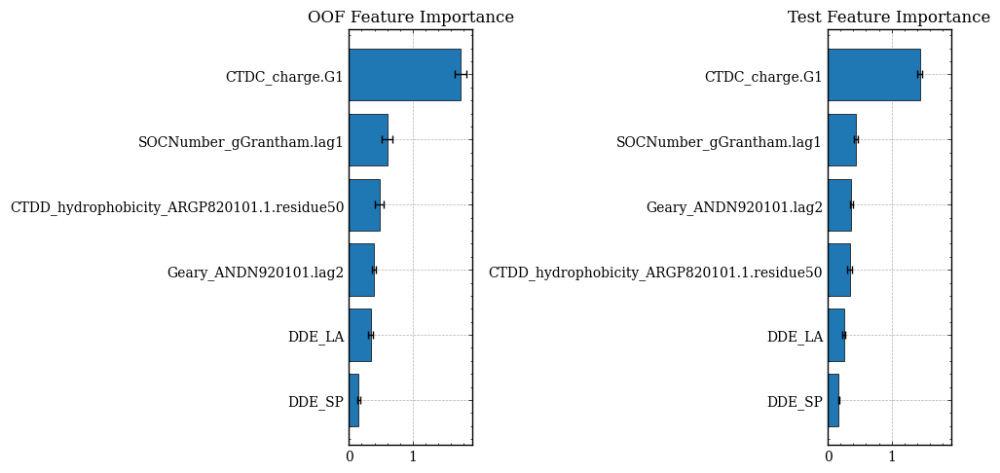

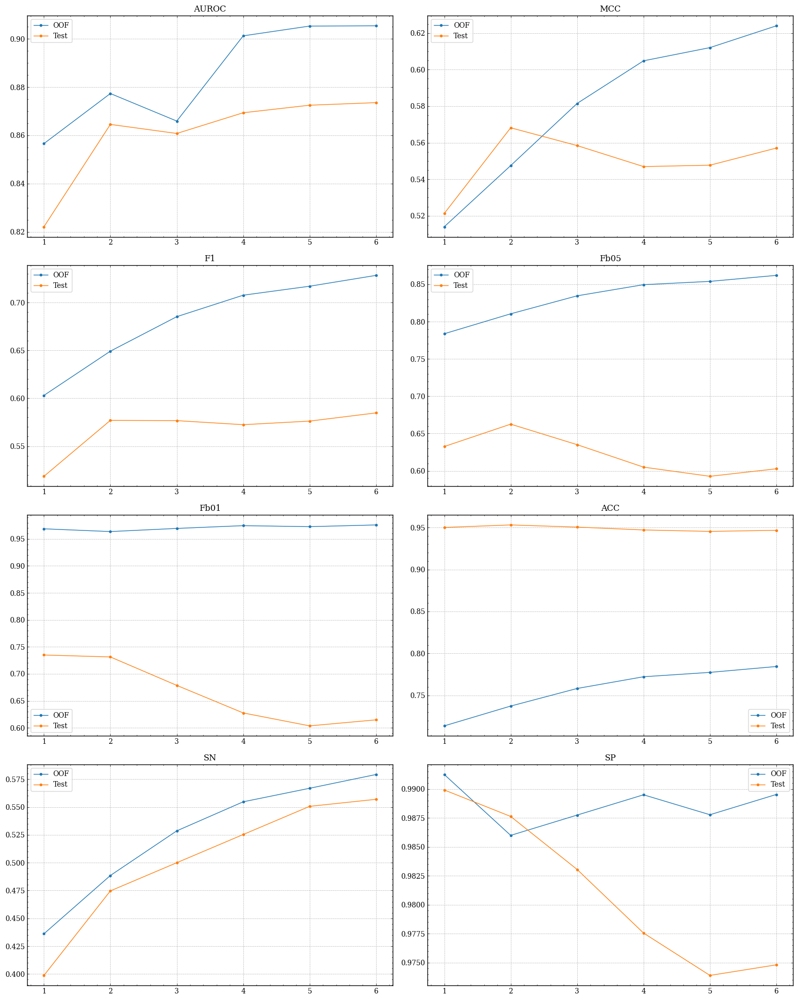

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.6s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.1s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.7s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.8s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.6s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.4s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.2s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.3s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.9s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.9s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.5s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   17.0s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   21.5s remaining:    4.2s
[Parallel(n_jobs=50)]: Done 352 out 

,Fb05,relevance
NetC,0.868414,0.868414
ASDC_QE,0.866688,0.866688
CTDT_hydrophobicity_PONP930101.Tr2332,0.866585,0.866585
ASDC_YR,0.866562,0.866562
QSOrder_Schneider.Xr.L,0.866383,0.866383
ASDC_FH,0.865857,0.865857
CKSAAP_AL.gap3,0.865759,0.865759
AAindex_p.6.BHAR880101,0.865445,0.865445
CKSAAP_VK.gap1,0.865413,0.865413
QSOrder_Schneider.Xr.H,0.865405,0.865405


(375, 2)


,relevance,redundancy
AAC_A,0.854201,0.030552
AAC_H,0.860358,0.009525
AAC_T,0.864008,0.018818
AAindex_p.1.ARGP820101,0.860834,0.023587
AAindex_p.1.BEGF750103,0.855662,0.009708
AAindex_p.2.ARGP820101,0.836600,0.031473
AAindex_p.6.BHAR880101,0.865445,0.025867
ACC_ANDN920101.lag1,0.858314,0.018449
ACC_ANDN920101_ARGP820102_lag.2,0.854909,0.010742
ACC_ANDN920101_ARGP820102_lag.3,0.857485,0.002975


(375, 2)


,relevance,redundancy,score
NetC,0.868414,0.173366,0.868414
ASDC_QE,0.866688,0.003465,0.866688
CTDT_hydrophobicity_PONP930101.Tr2332,0.866585,0.023949,0.866585
ASDC_YR,0.866562,0.018037,0.866562
QSOrder_Schneider.Xr.L,0.866383,0.045141,0.866383
ASDC_FH,0.865857,0.000763,0.865857
CKSAAP_AL.gap3,0.865759,0.017264,0.865759
AAindex_p.6.BHAR880101,0.865445,0.025867,0.865445
CKSAAP_VK.gap1,0.865413,0.000420,0.865413
QSOrder_Schneider.Xr.H,0.865405,0.008188,0.865405


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    1.0s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.4s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    2.1s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    3.0s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    3.5s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    3.8s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    4.4s remaining:    0.9s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP,NetC
AAC_A,0.024413,0.028891,0.019490,0.006956,0.127775,0.000000,0.004676,0.018929
AAC_H,0.018387,0.034990,0.023488,0.013047,0.000722,0.000964,0.000545,0.187779
AAC_T,0.060931,0.020972,0.030053,0.004952,0.005018,0.000658,0.011297,0.033895
AAindex_p.1.ARGP820101,0.070906,0.029542,0.049374,0.006201,0.005995,0.003823,0.005226,0.065268
AAindex_p.1.BEGF750103,0.038836,0.012603,0.013649,0.000000,0.000695,0.001424,0.003642,0.029974
AAindex_p.2.ARGP820101,0.096822,0.036492,0.044892,0.025600,0.010807,0.001092,0.009628,0.066607
AAindex_p.6.BHAR880101,0.089743,0.032347,0.037719,0.009535,0.005916,0.006084,0.006207,0.071226
ACC_ANDN920101.lag1,0.037008,0.017992,0.000822,0.036926,0.004001,0.029706,0.002232,0.015247
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.009304,0.001092,0.005542,0.000000,0.046444,0.000000,0.000676
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.003237,0.000000,0.009530,0.000000,0.000000,0.000000,0.004805


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP', 'NetC']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.918687 + 0.00268472	cv_agg's valid auc: 0.901698 + 0.0281004
[200]	cv_agg's train auc: 0.92595 + 0.00298289	cv_agg's valid auc: 0.908805 + 0.0270299
[300]	cv_agg's train auc: 0.932013 + 0.00308106	cv_agg's valid auc: 0.911268 + 0.0276427
[400]	cv_agg's train auc: 0.935785 + 0.00287484	cv_agg's valid auc: 0.913618 + 0.0283118
[500]	cv_agg's train auc: 0.938402 + 0.00272709	cv_agg's valid auc: 0.915492 + 0.0280474
[600]	cv_agg's train auc: 0.940434 + 0.00264002	cv_agg's valid auc: 0.916317 + 0.0277721
Early stopping, best iteration is:
[599]	cv_agg's train auc: 0.940427 + 0.00263818	cv_agg's valid auc: 0.9165 + 0.0275801
[100]	training's auc: 0.918568	valid_1's auc: 0.895993
[200]	training's auc: 0.924693	valid_1's auc: 0.897743
[300]	training's au

,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.916500,0.638272,0.748361,0.868414,0.967390,0.795843,0.608953,0.982577
Test_ensemble,0.899442,0.576022,0.602649,0.619891,0.631337,0.948740,0.575949,0.975721
Test_refit,0.898291,0.562064,0.590164,0.603217,0.611792,0.946604,0.569620,0.973889


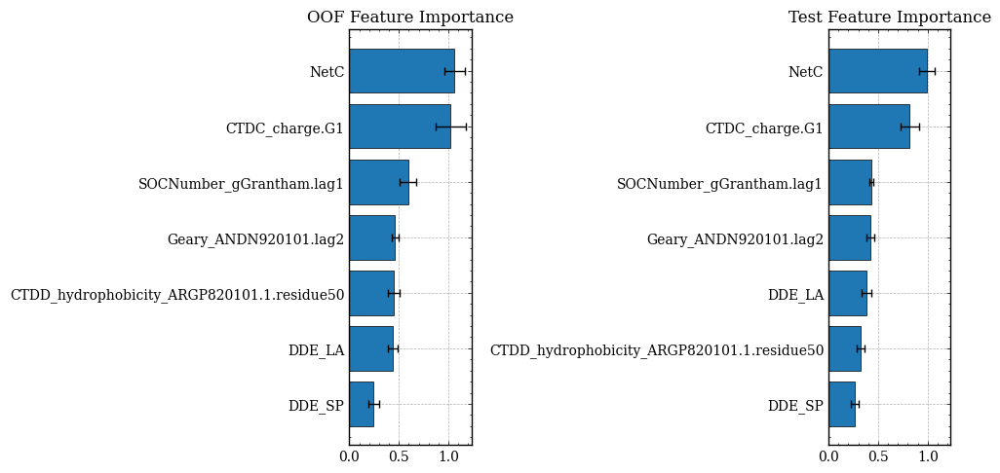

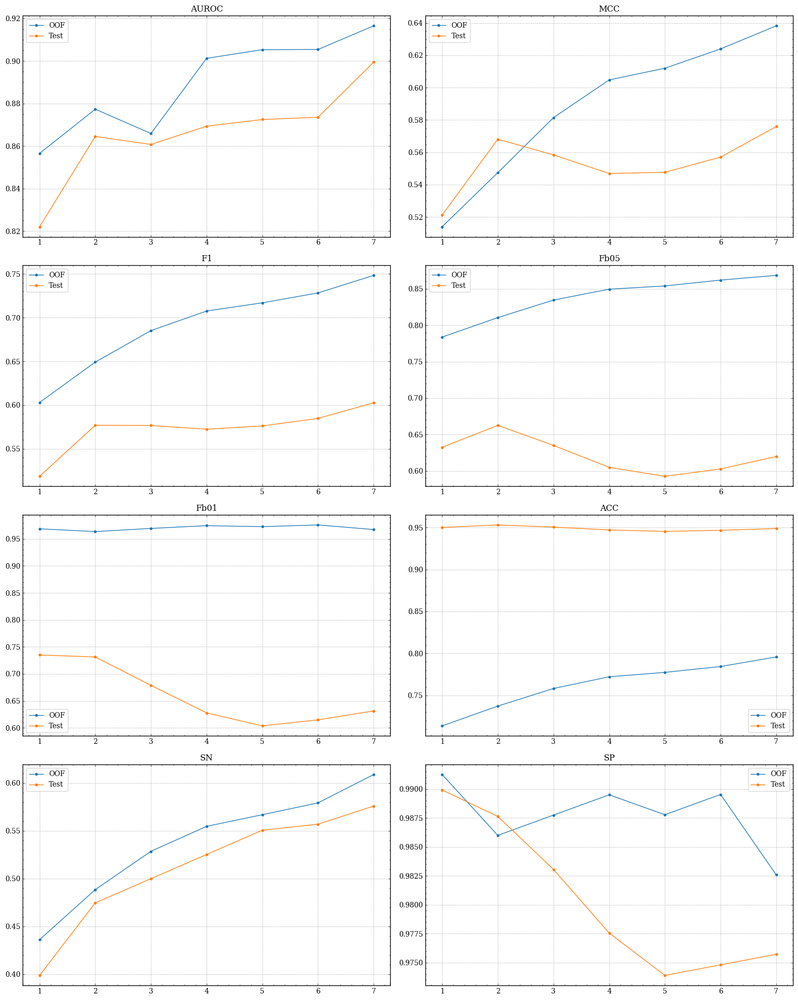

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.2s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.8s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.8s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.5s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.2s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.3s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.2s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.9s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   14.0s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.7s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   17.4s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   21.7s remaining:    4.2s
[Parallel(n_jobs=50)]: Done 352 out 

,Fb05,relevance
ASDC_VG,0.874744,0.874744
CKSAAGP_uncharger.uncharger.gap10,0.873465,0.873465
APAAC_Pc1.E,0.872903,0.872903
PAAC_Xc1.G,0.872240,0.872240
CTDT_polarity.Tr1221,0.872207,0.872207
blosum62_119,0.871907,0.871907
ASDC_EM,0.871048,0.871048
Moran_ARGP820101.lag2,0.870044,0.870044
CTDD_hydrophobicity_ENGD860101.3.residue25,0.869358,0.869358
CTDD_solventaccess.3.residue75,0.869242,0.869242


(375, 2)


,relevance,redundancy
AAC_A,0.858653,0.028891
AAC_H,0.854800,0.034990
AAC_T,0.855430,0.020972
AAindex_p.1.ARGP820101,0.868711,0.029542
AAindex_p.1.BEGF750103,0.857438,0.012603
AAindex_p.2.ARGP820101,0.863442,0.036492
AAindex_p.6.BHAR880101,0.858905,0.032347
ACC_ANDN920101.lag1,0.860768,0.017992
ACC_ANDN920101_ARGP820102_lag.2,0.862681,0.009304
ACC_ANDN920101_ARGP820102_lag.3,0.865211,0.003237


(375, 2)


,relevance,redundancy,score
ASDC_VG,0.874744,0.007745,0.874744
CKSAAGP_uncharger.uncharger.gap10,0.873465,0.014731,0.873465
APAAC_Pc1.E,0.872903,0.105808,0.872903
PAAC_Xc1.G,0.872240,0.049723,0.872240
CTDT_polarity.Tr1221,0.872207,0.065967,0.872207
blosum62_119,0.871907,0.005625,0.871907
ASDC_EM,0.871048,0.004759,0.871048
Moran_ARGP820101.lag2,0.870044,0.007272,0.870044
CTDD_hydrophobicity_ENGD860101.3.residue25,0.869358,0.037777,0.869358
CTDD_solventaccess.3.residue75,0.869242,0.042819,0.869242


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.6s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.0s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.5s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.8s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.0s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.2s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.0s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP,NetC,ASDC_VG
AAC_A,0.024413,0.025280,0.019490,0.006956,0.127775,0.000000,0.004676,0.018929,0.000000
AAC_H,0.018387,0.030838,0.023488,0.013047,0.000722,0.000964,0.000545,0.187779,0.001768
AAC_T,0.060931,0.018350,0.030053,0.004952,0.005018,0.000658,0.011297,0.033895,0.000000
AAindex_p.1.ARGP820101,0.070906,0.028596,0.049374,0.006201,0.005995,0.003823,0.005226,0.065268,0.021972
AAindex_p.1.BEGF750103,0.038836,0.012005,0.013649,0.000000,0.000695,0.001424,0.003642,0.029974,0.007818
AAindex_p.2.ARGP820101,0.096822,0.033814,0.044892,0.025600,0.010807,0.001092,0.009628,0.066607,0.015064
AAindex_p.6.BHAR880101,0.089743,0.031912,0.037719,0.009535,0.005916,0.006084,0.006207,0.071226,0.028867
ACC_ANDN920101.lag1,0.037008,0.015933,0.000822,0.036926,0.004001,0.029706,0.002232,0.015247,0.001522
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.008141,0.001092,0.005542,0.000000,0.046444,0.000000,0.000676,0.000000
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.002832,0.000000,0.009530,0.000000,0.000000,0.000000,0.004805,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP', 'NetC', 'ASDC_VG']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.919315 + 0.00278559	cv_agg's valid auc: 0.902766 + 0.0254779
[200]	cv_agg's train auc: 0.927115 + 0.00274423	cv_agg's valid auc: 0.910413 + 0.0250434
[300]	cv_agg's train auc: 0.933566 + 0.00259896	cv_agg's valid auc: 0.913961 + 0.0241185
[400]	cv_agg's train auc: 0.93734 + 0.0025589	cv_agg's valid auc: 0.915435 + 0.0251094
[500]	cv_agg's train auc: 0.940033 + 0.00246244	cv_agg's valid auc: 0.916873 + 0.0247148
[100]	training's auc: 0.919229	valid_1's auc: 0.908819
[200]	training's auc: 0.925983	valid_1's auc: 0.907597
[300]	training's auc: 0.932784	valid_1's auc: 0.909589
[400]	training's auc: 0.936714	valid_1's auc: 0.910078
[500]	training's auc: 0.939303	valid_1's auc: 0.910344


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.918047,0.648804,0.757429,0.874744,0.97030,0.801953,0.619449,0.984332
Test_ensemble,0.912671,0.599441,0.625407,0.636605,0.64391,0.950876,0.607595,0.975721
Test_refit,0.910923,0.594794,0.621359,0.629921,0.63547,0.950021,0.607595,0.974805


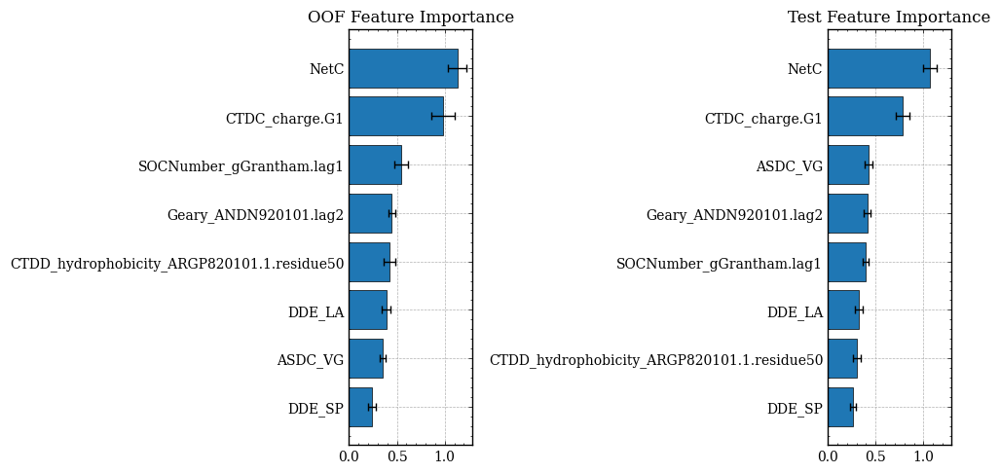

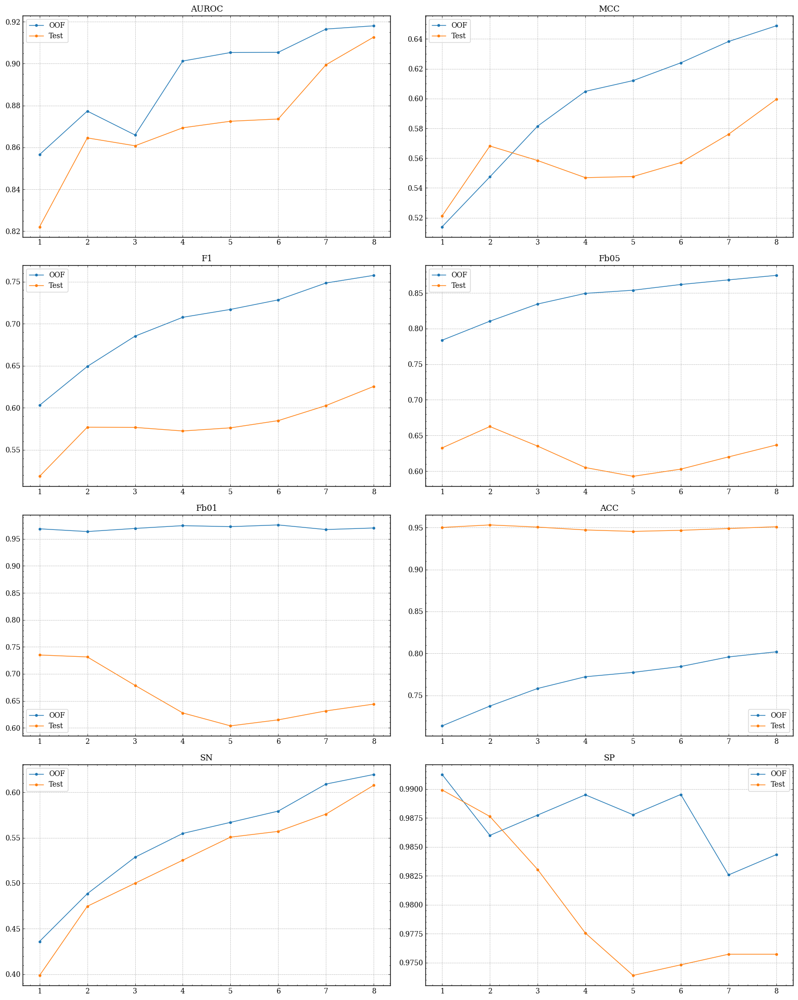

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.8s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.2s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.8s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.8s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.7s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.7s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.3s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.3s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.9s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   14.5s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.7s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   17.7s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.7s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   21.6s remaining:    4.2s
[Parallel(n_jobs=50)]: Done 352 out 

,Fb05,relevance
CTDC_solventaccess.G3,0.877607,0.877607
QSOrder_Schneider.Xr.I,0.877440,0.877440
CKSAAP_KG.gap2,0.874721,0.874721
QSOrder_Grantham.Xr.T,0.874456,0.874456
CKSAAP_LN.gap3,0.873942,0.873942
CTDD_polarizability.2.residue25,0.873656,0.873656
CTriad_g3.g1.g6,0.873222,0.873222
ASDC_YR,0.872653,0.872653
ZScale_p1.z5,0.872350,0.872350
CKSAAP_LL.gap4,0.872228,0.872228


(375, 2)


,relevance,redundancy
AAC_A,0.853959,0.025280
AAC_H,0.864462,0.030838
AAC_T,0.857943,0.018350
AAindex_p.1.ARGP820101,0.862901,0.028596
AAindex_p.1.BEGF750103,0.860059,0.012005
AAindex_p.2.ARGP820101,0.852198,0.033814
AAindex_p.6.BHAR880101,0.862240,0.031912
ACC_ANDN920101.lag1,0.846528,0.015933
ACC_ANDN920101_ARGP820102_lag.2,0.866161,0.008141
ACC_ANDN920101_ARGP820102_lag.3,0.860519,0.002832


(375, 2)


,relevance,redundancy,score
CTDC_solventaccess.G3,0.877607,0.058180,0.877607
QSOrder_Schneider.Xr.I,0.877440,0.015660,0.877440
CKSAAP_KG.gap2,0.874721,0.002220,0.874721
QSOrder_Grantham.Xr.T,0.874456,0.019346,0.874456
CKSAAP_LN.gap3,0.873942,0.000233,0.873942
CTDD_polarizability.2.residue25,0.873656,0.023309,0.873656
CTriad_g3.g1.g6,0.873222,0.002191,0.873222
ASDC_YR,0.872653,0.019354,0.872653
ZScale_p1.z5,0.872350,0.027589,0.872350
CKSAAP_LL.gap4,0.872228,0.004762,0.872228


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    1.0s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.8s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    2.0s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    2.2s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.8s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.9s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    3.3s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.7s remaining:    0.7s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP,NetC,ASDC_VG,CTDC_solventaccess.G3
AAC_A,0.024413,0.026817,0.019490,0.006956,0.127775,0.000000,0.004676,0.018929,0.000000,0.039118
AAC_H,0.018387,0.038190,0.023488,0.013047,0.000722,0.000964,0.000545,0.187779,0.001768,0.097008
AAC_T,0.060931,0.035755,0.030053,0.004952,0.005018,0.000658,0.011297,0.033895,0.000000,0.174995
AAindex_p.1.ARGP820101,0.070906,0.029434,0.049374,0.006201,0.005995,0.003823,0.005226,0.065268,0.021972,0.036144
AAindex_p.1.BEGF750103,0.038836,0.011112,0.013649,0.000000,0.000695,0.001424,0.003642,0.029974,0.007818,0.003968
AAindex_p.2.ARGP820101,0.096822,0.035849,0.044892,0.025600,0.010807,0.001092,0.009628,0.066607,0.015064,0.052132
AAindex_p.6.BHAR880101,0.089743,0.034258,0.037719,0.009535,0.005916,0.006084,0.006207,0.071226,0.028867,0.053024
ACC_ANDN920101.lag1,0.037008,0.014440,0.000822,0.036926,0.004001,0.029706,0.002232,0.015247,0.001522,0.002498
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.007337,0.001092,0.005542,0.000000,0.046444,0.000000,0.000676,0.000000,0.000903
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.002747,0.000000,0.009530,0.000000,0.000000,0.000000,0.004805,0.000000,0.002069


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP', 'NetC', 'ASDC_VG', 'CTDC_solventaccess.G3']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.920436 + 0.00277897	cv_agg's valid auc: 0.90474 + 0.0239068
[200]	cv_agg's train auc: 0.928538 + 0.002591	cv_agg's valid auc: 0.911317 + 0.0227781
[300]	cv_agg's train auc: 0.934401 + 0.00274198	cv_agg's valid auc: 0.915094 + 0.0216458
[400]	cv_agg's train auc: 0.938105 + 0.00264072	cv_agg's valid auc: 0.916151 + 0.0224225
[100]	training's auc: 0.919958	valid_1's auc: 0.914238
[200]	training's auc: 0.927402	valid_1's auc: 0.915892
[300]	training's auc: 0.933466	valid_1's auc: 0.916949
[400]	training's auc: 0.937346	valid_1's auc: 0.917922


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.917784,0.654511,0.762529,0.877607,0.970948,0.805431,0.626376,0.984332
Test_ensemble,0.919716,0.599962,0.624161,0.647632,0.663441,0.952157,0.588608,0.978470
Test_refit,0.918194,0.597484,0.622074,0.644044,0.658788,0.951730,0.588608,0.978012


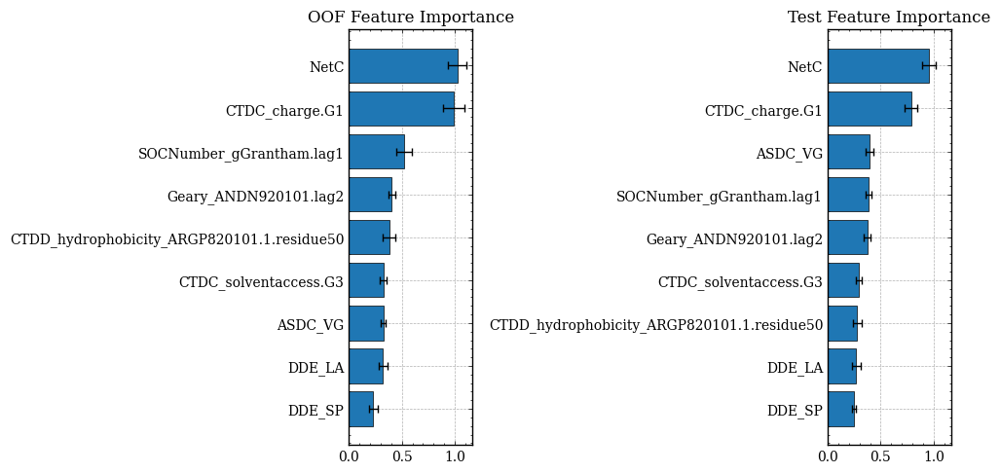

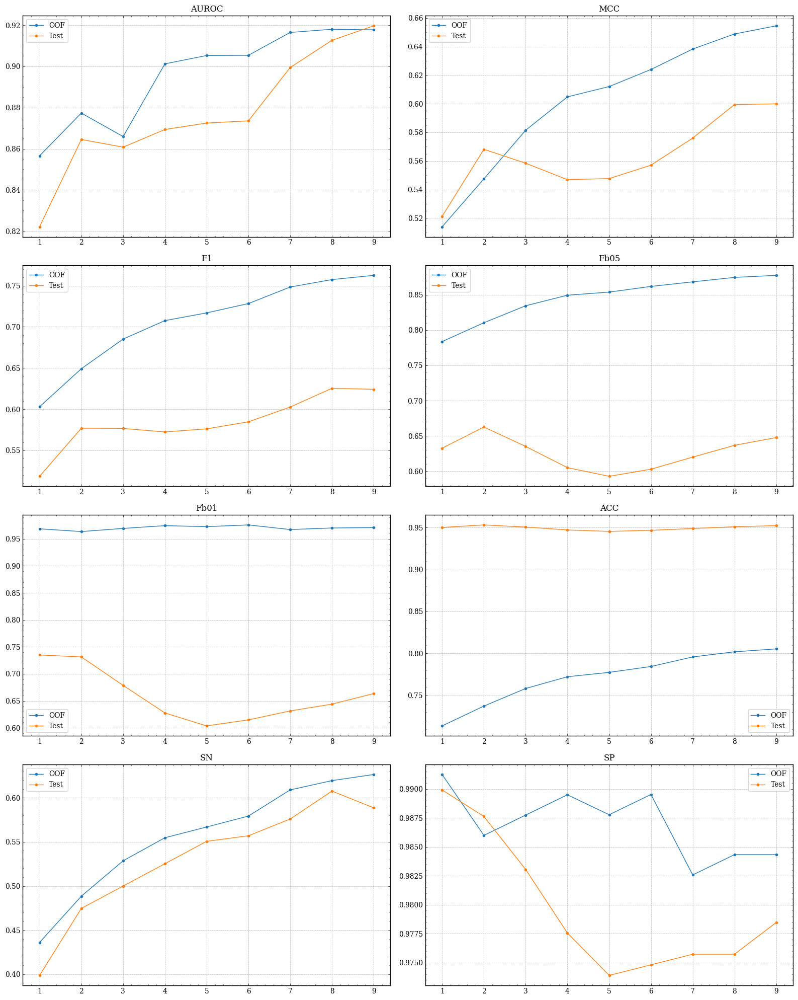

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.3s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    5.0s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.6s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.8s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.7s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.2s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.4s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.7s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   14.3s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.6s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   17.3s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.5s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   21.9s remaining:    4.2s
[Parallel(n_jobs=50)]: Done 352 out 

,Fb05,relevance
APAAC_Pc1.V,0.881261,0.881261
ASDC_PI,0.881252,0.881252
CKSAAGP_postivecharger.uncharger.gap8,0.880762,0.880762
CKSAAGP_aromatic.uncharger.gap4,0.880722,0.880722
ASDC_YQ,0.879858,0.879858
CTDD_hydrophobicity_CASG920101.1.residue25,0.879688,0.879688
QSOrder_Schneider.Xr.H,0.879615,0.879615
CTDC_charge.G3,0.879498,0.879498
ACC_BEGF750101_BEGF750103_lag.2,0.879468,0.879468
ASDC_LL,0.878952,0.878952


(375, 2)


,relevance,redundancy
AAC_A,0.866903,0.026817
AAC_H,0.872368,0.038190
AAC_T,0.874388,0.035755
AAindex_p.1.ARGP820101,0.877578,0.029434
AAindex_p.1.BEGF750103,0.871674,0.011112
AAindex_p.2.ARGP820101,0.840508,0.035849
AAindex_p.6.BHAR880101,0.870790,0.034258
ACC_ANDN920101.lag1,0.869314,0.014440
ACC_ANDN920101_ARGP820102_lag.2,0.871484,0.007337
ACC_ANDN920101_ARGP820102_lag.3,0.862909,0.002747


(375, 2)


,relevance,redundancy,score
APAAC_Pc1.V,0.881261,0.084904,0.881261
ASDC_PI,0.881252,0.003203,0.881252
CKSAAGP_postivecharger.uncharger.gap8,0.880762,0.020243,0.880762
CKSAAGP_aromatic.uncharger.gap4,0.880722,0.011375,0.880722
ASDC_YQ,0.879858,0.003851,0.879858
CTDD_hydrophobicity_CASG920101.1.residue25,0.879688,0.025889,0.879688
QSOrder_Schneider.Xr.H,0.879615,0.032097,0.879615
CTDC_charge.G3,0.879498,0.100693,0.879498
ACC_BEGF750101_BEGF750103_lag.2,0.879468,0.002047,0.879468
ASDC_LL,0.878952,0.027757,0.878952


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    2.1s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    3.0s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    3.5s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    3.9s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    4.3s remaining:    0.8s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP,NetC,ASDC_VG,CTDC_solventaccess.G3,APAAC_Pc1.V
AAC_A,0.024413,0.028261,0.019490,0.006956,0.127775,0.000000,0.004676,0.018929,0.000000,0.039118,0.041255
AAC_H,0.018387,0.036917,0.023488,0.013047,0.000722,0.000964,0.000545,0.187779,0.001768,0.097008,0.025460
AAC_T,0.060931,0.036524,0.030053,0.004952,0.005018,0.000658,0.011297,0.033895,0.000000,0.174995,0.043446
AAindex_p.1.ARGP820101,0.070906,0.029656,0.049374,0.006201,0.005995,0.003823,0.005226,0.065268,0.021972,0.036144,0.031654
AAindex_p.1.BEGF750103,0.038836,0.012019,0.013649,0.000000,0.000695,0.001424,0.003642,0.029974,0.007818,0.003968,0.020185
AAindex_p.2.ARGP820101,0.096822,0.035039,0.044892,0.025600,0.010807,0.001092,0.009628,0.066607,0.015064,0.052132,0.027747
AAindex_p.6.BHAR880101,0.089743,0.033934,0.037719,0.009535,0.005916,0.006084,0.006207,0.071226,0.028867,0.053024,0.031017
ACC_ANDN920101.lag1,0.037008,0.013161,0.000822,0.036926,0.004001,0.029706,0.002232,0.015247,0.001522,0.002498,0.001646
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.006603,0.001092,0.005542,0.000000,0.046444,0.000000,0.000676,0.000000,0.000903,0.000000
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.002529,0.000000,0.009530,0.000000,0.000000,0.000000,0.004805,0.000000,0.002069,0.000564


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP', 'NetC', 'ASDC_VG', 'CTDC_solventaccess.G3', 'APAAC_Pc1.V']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.918468 + 0.00288423	cv_agg's valid auc: 0.903734 + 0.0230787
[200]	cv_agg's train auc: 0.927793 + 0.00260694	cv_agg's valid auc: 0.910334 + 0.0224967
[300]	cv_agg's train auc: 0.93379 + 0.00272265	cv_agg's valid auc: 0.913786 + 0.0219653
[400]	cv_agg's train auc: 0.937791 + 0.00265479	cv_agg's valid auc: 0.916347 + 0.0217603
[500]	cv_agg's train auc: 0.940591 + 0.00258033	cv_agg's valid auc: 0.918114 + 0.022279
[600]	cv_agg's train auc: 0.942788 + 0.00245492	cv_agg's valid auc: 0.919151 + 0.0214421
Early stopping, best iteration is:
[590]	cv_agg's train auc: 0.942589 + 0.00246324	cv_agg's valid auc: 0.919335 + 0.0217149
[100]	training's auc: 0.917791	valid_1's auc: 0.912864
[200]	training's auc: 

,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.919335,0.661596,0.769125,0.881261,0.971489,0.809802,0.635178,0.984332
Test_ensemble,0.918296,0.625630,0.649007,0.667575,0.679901,0.954720,0.620253,0.978928
Test_refit,0.916021,0.622788,0.647059,0.660000,0.668472,0.953866,0.626582,0.977554


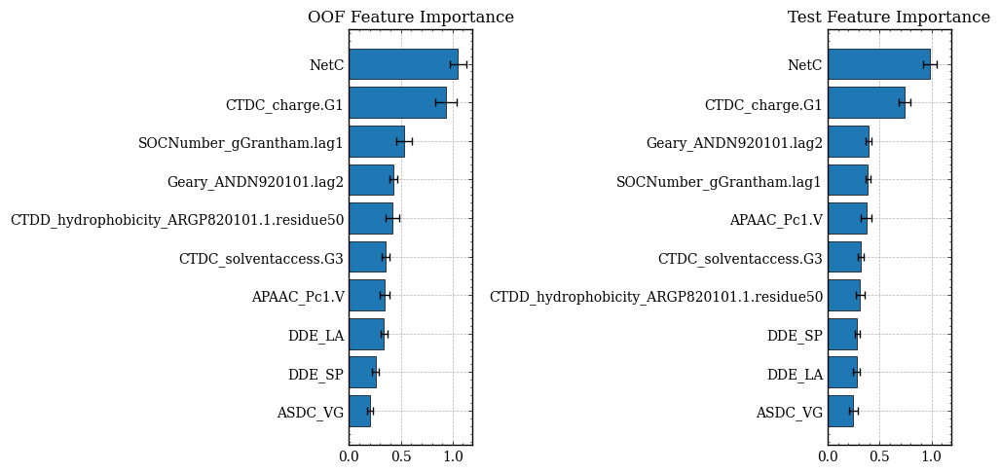

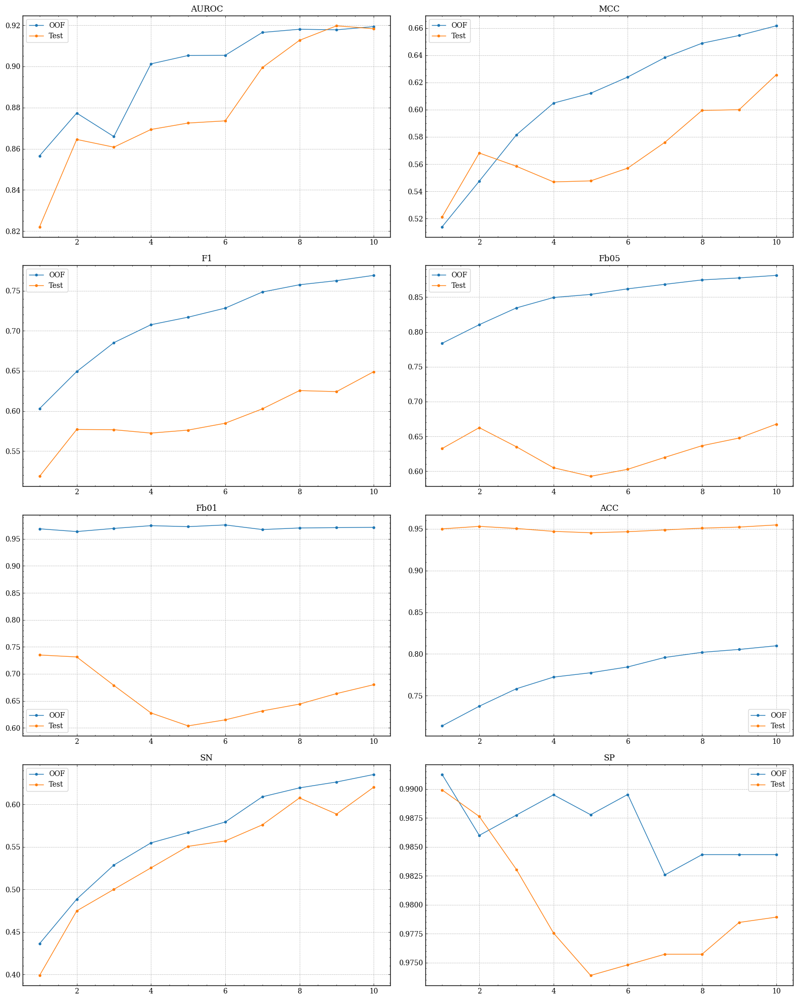

In [11]:
if not sys.warnoptions:
    warnings.simplefilter('ignore')
    os.environ["PYTHONWARNINGS"] = 'ignore'
    
γ = 0.0
fold = 'OOF'
metrics = ['Fb05']
selected_features = []
desired_features_number = 10
relevance_dict = dict()
redundancy_dict = dict()
history = []

for i in range(desired_features_number):
    
    ## Compute relevance
    relevance_tmp = Parallel(n_jobs=50, verbose=10)(delayed(compute_relevance)(train=train,
                                                                               test=test,
                                                                               feature=feature,
                                                                               selected_features=selected_features,
                                                                               target=TARGET,
                                                                               num_folds=NUM_FOLDS,
                                                                               num_repeats=NUM_REPEATS,
                                                                               seed=SEED,
                                                                               params=PARAMS_GB,
                                                                               metrics=metrics,
                                                                               optimization_fold=fold) for feature in features)
    relevance_dict[repr(selected_features)] = dict(relevance_tmp)
    relevance_df = pd.DataFrame(data=relevance_dict[repr(selected_features)].values(),
                                index=relevance_dict[repr(selected_features)].keys(),
                                columns=metrics)
    relevance_df['relevance'] = relevance_df[metrics].mean(axis=1)
    display(relevance_df.sort_values('relevance', ascending=False).head(10))
    print(relevance_df.shape)
    
    ## Select best feature
    if len(selected_features) == 0:
        last_selected_feature = relevance_df['relevance'].idxmax()
        selected_features.append(last_selected_feature)
    else:
        score_df = pd.merge(relevance_df['relevance'], redundancy_df['redundancy'], left_index=True, right_index=True)
        display(score_df.head(10))
        print(score_df.shape)
        score_df['score'] = score_df['relevance'] - γ * score_df['redundancy']
        display(score_df.sort_values('score', ascending=False).head(10))
        last_selected_feature = score_df['score'].idxmax()
        selected_features.append(last_selected_feature)


    ## Compute redundancy
    redudancy_tmp = Parallel(n_jobs=50, verbose=10)(delayed(compute_redundancy)(comb=comb,
                                                                                feature1=last_selected_feature,
                                                                                feature2=feature,
                                                                                num_folds=NUM_FOLDS,
                                                                                seed=SEED,
                                                                                params=PARAMS_GB) for feature in features)
    redundancy_dict[last_selected_feature] = dict(redudancy_tmp)
    if len(selected_features) == 1:
        redundancy_df = pd.DataFrame(data=redundancy_dict[last_selected_feature].values(),
                                     index=redundancy_dict[last_selected_feature].keys(),
                                     columns=[last_selected_feature])
        redundancy_df['redundancy'] = redundancy_df[last_selected_feature]
    else:
        redundancy_df = pd.merge(redundancy_df, pd.DataFrame(data=redundancy_dict[last_selected_feature].values(),
                                     index=redundancy_dict[last_selected_feature].keys(),
                                     columns=[last_selected_feature]), left_index=True, right_index=True)
        
        redundancy_df['redundancy'] = redundancy_df[selected_features].mean(axis=1)
    
    display(redundancy_df.head(10))
    print(relevance_df.shape)
    print(selected_features)
    
    ## Compute results
    oof_results, test_results = cross_validate(train=train,
                                               test=test,
                                               features=selected_features,
                                               target=TARGET,
                                               num_folds=NUM_FOLDS,
                                               num_repeats=NUM_REPEATS,
                                               seed=SEED,
                                               params={**PARAMS_GB, **{'scale_pos_weight': 0.1, 'num_leaves': 2}},
                                               threshold=0.5,
                                               feval=None,
                                               refit=True,
                                               compute_oof_importance=True,
                                               compute_test_importance=True)
    res = print_results(oof_results, test_results, return_metrics=True)
    history.append(res)
    plot_importance(oof_results, test_results, selected_features, max_features=20)
    
    ## Plot progress
    history_df = pd.concat(history, keys=range(1, desired_features_number+1))
    history_df.reset_index(1, inplace=True)
    fig, axs = plt.subplots(4, 2, figsize=(16,20))
    for i, (ax, metric) in enumerate(zip(axs.flat, ['AUROC', 'MCC', 'F1', 'Fb05', 'Fb01', 'ACC', 'SN', 'SP'])): 
        history_df[history_df['fold']=='OOF'][metric].plot(style='.-', ax=ax, label='OOF')
        history_df[history_df['fold']=='Test_ensemble'][metric].plot(style='.-', ax=ax, label='Test')
        ax.legend()
        ax.set_title(metric)
    plt.tight_layout()
    plt.show()

In [4]:
selected_features = ['CTDC_charge.G1',
                     'CTDD_hydrophobicity_ARGP820101.1.residue50',
                     'SOCNumber_gGrantham.lag1',
                     'DDE_LA',
                     'Geary_ANDN920101.lag2',
                     'DDE_SP',
                     'NetC',
                     'ASDC_VG',
                     'CTDC_solventaccess.G3',
                     'APAAC_Pc1.V']

Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.918468 + 0.00288423	cv_agg's valid auc: 0.903734 + 0.0230787
[200]	cv_agg's train auc: 0.927793 + 0.00260694	cv_agg's valid auc: 0.910334 + 0.0224967
[300]	cv_agg's train auc: 0.93379 + 0.00272265	cv_agg's valid auc: 0.913786 + 0.0219653
[400]	cv_agg's train auc: 0.937791 + 0.00265479	cv_agg's valid auc: 0.916347 + 0.0217603
[500]	cv_agg's train auc: 0.940591 + 0.00258033	cv_agg's valid auc: 0.918114 + 0.022279
[600]	cv_agg's train auc: 0.942788 + 0.00245492	cv_agg's valid auc: 0.919151 + 0.0214421
[100]	training's auc: 0.917791	valid_1's auc: 0.912864
[200]	training's auc: 0.926656	valid_1's auc: 0.915841
[300]	training's auc: 0.932587	valid_1's auc: 0.916444
[400]	training's auc: 0.936803	valid_1's auc: 0.916963
[500]	training's auc: 0.939771	valid_1's auc: 0.917334


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.919335,0.661596,0.769125,0.881261,0.971489,0.809802,0.635178,0.984332
Test_ensemble,0.918296,0.625630,0.649007,0.667575,0.679901,0.954720,0.620253,0.978928
Test_refit,0.916021,0.622788,0.647059,0.660000,0.668472,0.953866,0.626582,0.977554


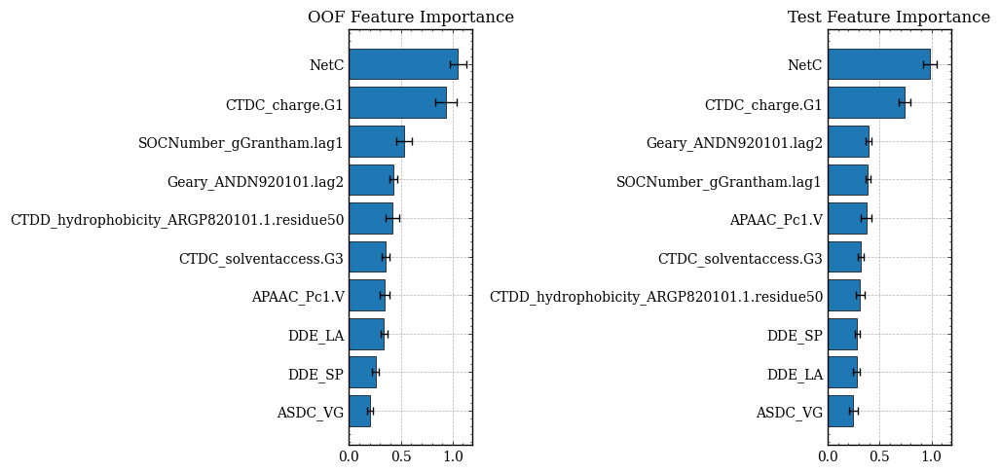

In [8]:
oof_results, test_results = cross_validate(train=train,
                                           test=test,
                                           features=selected_features,
                                           target=TARGET,
                                           num_folds=NUM_FOLDS,
                                           num_repeats=NUM_REPEATS,
                                           seed=SEED,
                                           params={**PARAMS_GB, **{'scale_pos_weight': 0.1, 'num_leaves': 2}},
                                           threshold=0.5,
                                           feval=None,
                                           refit=True,
                                           compute_oof_importance=True,
                                           compute_test_importance=True)
print_results(oof_results, test_results)
plot_importance(oof_results, test_results, selected_features, max_features=20)

### Optimizing for interpretability

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.4s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.0s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.3s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.1s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    6.9s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    7.8s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    9.2s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   10.5s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   11.8s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.0s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   14.3s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   15.8s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   17.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   20.4s remaining:    4.0s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
CTDC_charge.G1,0.513976,0.513976
GAAC_postivecharge,0.495740,0.495740
NetC,0.442028,0.442028
CKSAAGP_postivecharger.postivecharger.gap3,0.424865,0.424865
CKSAAGP_postivecharger.postivecharger.gap1,0.410981,0.410981
KSCTriad_g5.g5.g5.gap1,0.400022,0.400022
APAAC_Pc2.Hydrophobicity.1,0.385085,0.385085
CKSAAP_RR.gap3,0.371611,0.371611
CKSAAP_RR.gap2,0.351941,0.351941
HBD_minus_HBA,0.346272,0.346272


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.


(375, 2)


[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.5s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.8s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    2.0s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    2.3s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.7s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    3.1s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    3.3s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    3.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    4.1s remaining:    0.8s
[Parallel(n_jobs=50)]: Done 352 out of 375 | elapsed:    4.7s remaining:    0.3s
[Parallel(n_jobs=50)]: Done 375 

,CTDC_charge.G1,redundancy
AAC_A,0.024413,0.024413
AAC_H,0.018387,0.018387
AAC_T,0.060931,0.060931
AAindex_p.1.ARGP820101,0.070906,0.070906
AAindex_p.1.BEGF750103,0.038836,0.038836
AAindex_p.2.ARGP820101,0.096822,0.096822
AAindex_p.6.BHAR880101,0.089743,0.089743
ACC_ANDN920101.lag1,0.037008,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.011372
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.008323


(375, 2)
['CTDC_charge.G1']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.866139 + 0.00526532	cv_agg's valid auc: 0.855575 + 0.0332041
[100]	training's auc: 0.860797	valid_1's auc: 0.822851


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.856574,0.513976,0.602998,0.78372,0.968749,0.713776,0.436146,0.991258
Test_ensemble,0.822108,0.521245,0.518519,0.63253,0.734927,0.950021,0.398734,0.989922
Test_refit,0.822851,0.521245,0.518519,0.63253,0.734927,0.950021,0.398734,0.989922


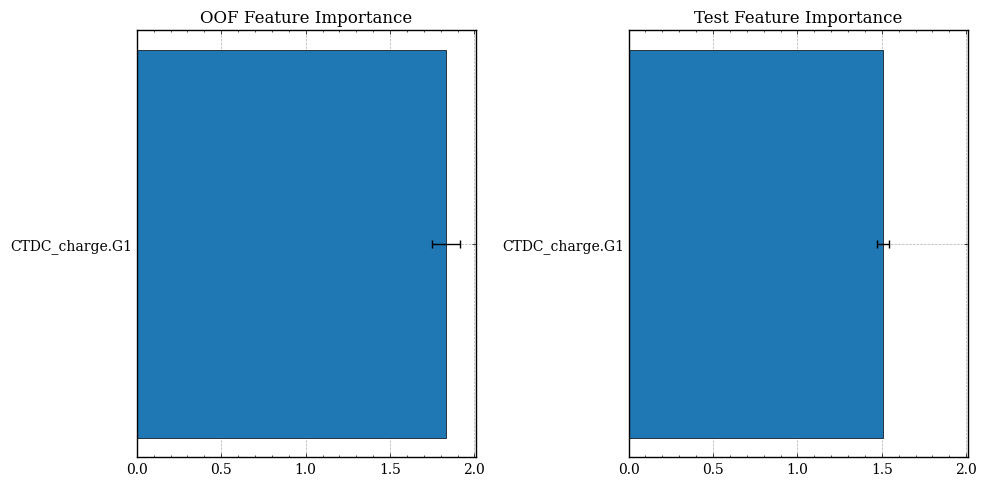

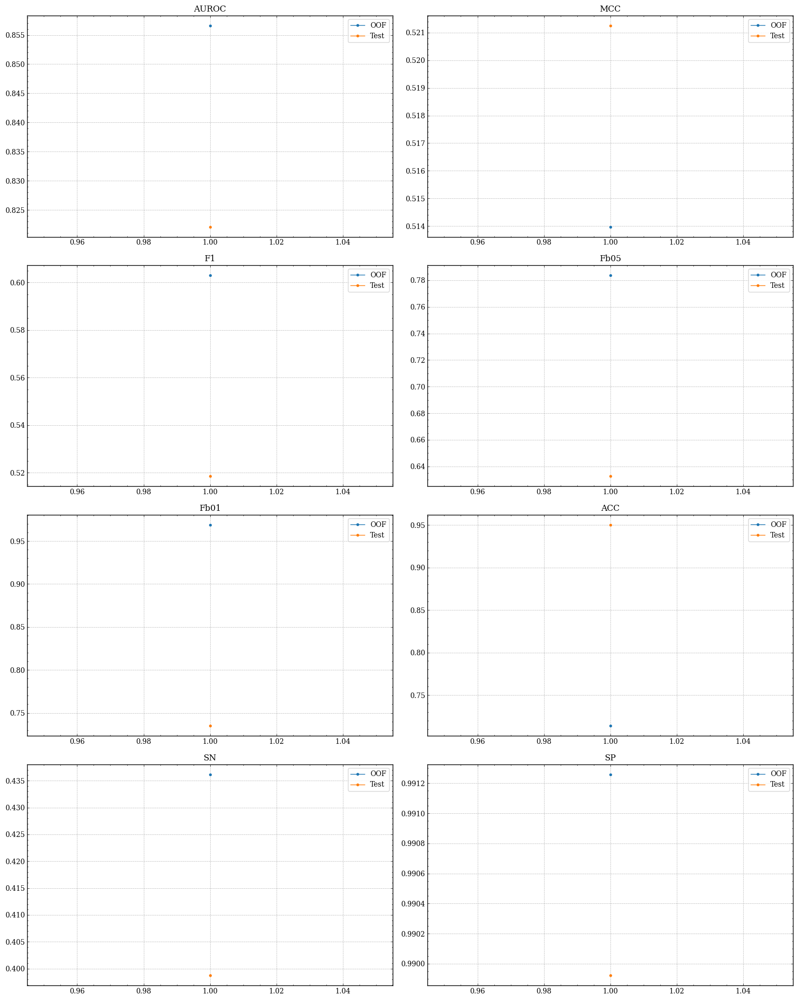

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.5s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.0s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.5s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.2s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.1s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.2s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    9.2s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   10.7s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.0s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.1s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   14.8s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   16.1s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   17.7s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   20.8s remaining:    4.0s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
CTDD_hydrophobicity_ARGP820101.1.residue50,0.547454,0.547454
CTDT_hydrophobicity_ARGP820101.Tr1221,0.546862,0.546862
SOCNumber_gGrantham.lag1,0.545766,0.545766
PAAC_Xc1.L,0.544433,0.544433
CTDD_hydrophobicity_CASG920101.1.residue25,0.544282,0.544282
ASDC_LW,0.542759,0.542759
CTDC_hydrophobicity_ARGP820101.G1,0.541760,0.541760
DDE_SP,0.541571,0.541571
DDE_LA,0.541538,0.541538
CTDT_hydrophobicity_ARGP820101.Tr2332,0.540191,0.540191


(375, 2)


,relevance,redundancy
AAC_A,0.523516,0.024413
AAC_H,0.523431,0.018387
AAC_T,0.513976,0.060931
AAindex_p.1.ARGP820101,0.514187,0.070906
AAindex_p.1.BEGF750103,0.513976,0.038836
AAindex_p.2.ARGP820101,0.513976,0.096822
AAindex_p.6.BHAR880101,0.514187,0.089743
ACC_ANDN920101.lag1,0.515411,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.513976,0.011372
ACC_ANDN920101_ARGP820102_lag.3,0.511121,0.008323


(375, 2)


,relevance,redundancy,score
CTDD_hydrophobicity_ARGP820101.1.residue50,0.547454,0.115756,0.547454
CTDT_hydrophobicity_ARGP820101.Tr1221,0.546862,0.025171,0.546862
SOCNumber_gGrantham.lag1,0.545766,0.133669,0.545766
PAAC_Xc1.L,0.544433,0.113345,0.544433
CTDD_hydrophobicity_CASG920101.1.residue25,0.544282,0.011271,0.544282
ASDC_LW,0.542759,0.009288,0.542759
DDE_SP,0.541571,0.023502,0.541571
DDE_LA,0.541538,0.022321,0.541538
CTDT_hydrophobicity_ARGP820101.Tr2332,0.540191,0.060435,0.540191
CKSAAP_LL.gap3,0.538799,0.008324,0.538799


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    1.0s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.5s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.8s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    2.0s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    2.2s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.3s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.7s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.9s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    3.3s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.7s remaining:    0.7s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50
AAC_A,0.024413,0.024413,0.019490
AAC_H,0.018387,0.023488,0.023488
AAC_T,0.060931,0.060931,0.030053
AAindex_p.1.ARGP820101,0.070906,0.070906,0.049374
AAindex_p.1.BEGF750103,0.038836,0.038836,0.013649
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.011372,0.001092
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.008323,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.877662 + 0.00409502	cv_agg's valid auc: 0.869928 + 0.0323512
[200]	cv_agg's train auc: 0.890752 + 0.00395121	cv_agg's valid auc: 0.877102 + 0.0342201
[100]	training's auc: 0.87772	valid_1's auc: 0.864659
[200]	training's auc: 0.892973	valid_1's auc: 0.860214


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.877333,0.547454,0.649165,0.810437,0.963649,0.737361,0.488506,0.985995
Test_ensemble,0.864526,0.568155,0.576923,0.662544,0.731319,0.953012,0.474684,0.987632
Test_refit,0.860200,0.564956,0.574713,0.657895,0.724326,0.952584,0.474684,0.987174


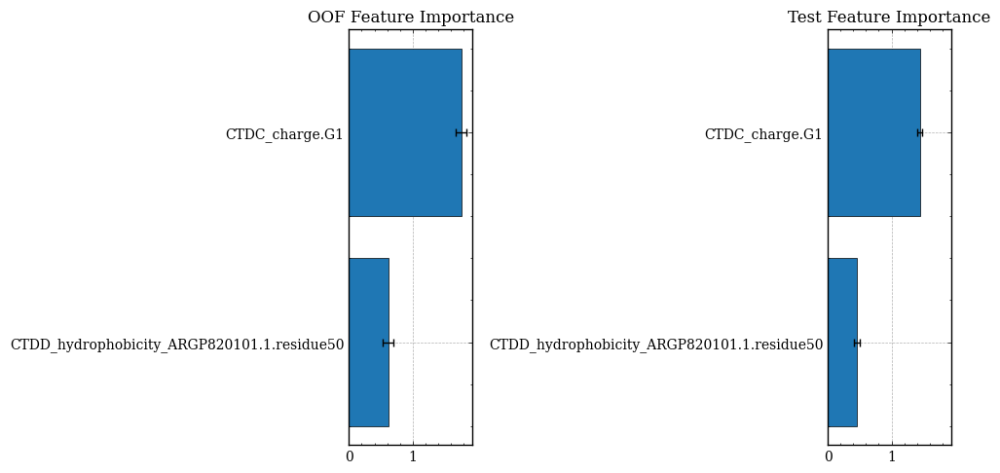

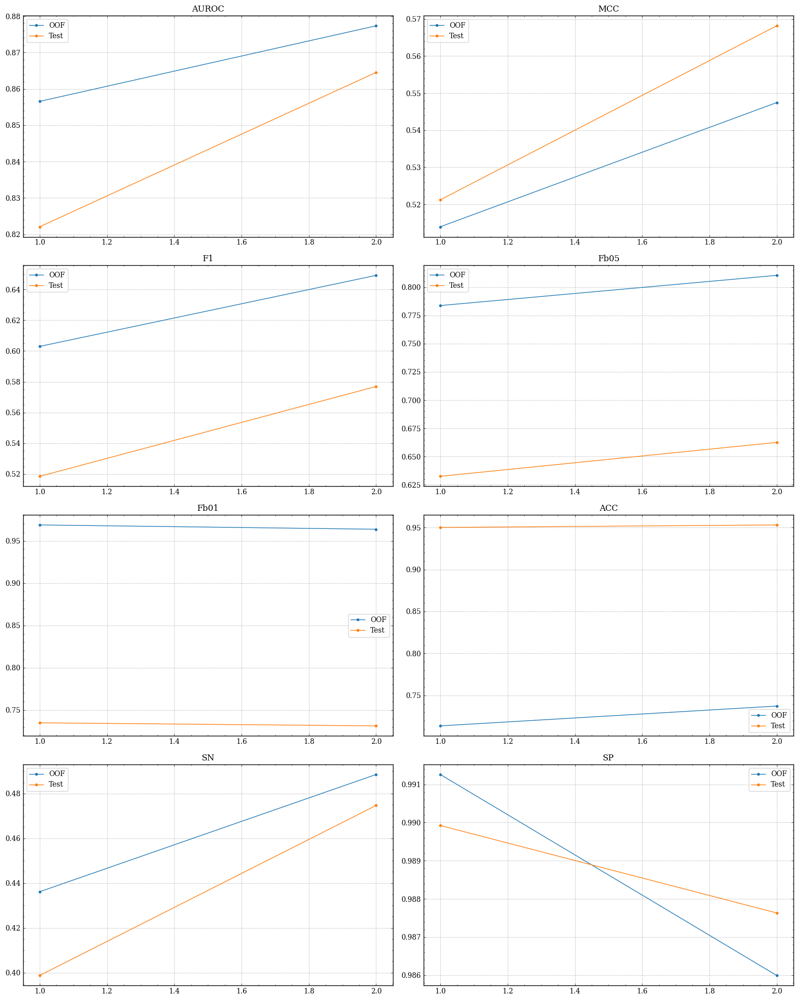

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.2s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.7s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.2s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.4s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.1s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    9.6s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   10.5s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.3s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.4s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   14.7s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   16.2s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.0s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   20.9s remaining:    4.1s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
SOCNumber_gGrantham.lag1,0.581478,0.581478
CKSAAP_IR.gap2,0.570631,0.570631
ASDC_IR,0.566700,0.566700
CTDD_normwaalsvolume.2.residue100,0.565542,0.565542
DDE_LS,0.564058,0.564058
DDE_TC,0.564045,0.564045
ASDC_LW,0.563933,0.563933
CKSAAP_LL.gap4,0.562630,0.562630
DDE_SH,0.562547,0.562547
DDE_GI,0.562335,0.562335


(375, 2)


,relevance,redundancy
AAC_A,0.555613,0.024413
AAC_H,0.557135,0.023488
AAC_T,0.540748,0.060931
AAindex_p.1.ARGP820101,0.543312,0.070906
AAindex_p.1.BEGF750103,0.541976,0.038836
AAindex_p.2.ARGP820101,0.544645,0.096822
AAindex_p.6.BHAR880101,0.548961,0.089743
ACC_ANDN920101.lag1,0.544618,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.543008,0.011372
ACC_ANDN920101_ARGP820102_lag.3,0.546139,0.008323


(375, 2)


,relevance,redundancy,score
SOCNumber_gGrantham.lag1,0.581478,0.133669,0.581478
CKSAAP_IR.gap2,0.570631,0.002297,0.570631
ASDC_IR,0.566700,0.028543,0.566700
DDE_LS,0.564058,0.015799,0.564058
DDE_TC,0.564045,0.013866,0.564045
ASDC_LW,0.563933,0.063893,0.563933
CKSAAP_LL.gap4,0.562630,0.007682,0.562630
DDE_SH,0.562547,0.026163,0.562547
DDE_GI,0.562335,0.013955,0.562335
DDE_WS,0.561273,0.013119,0.561273


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    1.0s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.4s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.8s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.1s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.9s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.3s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1
AAC_A,0.024413,0.024413,0.019490,0.006956
AAC_H,0.018387,0.023488,0.023488,0.013047
AAC_T,0.060931,0.060931,0.030053,0.004952
AAindex_p.1.ARGP820101,0.070906,0.070906,0.049374,0.006201
AAindex_p.1.BEGF750103,0.038836,0.038836,0.013649,0.000000
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892,0.025600
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719,0.009535
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822,0.036926
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.011372,0.001092,0.005542
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.009530,0.000000,0.009530


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.878413 + 0.00383814	cv_agg's valid auc: 0.864635 + 0.0333423
Early stopping, best iteration is:
[93]	cv_agg's train auc: 0.876557 + 0.00424362	cv_agg's valid auc: 0.865914 + 0.0333544


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.865914,0.581478,0.685187,0.834526,0.969472,0.758291,0.528615,0.987750
Test_ensemble,0.860771,0.558411,0.576642,0.635048,0.678602,0.950449,0.500000,0.983051
Test_refit,0.858024,0.566257,0.583942,0.643087,0.687192,0.951303,0.506329,0.983509


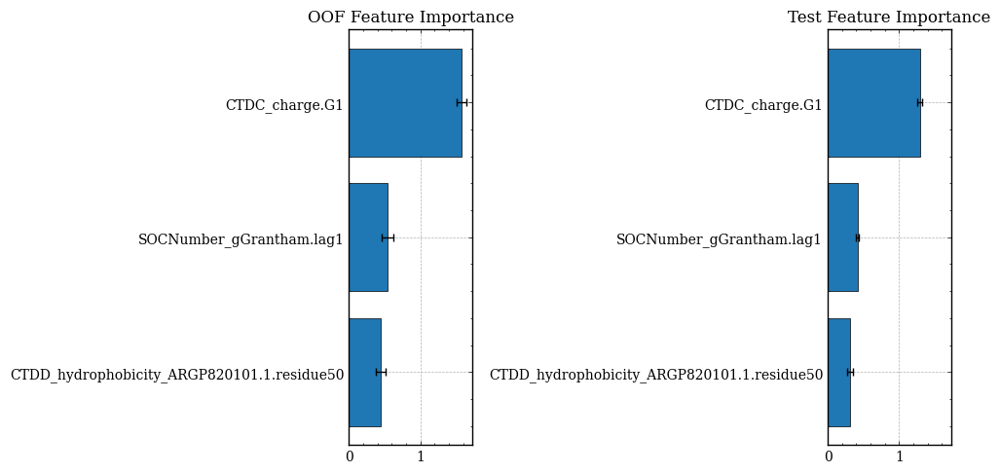

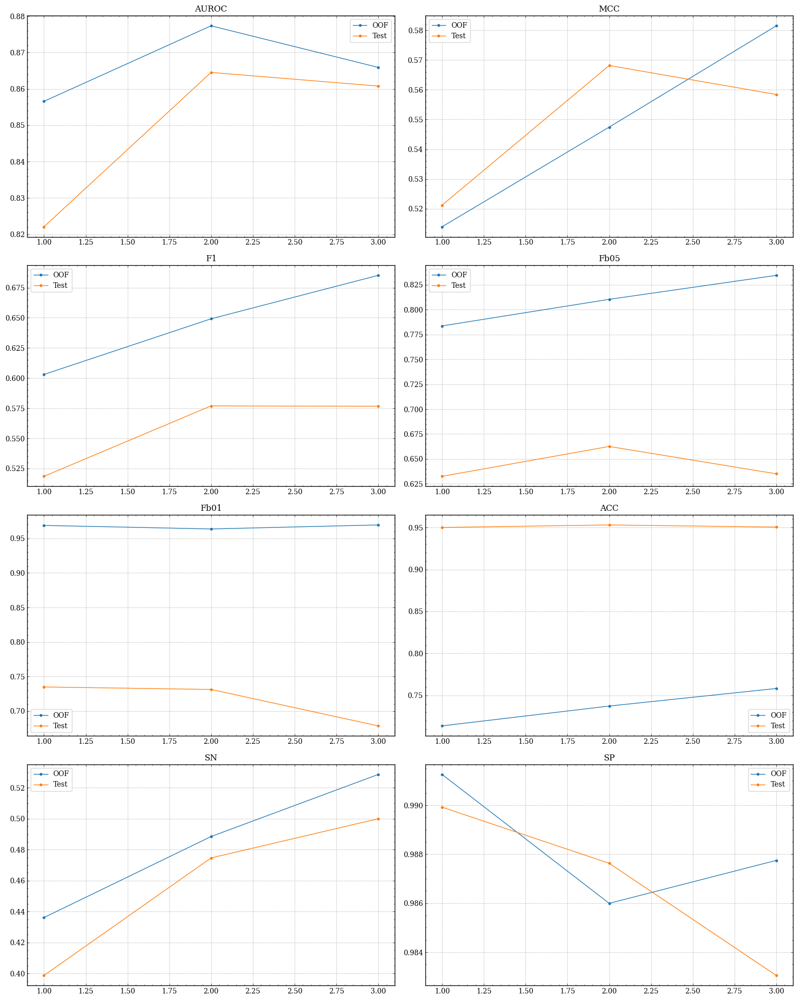

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.6s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    3.9s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.4s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.3s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.1s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    7.7s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    9.5s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   10.5s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.0s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.3s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   14.2s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   16.1s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   17.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   20.6s remaining:    4.0s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
DDE_LA,0.604816,0.604816
CKSAAP_RR.gap3,0.598066,0.598066
CTDD_hydrophobicity_ZIMJ680101.2.residue0,0.597290,0.597290
DDE_PE,0.595311,0.595311
DDE_DL,0.595228,0.595228
DDE_YY,0.593918,0.593918
DDE_CA,0.593873,0.593873
DDE_SP,0.593860,0.593860
DDE_LN,0.593844,0.593844
ASDC_LW,0.593827,0.593827


(375, 2)


,relevance,redundancy
AAC_A,0.571817,0.024413
AAC_H,0.584610,0.023488
AAC_T,0.575987,0.060931
AAindex_p.1.ARGP820101,0.553998,0.070906
AAindex_p.1.BEGF750103,0.567688,0.038836
AAindex_p.2.ARGP820101,0.569058,0.096822
AAindex_p.6.BHAR880101,0.554034,0.089743
ACC_ANDN920101.lag1,0.580146,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.578758,0.011372
ACC_ANDN920101_ARGP820102_lag.3,0.576442,0.009530


(375, 2)


,relevance,redundancy,score
DDE_LA,0.604816,0.022683,0.604816
CTDD_hydrophobicity_ZIMJ680101.2.residue0,0.597290,0.042380,0.597290
DDE_PE,0.595311,0.015437,0.595311
DDE_DL,0.595228,0.019521,0.595228
DDE_YY,0.593918,0.012876,0.593918
DDE_CA,0.593873,0.014298,0.593873
DDE_SP,0.593860,0.023502,0.593860
DDE_LN,0.593844,0.014348,0.593844
ASDC_LW,0.593827,0.063893,0.593827
DDE_RK,0.593816,0.187392,0.593816


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.4s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.8s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.1s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.8s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.3s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA
AAC_A,0.024413,0.127775,0.019490,0.006956,0.127775
AAC_H,0.018387,0.023488,0.023488,0.013047,0.000722
AAC_T,0.060931,0.060931,0.030053,0.004952,0.005018
AAindex_p.1.ARGP820101,0.070906,0.070906,0.049374,0.006201,0.005995
AAindex_p.1.BEGF750103,0.038836,0.038836,0.013649,0.000000,0.000695
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892,0.025600,0.010807
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719,0.009535,0.005916
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822,0.036926,0.004001
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.011372,0.001092,0.005542,0.000000
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.009530,0.000000,0.009530,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.898946 + 0.00402713	cv_agg's valid auc: 0.886963 + 0.0324826
[200]	cv_agg's train auc: 0.911939 + 0.00434037	cv_agg's valid auc: 0.895575 + 0.0310141
[300]	cv_agg's train auc: 0.91735 + 0.00369554	cv_agg's valid auc: 0.898854 + 0.0313802
[400]	cv_agg's train auc: 0.92001 + 0.00350194	cv_agg's valid auc: 0.901143 + 0.0313935
Early stopping, best iteration is:
[403]	cv_agg's train auc: 0.920066 + 0.00346934	cv_agg's valid auc: 0.901234 + 0.0314008
[100]	training's auc: 0.897863	valid_1's auc: 0.863436
[200]	training's auc: 0.911101	valid_1's auc: 0.868358
[300]	training's auc: 0.917339	valid_1's auc: 0.865616
[400]	training's auc: 0.919541	valid_1's auc: 0.866193


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.901234,0.604816,0.707593,0.849470,0.974593,0.772250,0.554719,0.989504
Test_ensemble,0.869359,0.546923,0.572414,0.604956,0.627564,0.947031,0.525316,0.977554
Test_refit,0.866204,0.539701,0.566553,0.594556,0.613779,0.945750,0.525316,0.976180


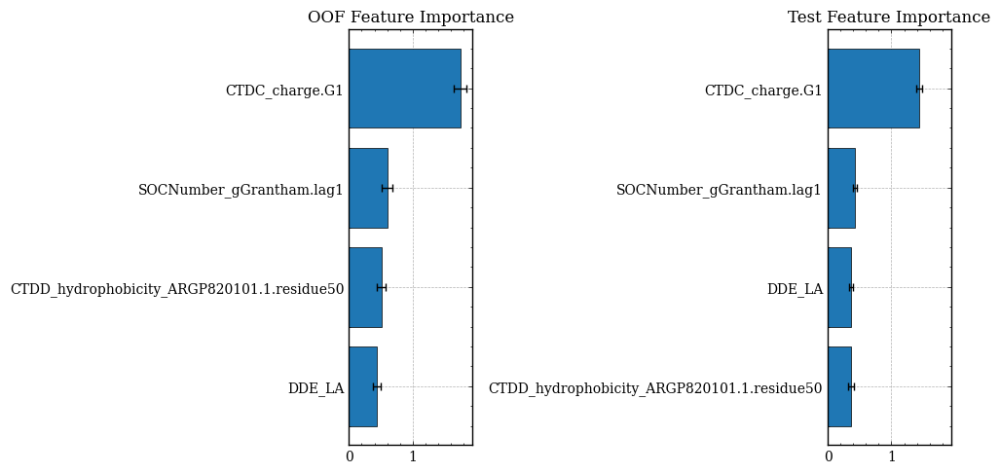

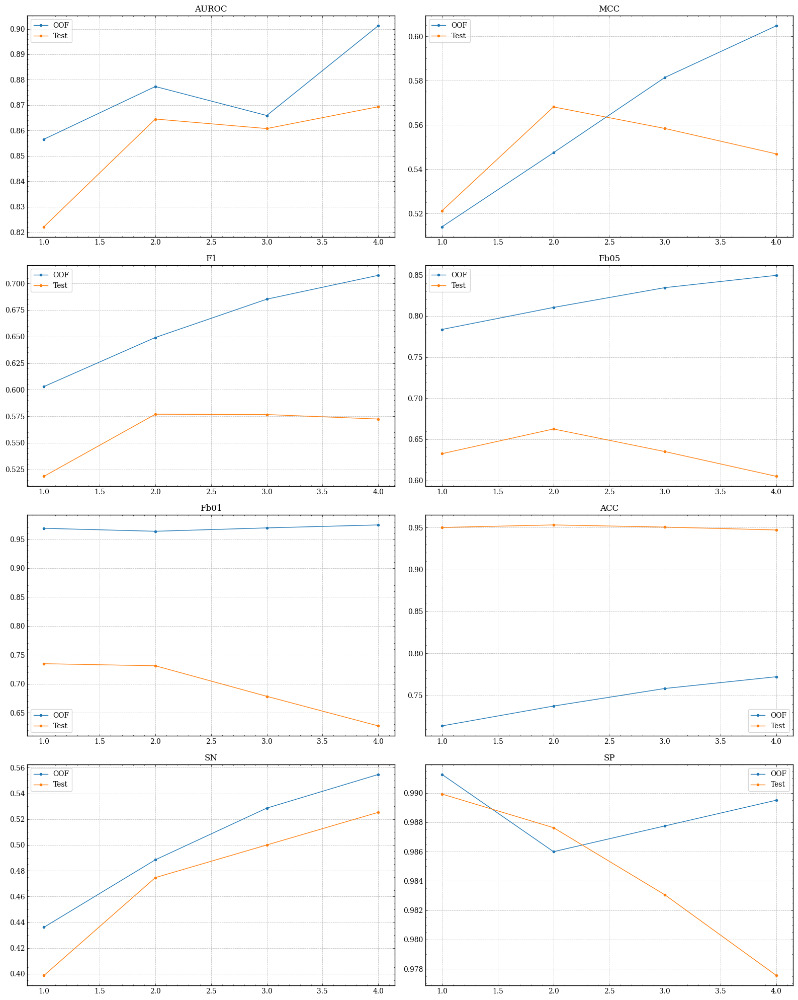

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.6s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.0s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.6s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.4s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.2s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.3s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    9.6s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   10.8s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.1s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.6s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   14.8s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   16.5s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   17.7s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   20.9s remaining:    4.1s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
Geary_ANDN920101.lag2,0.612046,0.612046
ASDC_LW,0.611650,0.611650
CKSAAP_SR.gap4,0.610483,0.610483
NMBroto_ARGP820101.lag5,0.609481,0.609481
ASDC_HF,0.609014,0.609014
NPA,0.607816,0.607816
CKSAAP_LL.gap4,0.607632,0.607632
ZScale_p4.z5,0.607538,0.607538
CKSAAP_AA.gap1,0.606237,0.606237
ASDC_LT,0.606234,0.606234


(375, 2)


,relevance,redundancy
AAC_A,0.595483,0.127775
AAC_H,0.570570,0.023488
AAC_T,0.560877,0.060931
AAindex_p.1.ARGP820101,0.594106,0.070906
AAindex_p.1.BEGF750103,0.569100,0.038836
AAindex_p.2.ARGP820101,0.559504,0.096822
AAindex_p.6.BHAR880101,0.566396,0.089743
ACC_ANDN920101.lag1,0.598110,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.574559,0.011372
ACC_ANDN920101_ARGP820102_lag.3,0.566347,0.009530


(375, 2)


,relevance,redundancy,score
Geary_ANDN920101.lag2,0.612046,0.017502,0.612046
ASDC_LW,0.611650,0.063893,0.611650
CKSAAP_SR.gap4,0.610483,0.023251,0.610483
NMBroto_ARGP820101.lag5,0.609481,0.002067,0.609481
ASDC_HF,0.609014,0.003480,0.609014
CKSAAP_LL.gap4,0.607632,0.027838,0.607632
ZScale_p4.z5,0.607538,0.083986,0.607538
CKSAAP_AA.gap1,0.606237,0.071720,0.606237
ASDC_LT,0.606234,0.028673,0.606234
ASDC_MH,0.606069,0.003307,0.606069


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.0s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.5s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.8s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.1s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.3s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.5s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    2.9s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2
AAC_A,0.024413,0.127775,0.019490,0.006956,0.127775,0.000000
AAC_H,0.018387,0.023488,0.023488,0.013047,0.000722,0.000964
AAC_T,0.060931,0.060931,0.030053,0.004952,0.005018,0.000658
AAindex_p.1.ARGP820101,0.070906,0.070906,0.049374,0.006201,0.005995,0.003823
AAindex_p.1.BEGF750103,0.038836,0.038836,0.013649,0.000000,0.000695,0.001424
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892,0.025600,0.010807,0.001092
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719,0.009535,0.005916,0.006084
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822,0.036926,0.004001,0.029706
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.046444,0.001092,0.005542,0.000000,0.046444
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.009530,0.000000,0.009530,0.000000,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.90398 + 0.00386858	cv_agg's valid auc: 0.888144 + 0.0325048
[200]	cv_agg's train auc: 0.913967 + 0.00418378	cv_agg's valid auc: 0.897559 + 0.0302699
[300]	cv_agg's train auc: 0.920335 + 0.00398953	cv_agg's valid auc: 0.902436 + 0.0302978
[400]	cv_agg's train auc: 0.923681 + 0.00377915	cv_agg's valid auc: 0.904663 + 0.0290629
[100]	training's auc: 0.901867	valid_1's auc: 0.871659
[200]	training's auc: 0.912872	valid_1's auc: 0.873093
[300]	training's auc: 0.919218	valid_1's auc: 0.872001
[400]	training's auc: 0.922812	valid_1's auc: 0.871369


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.905288,0.612046,0.716971,0.853896,0.972721,0.777460,0.566878,0.987780
Test_ensemble,0.872484,0.547675,0.576159,0.592643,0.603586,0.945323,0.550633,0.973889
Test_refit,0.871132,0.554542,0.581940,0.602493,0.616286,0.946604,0.550633,0.975263


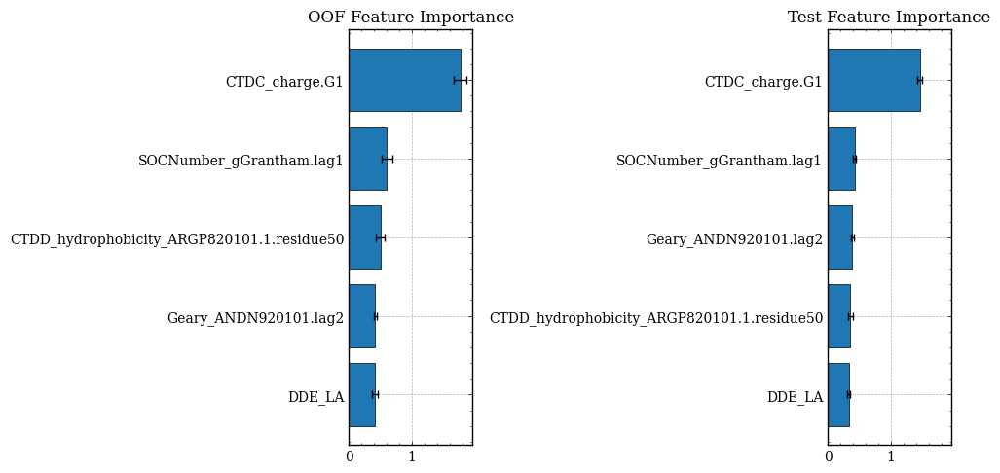

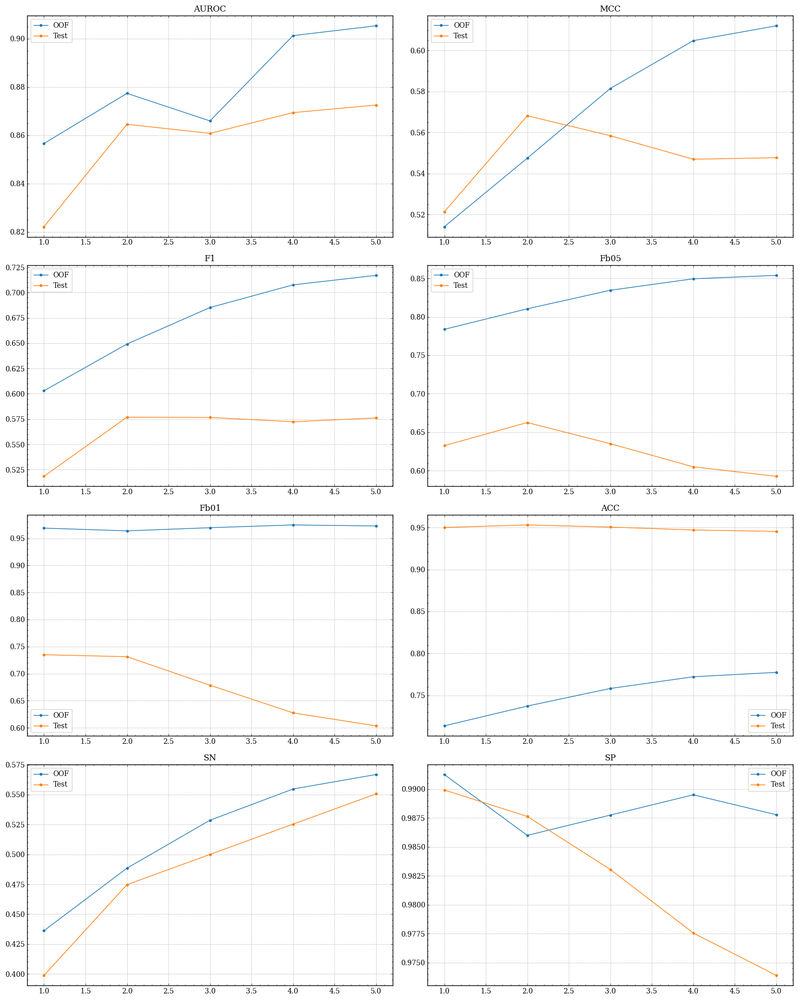

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.4s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.8s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.7s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.7s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.6s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.2s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.8s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.6s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.9s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.7s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   17.2s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.8s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   21.6s remaining:    4.2s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
DDE_SP,0.623979,0.623979
ASDC_LW,0.622544,0.622544
CTDD_hydrophobicity_ZIMJ680101.3.residue50,0.621549,0.621549
CKSAAGP_postivecharger.uncharger.gap5,0.621349,0.621349
DDE_LW,0.621146,0.621146
ACC_BEGF750102_BEGF750101_lag.1,0.620452,0.620452
ZScale_p4.z5,0.620280,0.620280
CKSAAGP_uncharger.aromatic.gap9,0.620213,0.620213
PAAC_Xc1.V,0.619324,0.619324
CKSAAGP_postivecharger.uncharger.gap8,0.619111,0.619111


(375, 2)


,relevance,redundancy
AAC_A,0.611136,0.127775
AAC_H,0.616395,0.023488
AAC_T,0.610065,0.060931
AAindex_p.1.ARGP820101,0.567858,0.070906
AAindex_p.1.BEGF750103,0.610029,0.038836
AAindex_p.2.ARGP820101,0.572988,0.096822
AAindex_p.6.BHAR880101,0.613913,0.089743
ACC_ANDN920101.lag1,0.612059,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.574209,0.046444
ACC_ANDN920101_ARGP820102_lag.3,0.610130,0.009530


(375, 2)


,relevance,redundancy,score
DDE_SP,0.623979,0.023502,0.623979
ASDC_LW,0.622544,0.063893,0.622544
CTDD_hydrophobicity_ZIMJ680101.3.residue50,0.621549,0.097174,0.621549
CKSAAGP_postivecharger.uncharger.gap5,0.621349,0.075037,0.621349
DDE_LW,0.621146,0.122011,0.621146
ACC_BEGF750102_BEGF750101_lag.1,0.620452,0.058726,0.620452
ZScale_p4.z5,0.620280,0.083986,0.620280
CKSAAGP_uncharger.aromatic.gap9,0.620213,0.008411,0.620213
PAAC_Xc1.V,0.619324,0.141157,0.619324
CKSAAGP_postivecharger.uncharger.gap8,0.619111,0.052493,0.619111


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.4s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.7s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.0s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.8s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.2s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP
AAC_A,0.024413,0.127775,0.019490,0.006956,0.127775,0.000000,0.004676
AAC_H,0.018387,0.023488,0.023488,0.013047,0.000722,0.000964,0.000545
AAC_T,0.060931,0.060931,0.030053,0.004952,0.005018,0.000658,0.011297
AAindex_p.1.ARGP820101,0.070906,0.070906,0.049374,0.006201,0.005995,0.003823,0.005226
AAindex_p.1.BEGF750103,0.038836,0.038836,0.013649,0.000000,0.000695,0.001424,0.003642
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892,0.025600,0.010807,0.001092,0.009628
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719,0.009535,0.005916,0.006084,0.006207
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822,0.036926,0.004001,0.029706,0.002232
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.046444,0.001092,0.005542,0.000000,0.046444,0.000000
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.009530,0.000000,0.009530,0.000000,0.000000,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.906498 + 0.00394695	cv_agg's valid auc: 0.891092 + 0.0322757
[200]	cv_agg's train auc: 0.914958 + 0.00393486	cv_agg's valid auc: 0.899376 + 0.031378
[300]	cv_agg's train auc: 0.921285 + 0.00366641	cv_agg's valid auc: 0.903326 + 0.0301555
Early stopping, best iteration is:
[366]	cv_agg's train auc: 0.92381 + 0.00350882	cv_agg's valid auc: 0.905391 + 0.0300831
[100]	training's auc: 0.90577	valid_1's auc: 0.870424
[200]	training's auc: 0.914187	valid_1's auc: 0.872013
[300]	training's auc: 0.920376	valid_1's auc: 0.872404


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.905391,0.623979,0.728295,0.861944,0.975932,0.784455,0.579250,0.989534
Test_ensemble,0.873550,0.557051,0.584718,0.602740,0.614746,0.946604,0.556962,0.974805
Test_refit,0.872573,0.554762,0.582781,0.599455,0.610523,0.946177,0.556962,0.974347


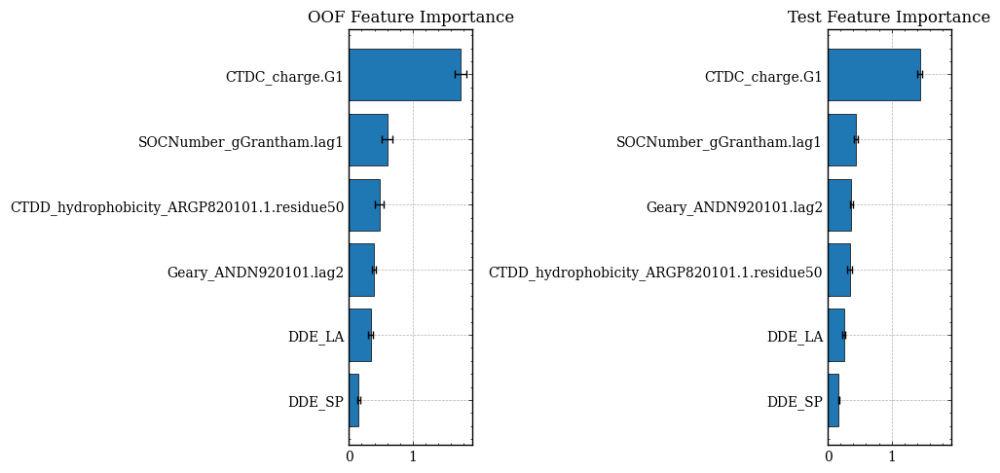

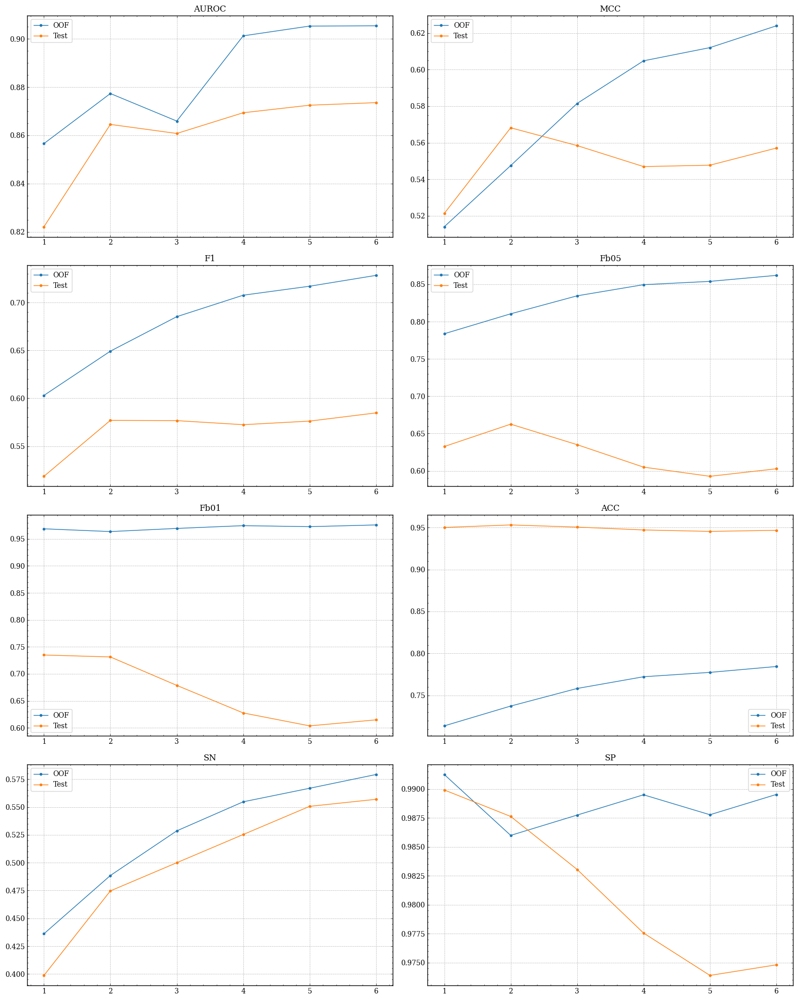

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.8s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.3s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.8s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.9s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.6s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.5s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.3s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.5s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.9s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.8s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.8s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   17.2s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.9s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   21.6s remaining:    4.2s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
NetC,0.638272,0.638272
ASDC_YR,0.632575,0.632575
CTDT_hydrophobicity_PONP930101.Tr2332,0.632260,0.632260
QSOrder_Schneider.Xr.L,0.632194,0.632194
ASDC_QE,0.632011,0.632011
AAindex_p.6.BHAR880101,0.631315,0.631315
ASDC_FH,0.631308,0.631308
CKSAAP_VK.gap1,0.631305,0.631305
CKSAAP_AL.gap3,0.630800,0.630800
QSOrder_Schneider.Xr.H,0.630781,0.630781


(375, 2)


,relevance,redundancy
AAC_A,0.612014,0.127775
AAC_H,0.622517,0.023488
AAC_T,0.628452,0.060931
AAindex_p.1.ARGP820101,0.622591,0.070906
AAindex_p.1.BEGF750103,0.614827,0.038836
AAindex_p.2.ARGP820101,0.584022,0.096822
AAindex_p.6.BHAR880101,0.631315,0.089743
ACC_ANDN920101.lag1,0.618670,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.612929,0.046444
ACC_ANDN920101_ARGP820102_lag.3,0.617492,0.009530


(375, 2)


,relevance,redundancy,score
ASDC_YR,0.632575,0.059665,0.632575
CTDT_hydrophobicity_PONP930101.Tr2332,0.632260,0.055774,0.632260
QSOrder_Schneider.Xr.L,0.632194,0.160316,0.632194
ASDC_QE,0.632011,0.013149,0.632011
AAindex_p.6.BHAR880101,0.631315,0.089743,0.631315
ASDC_FH,0.631308,0.004458,0.631308
CKSAAP_VK.gap1,0.631305,0.002523,0.631305
CKSAAP_AL.gap3,0.630800,0.090036,0.630800
QSOrder_Schneider.Xr.H,0.630781,0.021318,0.630781
ACC_ANDN920101_BEGF750102_lag.3,0.629921,0.015397,0.629921


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.0s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.7s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    2.0s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.1s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.5s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.9s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.3s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP,ASDC_YR
AAC_A,0.024413,0.127775,0.019490,0.006956,0.127775,0.000000,0.004676,0.000190
AAC_H,0.018387,0.023488,0.023488,0.013047,0.000722,0.000964,0.000545,0.000000
AAC_T,0.060931,0.060931,0.030053,0.004952,0.005018,0.000658,0.011297,0.009011
AAindex_p.1.ARGP820101,0.070906,0.070906,0.049374,0.006201,0.005995,0.003823,0.005226,0.042285
AAindex_p.1.BEGF750103,0.038836,0.038836,0.013649,0.000000,0.000695,0.001424,0.003642,0.011605
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892,0.025600,0.010807,0.001092,0.009628,0.012159
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719,0.009535,0.005916,0.006084,0.006207,0.015726
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822,0.036926,0.004001,0.029706,0.002232,0.000000
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.046444,0.001092,0.005542,0.000000,0.046444,0.000000,0.000000
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.009530,0.000000,0.009530,0.000000,0.000000,0.000000,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP', 'ASDC_YR']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.906665 + 0.00388086	cv_agg's valid auc: 0.892926 + 0.031817
[200]	cv_agg's train auc: 0.914508 + 0.0036629	cv_agg's valid auc: 0.899214 + 0.0306578
[300]	cv_agg's train auc: 0.921666 + 0.00357972	cv_agg's valid auc: 0.903273 + 0.0293151
[400]	cv_agg's train auc: 0.925579 + 0.00328754	cv_agg's valid auc: 0.90556 + 0.0287191
[100]	training's auc: 0.904483	valid_1's auc: 0.880346
[200]	training's auc: 0.914056	valid_1's auc: 0.880392
[300]	training's auc: 0.921225	valid_1's auc: 0.880485
[400]	training's auc: 0.924943	valid_1's auc: 0.879402


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.906080,0.632575,0.738615,0.866562,0.973903,0.790580,0.593224,0.987780
Test_ensemble,0.878584,0.573999,0.601942,0.610236,0.615611,0.947458,0.588608,0.973431
Test_refit,0.879251,0.576247,0.603896,0.613456,0.619673,0.947886,0.588608,0.973889


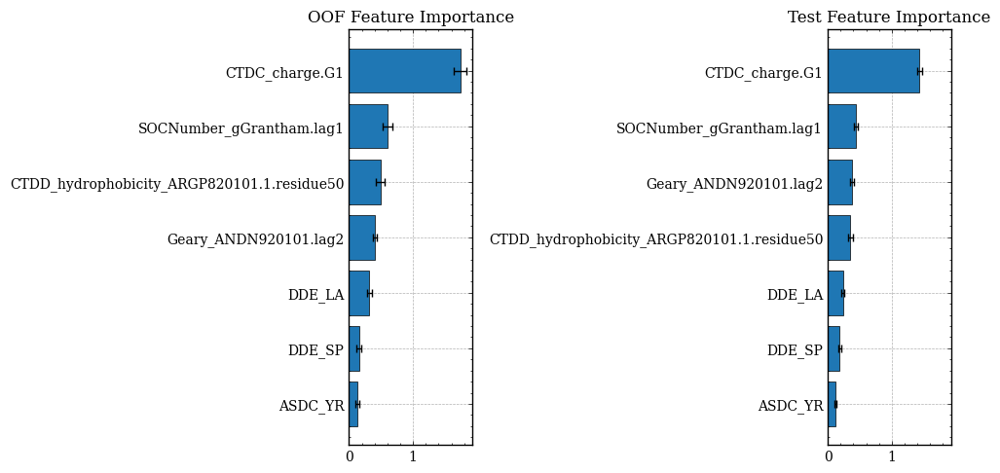

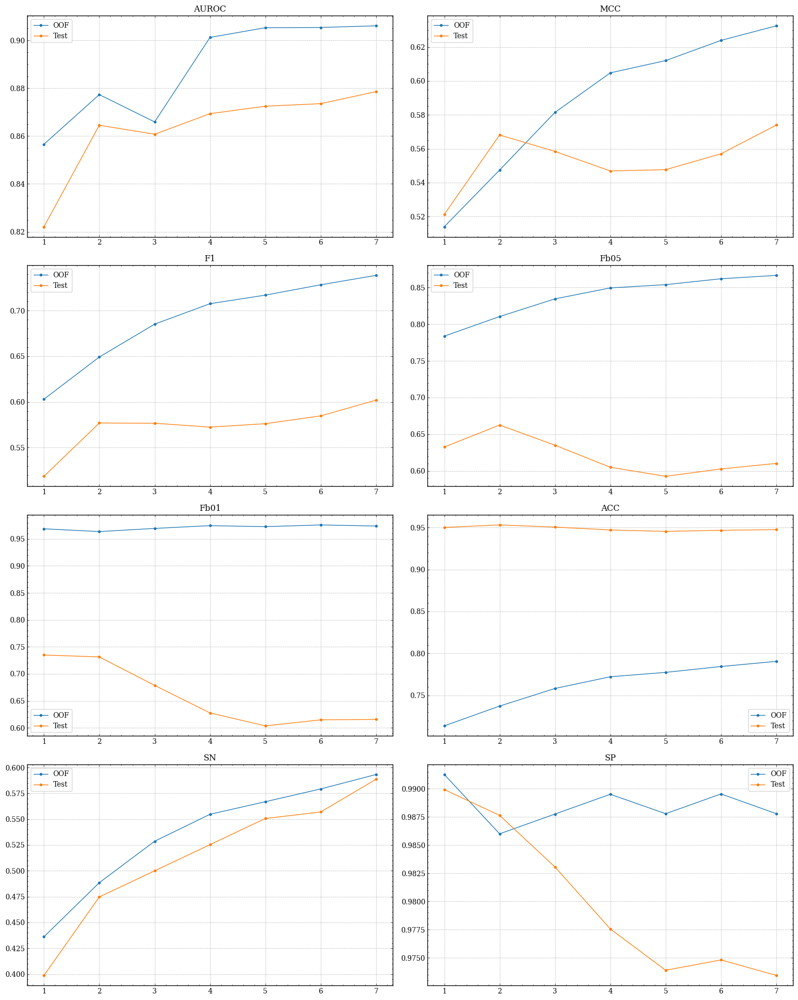

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.8s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.2s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.5s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.7s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.5s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.1s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.0s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.0s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.7s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.8s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.4s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   16.8s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.2s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   21.4s remaining:    4.2s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
ASDC_QE,0.644427,0.644427
ASDC_MM,0.641470,0.641470
APAAC_Pc1.V,0.640961,0.640961
CKSAAP_ER.gap2,0.640910,0.640910
CTDD_secondarystruct.2.residue50,0.640837,0.640837
NMBroto_ARGP820101.lag5,0.640142,0.640142
ZScale_p4.z5,0.639634,0.639634
CKSAAGP_postivecharger.uncharger.gap5,0.639524,0.639524
QSOrder_Schneider.Xr.H,0.639513,0.639513
NPA,0.638558,0.638558


(375, 2)


,relevance,redundancy
AAC_A,0.629015,0.127775
AAC_H,0.618693,0.023488
AAC_T,0.589770,0.060931
AAindex_p.1.ARGP820101,0.615691,0.070906
AAindex_p.1.BEGF750103,0.595102,0.038836
AAindex_p.2.ARGP820101,0.624232,0.096822
AAindex_p.6.BHAR880101,0.623682,0.089743
ACC_ANDN920101.lag1,0.625272,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.630819,0.046444
ACC_ANDN920101_ARGP820102_lag.3,0.628453,0.009530


(375, 2)


,relevance,redundancy,score
ASDC_QE,0.644427,0.013149,0.644427
ASDC_MM,0.641470,0.002548,0.641470
APAAC_Pc1.V,0.640961,0.131348,0.640961
CKSAAP_ER.gap2,0.640910,0.001460,0.640910
CTDD_secondarystruct.2.residue50,0.640837,0.083434,0.640837
NMBroto_ARGP820101.lag5,0.640142,0.002067,0.640142
ZScale_p4.z5,0.639634,0.083986,0.639634
CKSAAGP_postivecharger.uncharger.gap5,0.639524,0.075037,0.639524
QSOrder_Schneider.Xr.H,0.639513,0.021318,0.639513
CTDD_hydrophobicity_PONP930101.2.residue25,0.638527,0.027689,0.638527


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.6s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.0s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.5s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.7s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.2s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.3s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.5s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    2.9s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP,ASDC_YR,ASDC_QE
AAC_A,0.024413,0.127775,0.019490,0.006956,0.127775,0.000000,0.004676,0.000190,0.000136
AAC_H,0.018387,0.023488,0.023488,0.013047,0.000722,0.000964,0.000545,0.000000,0.001573
AAC_T,0.060931,0.060931,0.030053,0.004952,0.005018,0.000658,0.011297,0.009011,0.000000
AAindex_p.1.ARGP820101,0.070906,0.070906,0.049374,0.006201,0.005995,0.003823,0.005226,0.042285,0.014632
AAindex_p.1.BEGF750103,0.038836,0.038836,0.013649,0.000000,0.000695,0.001424,0.003642,0.011605,0.005822
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892,0.025600,0.010807,0.001092,0.009628,0.012159,0.008207
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719,0.009535,0.005916,0.006084,0.006207,0.015726,0.009945
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822,0.036926,0.004001,0.029706,0.002232,0.000000,0.000000
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.046444,0.001092,0.005542,0.000000,0.046444,0.000000,0.000000,0.000000
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.009530,0.000000,0.009530,0.000000,0.000000,0.000000,0.000000,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP', 'ASDC_YR', 'ASDC_QE']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.913389 + 0.00292171	cv_agg's valid auc: 0.898569 + 0.0317065
[200]	cv_agg's train auc: 0.920202 + 0.00315593	cv_agg's valid auc: 0.905223 + 0.0302792
[300]	cv_agg's train auc: 0.926501 + 0.00333485	cv_agg's valid auc: 0.908237 + 0.0281214
[400]	cv_agg's train auc: 0.930684 + 0.00309459	cv_agg's valid auc: 0.910545 + 0.0256235
[500]	cv_agg's train auc: 0.933283 + 0.00287012	cv_agg's valid auc: 0.912305 + 0.0248032
[100]	training's auc: 0.911982	valid_1's auc: 0.890421
[200]	training's auc: 0.918996	valid_1's auc: 0.891382
[300]	training's auc: 0.925897	valid_1's auc: 0.890319
[400]	training's auc: 0.929551	valid_1's auc: 0.888439


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.912516,0.644427,0.746623,0.873565,0.979928,0.796705,0.601936,0.991258
Test_ensemble,0.887740,0.592605,0.619808,0.623393,0.625687,0.949167,0.613924,0.973431
Test_refit,0.887460,0.590234,0.617363,0.623377,0.627248,0.949167,0.607595,0.973889


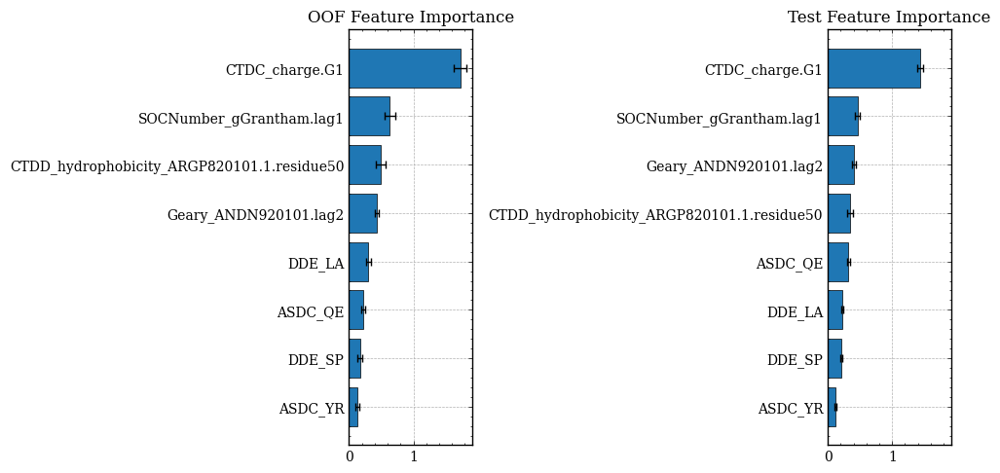

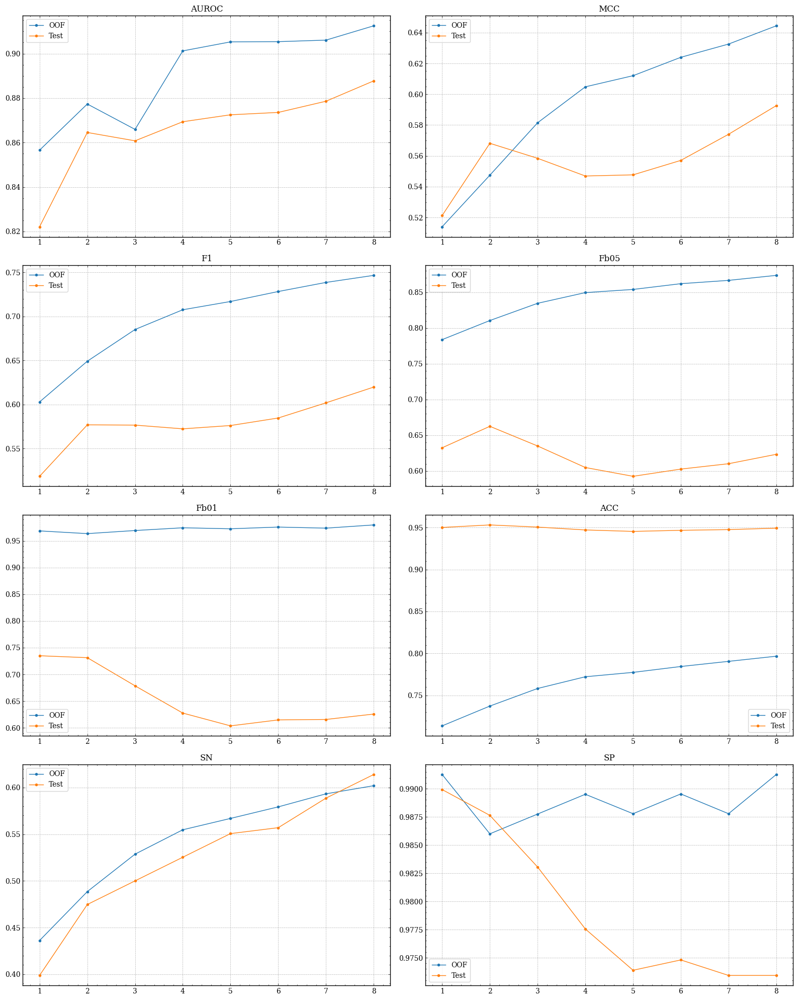

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.9s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.3s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.7s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.7s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.5s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.3s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.1s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.1s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.6s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   13.8s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.5s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   16.7s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   21.2s remaining:    4.1s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
CKSAAGP_uncharger.aromatic.gap7,0.651186,0.651186
blosum62_18,0.650236,0.650236
ASDC_GF,0.650180,0.650180
ASDC_NE,0.648484,0.648484
CKSAAP_GG.gap2,0.648481,0.648481
CTDT_polarity.Tr1221,0.647404,0.647404
ASDC_HF,0.647378,0.647378
ASDC_LA,0.647230,0.647230
ASDC_CG,0.647154,0.647154
PAAC_Xc1.L,0.646918,0.646918


(375, 2)


,relevance,redundancy
AAC_A,0.610555,0.127775
AAC_H,0.634687,0.023488
AAC_T,0.619979,0.060931
AAindex_p.1.ARGP820101,0.625268,0.070906
AAindex_p.1.BEGF750103,0.632313,0.038836
AAindex_p.2.ARGP820101,0.600559,0.096822
AAindex_p.6.BHAR880101,0.631631,0.089743
ACC_ANDN920101.lag1,0.632237,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.637686,0.046444
ACC_ANDN920101_ARGP820102_lag.3,0.575676,0.009530


(375, 2)


,relevance,redundancy,score
CKSAAGP_uncharger.aromatic.gap7,0.651186,0.009051,0.651186
blosum62_18,0.650236,0.048397,0.650236
ASDC_GF,0.650180,0.016786,0.650180
ASDC_NE,0.648484,0.012949,0.648484
CKSAAP_GG.gap2,0.648481,0.000381,0.648481
ASDC_HF,0.647378,0.003480,0.647378
ASDC_CG,0.647154,0.116283,0.647154
ASDC_VG,0.646388,0.025809,0.646388
ASDC_LL,0.646151,0.104511,0.646151
CTriad_g3.g1.g6,0.645789,0.004038,0.645789


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.6s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.0s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.4s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.7s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.1s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.3s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.5s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    2.8s remaining:    0.5s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP,ASDC_YR,ASDC_QE,CKSAAGP_uncharger.aromatic.gap7
AAC_A,0.024413,0.127775,0.019490,0.006956,0.127775,0.000000,0.004676,0.000190,0.000136,0.003972
AAC_H,0.018387,0.023488,0.023488,0.013047,0.000722,0.000964,0.000545,0.000000,0.001573,0.000000
AAC_T,0.060931,0.060931,0.030053,0.004952,0.005018,0.000658,0.011297,0.009011,0.000000,0.002955
AAindex_p.1.ARGP820101,0.070906,0.070906,0.049374,0.006201,0.005995,0.003823,0.005226,0.042285,0.014632,0.002184
AAindex_p.1.BEGF750103,0.038836,0.038836,0.013649,0.000000,0.000695,0.001424,0.003642,0.011605,0.005822,0.000000
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892,0.025600,0.010807,0.001092,0.009628,0.012159,0.008207,0.003285
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719,0.009535,0.005916,0.006084,0.006207,0.015726,0.009945,0.012260
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822,0.036926,0.004001,0.029706,0.002232,0.000000,0.000000,0.000000
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.046444,0.001092,0.005542,0.000000,0.046444,0.000000,0.000000,0.000000,0.000000
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.009530,0.000000,0.009530,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP', 'ASDC_YR', 'ASDC_QE', 'CKSAAGP_uncharger.aromatic.gap7']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.915792 + 0.00303344	cv_agg's valid auc: 0.901165 + 0.0314772
[200]	cv_agg's train auc: 0.92397 + 0.00283878	cv_agg's valid auc: 0.908978 + 0.029011
[300]	cv_agg's train auc: 0.929343 + 0.00289488	cv_agg's valid auc: 0.911185 + 0.0260977
[400]	cv_agg's train auc: 0.933081 + 0.00284691	cv_agg's valid auc: 0.912763 + 0.0253809
[100]	training's auc: 0.91438	valid_1's auc: 0.889907
[200]	training's auc: 0.923674	valid_1's auc: 0.889713
[300]	training's auc: 0.928346	valid_1's auc: 0.886618
[400]	training's auc: 0.932137	valid_1's auc: 0.88497


,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.913801,0.651186,0.753556,0.877429,0.980085,0.801068,0.610678,0.991258
Test_ensemble,0.884976,0.583344,0.610932,0.616883,0.620714,0.948313,0.601266,0.973431
Test_refit,0.884387,0.580931,0.608414,0.616798,0.622231,0.948313,0.594937,0.973889


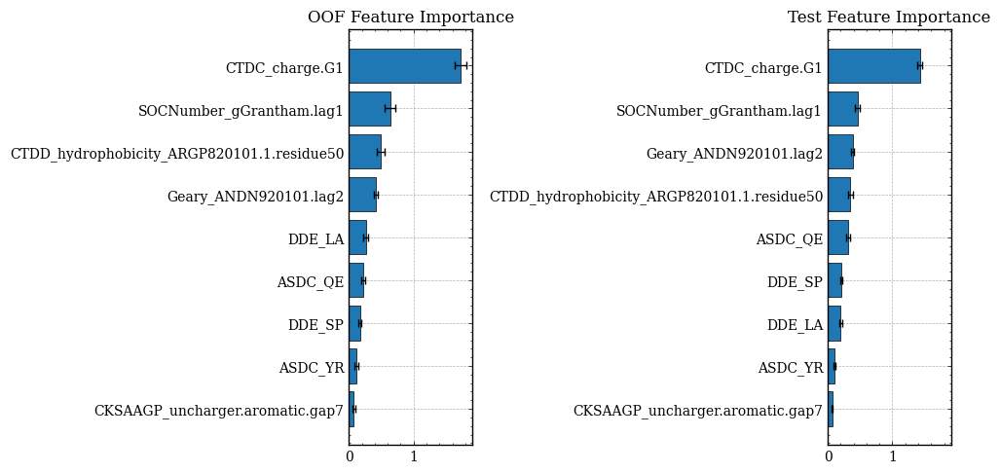

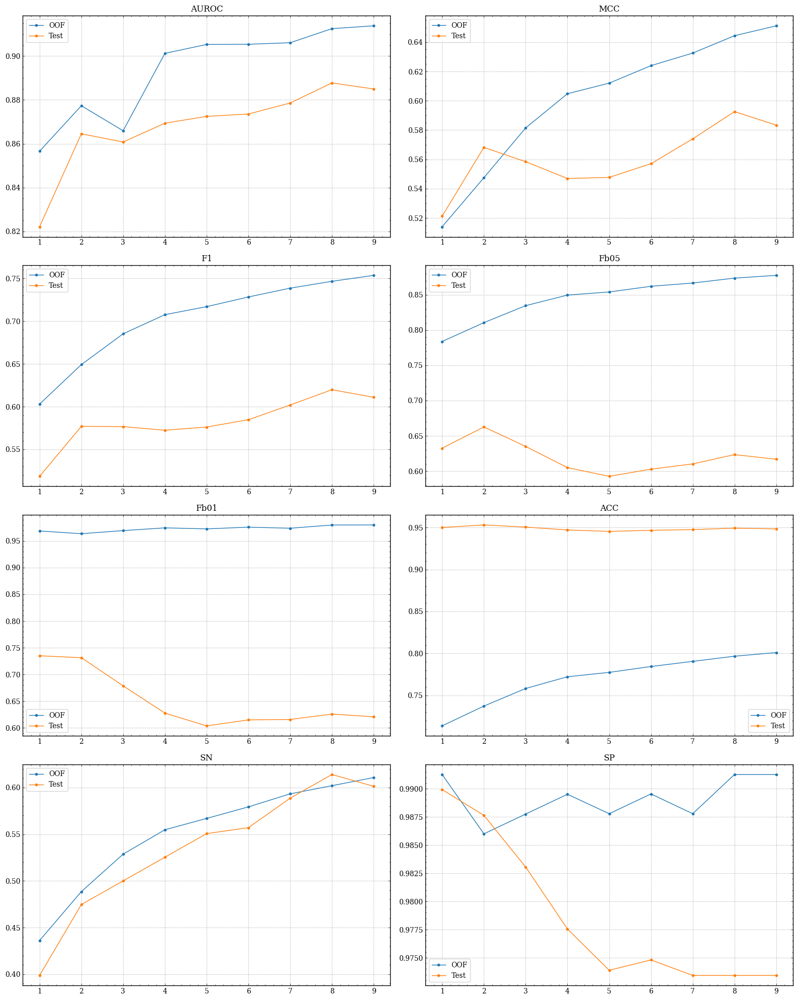

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    4.1s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.3s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.8s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    7.1s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.8s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.2s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.4s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.2s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.8s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   14.4s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.2s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   17.2s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.5s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   21.8s remaining:    4.2s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
blosum62_18,0.651591,0.651591
ASDC_DE,0.651210,0.651210
KSCTriad_g6.g2.g5.gap1,0.651186,0.651186
CKSAAP_KR.gap4,0.649943,0.649943
ASDC_DI,0.649903,0.649903
DDE_LT,0.648490,0.648490
ASDC_VG,0.648143,0.648143
CTDD_secondarystruct.2.residue50,0.647364,0.647364
ASDC_AK,0.646502,0.646502
CTriad_g3.g1.g6,0.646166,0.646166


(375, 2)


,relevance,redundancy
AAC_A,0.610515,0.127775
AAC_H,0.626409,0.023488
AAC_T,0.618381,0.060931
AAindex_p.1.ARGP820101,0.621357,0.070906
AAindex_p.1.BEGF750103,0.618583,0.038836
AAindex_p.2.ARGP820101,0.626586,0.096822
AAindex_p.6.BHAR880101,0.623195,0.089743
ACC_ANDN920101.lag1,0.621148,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.621092,0.046444
ACC_ANDN920101_ARGP820102_lag.3,0.604814,0.009530


(375, 2)


,relevance,redundancy,score
blosum62_18,0.651591,0.048397,0.651591
ASDC_DE,0.651210,0.027085,0.651210
KSCTriad_g6.g2.g5.gap1,0.651186,0.003966,0.651186
CKSAAP_KR.gap4,0.649943,0.145357,0.649943
ASDC_DI,0.649903,0.021360,0.649903
DDE_LT,0.648490,0.015356,0.648490
ASDC_VG,0.648143,0.025809,0.648143
CTDD_secondarystruct.2.residue50,0.647364,0.083434,0.647364
ASDC_AK,0.646502,0.084029,0.646502
CTriad_g3.g1.g6,0.646166,0.004038,0.646166


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.6s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.0s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.5s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.8s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.0s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.2s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.0s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP,ASDC_YR,ASDC_QE,CKSAAGP_uncharger.aromatic.gap7,blosum62_18
AAC_A,0.024413,0.127775,0.019490,0.006956,0.127775,0.000000,0.004676,0.000190,0.000136,0.003972,0.001647
AAC_H,0.018387,0.023488,0.023488,0.013047,0.000722,0.000964,0.000545,0.000000,0.001573,0.000000,0.001875
AAC_T,0.060931,0.060931,0.030053,0.004952,0.005018,0.000658,0.011297,0.009011,0.000000,0.002955,0.003179
AAindex_p.1.ARGP820101,0.070906,0.639107,0.049374,0.006201,0.005995,0.003823,0.005226,0.042285,0.014632,0.002184,0.639107
AAindex_p.1.BEGF750103,0.038836,0.226853,0.013649,0.000000,0.000695,0.001424,0.003642,0.011605,0.005822,0.000000,0.226853
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892,0.025600,0.010807,0.001092,0.009628,0.012159,0.008207,0.003285,0.000000
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719,0.009535,0.005916,0.006084,0.006207,0.015726,0.009945,0.012260,0.000000
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822,0.036926,0.004001,0.029706,0.002232,0.000000,0.000000,0.000000,0.000000
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.046444,0.001092,0.005542,0.000000,0.046444,0.000000,0.000000,0.000000,0.000000,0.000000
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.009530,0.000000,0.009530,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP', 'ASDC_YR', 'ASDC_QE', 'CKSAAGP_uncharger.aromatic.gap7', 'blosum62_18']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.916698 + 0.00341418	cv_agg's valid auc: 0.901154 + 0.0309599
[200]	cv_agg's train auc: 0.926005 + 0.00305399	cv_agg's valid auc: 0.9097 + 0.0300914
[300]	cv_agg's train auc: 0.931527 + 0.00321701	cv_agg's valid auc: 0.913221 + 0.0276629
[400]	cv_agg's train auc: 0.935672 + 0.00330168	cv_agg's valid auc: 0.915489 + 0.0263955
[500]	cv_agg's train auc: 0.938461 + 0.0029847	cv_agg's valid auc: 0.917035 + 0.0251271
Early stopping, best iteration is:
[543]	cv_agg's train auc: 0.93943 + 0.00286383	cv_agg's valid auc: 0.917675 + 0.024798
[100]	training's auc: 0.914896	valid_1's auc: 0.890248
[200]	training's auc: 0.92494	valid_1's auc: 0.890616
[300]	training's auc: 0.930504	valid_1's auc: 0

,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.917675,0.651591,0.755415,0.877217,0.977686,0.801922,0.614126,0.989504
Test_ensemble,0.884394,0.569894,0.598726,0.601023,0.602488,0.946177,0.594937,0.971599
Test_refit,0.883474,0.572061,0.600639,0.604113,0.606335,0.946604,0.594937,0.972057


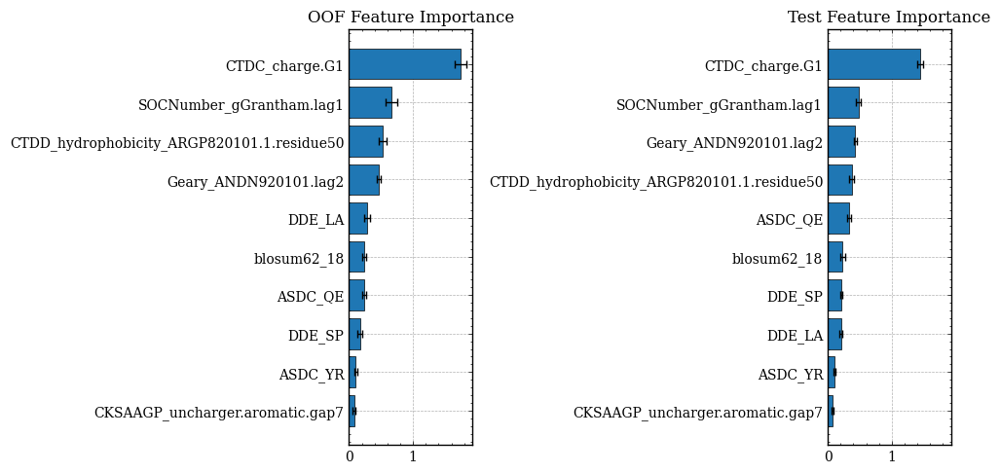

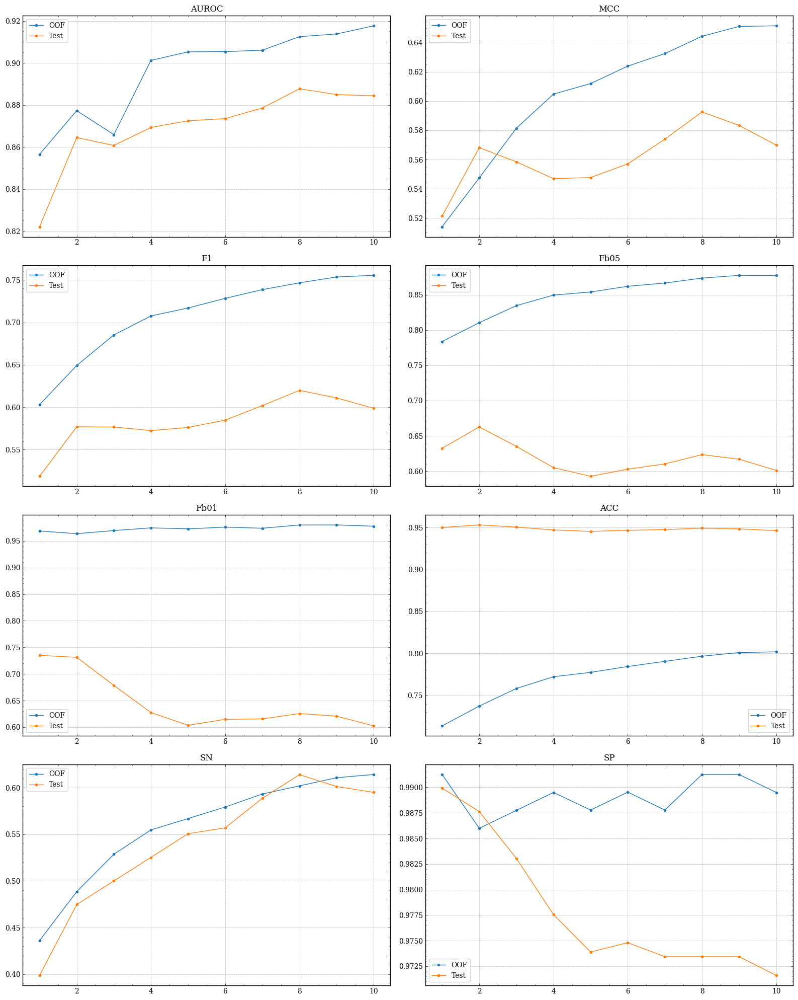

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    4.0s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.3s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.6s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.9s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.7s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.3s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.2s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.2s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.4s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   14.1s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.4s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   17.3s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   21.5s remaining:    4.2s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
QSOrder_Grantham.Xr.H,0.658223,0.658223
Moran_ARGP820101.lag4,0.657515,0.657515
QSOrder_Schneider.Xr.H,0.657151,0.657151
CKSAAGP_uncharger.aromatic.gap0,0.654772,0.654772
ASDC_GE,0.654537,0.654537
CTDD_hydrophobicity_ENGD860101.1.residue50,0.654341,0.654341
ASDC_EM,0.653489,0.653489
ASDC_LL,0.652922,0.652922
AAC_H,0.652669,0.652669
CKSAAP_ER.gap2,0.651621,0.651621


(375, 2)


,relevance,redundancy
AAC_A,0.639517,0.127775
AAC_H,0.652669,0.023488
AAC_T,0.635234,0.060931
AAindex_p.1.ARGP820101,0.636361,0.639107
AAindex_p.1.BEGF750103,0.639394,0.226853
AAindex_p.2.ARGP820101,0.636311,0.096822
AAindex_p.6.BHAR880101,0.637753,0.089743
ACC_ANDN920101.lag1,0.616154,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.622446,0.046444
ACC_ANDN920101_ARGP820102_lag.3,0.632514,0.009530


(375, 2)


,relevance,redundancy,score
QSOrder_Grantham.Xr.H,0.658223,0.027384,0.658223
Moran_ARGP820101.lag4,0.657515,0.006668,0.657515
QSOrder_Schneider.Xr.H,0.657151,0.021318,0.657151
CKSAAGP_uncharger.aromatic.gap0,0.654772,0.058388,0.654772
ASDC_GE,0.654537,0.020752,0.654537
CTDD_hydrophobicity_ENGD860101.1.residue50,0.654341,0.021147,0.654341
ASDC_EM,0.653489,0.004412,0.653489
ASDC_LL,0.652922,0.104511,0.652922
AAC_H,0.652669,0.023488,0.652669
CKSAAP_ER.gap2,0.651621,0.001720,0.651621


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.6s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.0s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.5s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.7s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.2s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.3s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    2.9s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP,ASDC_YR,ASDC_QE,CKSAAGP_uncharger.aromatic.gap7,blosum62_18,QSOrder_Grantham.Xr.H
AAC_A,0.024413,0.127775,0.019490,0.006956,0.127775,0.000000,0.004676,0.000190,0.000136,0.003972,0.001647,0.000000
AAC_H,0.018387,0.457118,0.023488,0.013047,0.000722,0.000964,0.000545,0.000000,0.001573,0.000000,0.001875,0.457118
AAC_T,0.060931,0.060931,0.030053,0.004952,0.005018,0.000658,0.011297,0.009011,0.000000,0.002955,0.003179,0.000000
AAindex_p.1.ARGP820101,0.070906,0.639107,0.049374,0.006201,0.005995,0.003823,0.005226,0.042285,0.014632,0.002184,0.639107,0.000000
AAindex_p.1.BEGF750103,0.038836,0.226853,0.013649,0.000000,0.000695,0.001424,0.003642,0.011605,0.005822,0.000000,0.226853,0.000000
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892,0.025600,0.010807,0.001092,0.009628,0.012159,0.008207,0.003285,0.000000,0.000000
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719,0.009535,0.005916,0.006084,0.006207,0.015726,0.009945,0.012260,0.000000,0.000000
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822,0.036926,0.004001,0.029706,0.002232,0.000000,0.000000,0.000000,0.000000,0.000000
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.046444,0.001092,0.005542,0.000000,0.046444,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.009530,0.000000,0.009530,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP', 'ASDC_YR', 'ASDC_QE', 'CKSAAGP_uncharger.aromatic.gap7', 'blosum62_18', 'QSOrder_Grantham.Xr.H']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.917156 + 0.00310223	cv_agg's valid auc: 0.901697 + 0.0307994
[200]	cv_agg's train auc: 0.928011 + 0.0031994	cv_agg's valid auc: 0.910271 + 0.0298189
[300]	cv_agg's train auc: 0.934107 + 0.00321332	cv_agg's valid auc: 0.914355 + 0.0280058
[400]	cv_agg's train auc: 0.938492 + 0.00314962	cv_agg's valid auc: 0.917279 + 0.0271186
Early stopping, best iteration is:
[452]	cv_agg's train auc: 0.940247 + 0.00327265	cv_agg's valid auc: 0.918071 + 0.0263752
[100]	training's auc: 0.915326	valid_1's auc: 0.889651
[200]	training's auc: 0.92705	valid_1's auc: 0.886933
[300]	training's auc: 0.933529	valid_1's auc: 0.884148
[400]	training's auc: 0.937113	valid_1's auc: 0.8837

,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.918071,0.658223,0.760344,0.881302,0.980717,0.805446,0.619449,0.991258
Test_ensemble,0.884560,0.561849,0.589404,0.606267,0.617461,0.947031,0.563291,0.974805
Test_refit,0.882917,0.557291,0.585526,0.599730,0.609093,0.946177,0.563291,0.973889


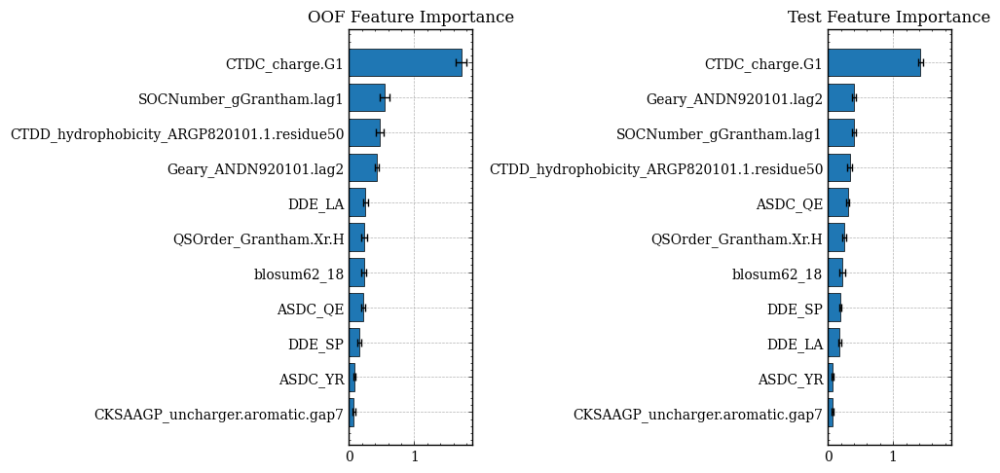

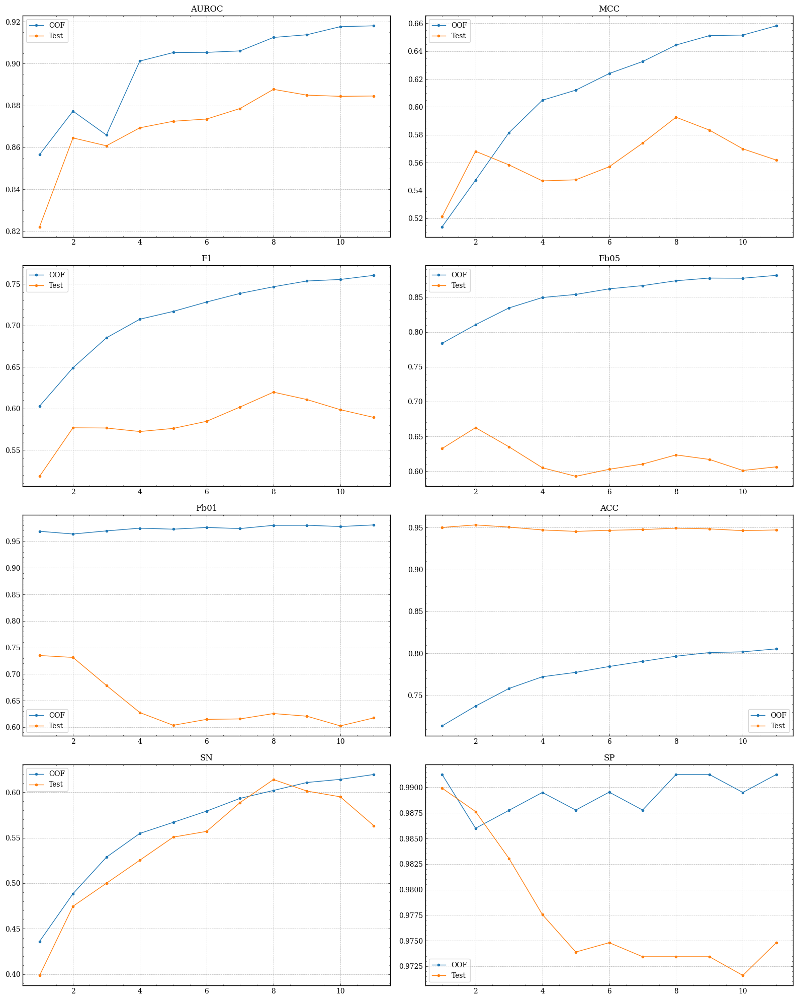

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    4.1s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.5s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.8s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.9s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.9s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.5s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.3s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.4s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.7s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   14.2s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.6s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   17.6s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.6s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   21.7s remaining:    4.2s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
ASDC_LL,0.663765,0.663765
ASDC_GF,0.662320,0.662320
ACC_ARGP820101.lag3,0.660889,0.660889
Geary_ARGP820101.lag3,0.658549,0.658549
CTDC_hydrophobicity_ARGP820101.G1,0.658252,0.658252
ASDC_AP,0.658244,0.658244
CKSAAP_LA.gap1,0.658223,0.658223
KSCTriad_g6.g2.g5.gap1,0.658223,0.658223
CKSAAP_TR.gap4,0.656843,0.656843
CKSAAP_KK.gap0,0.656814,0.656814


(375, 2)


,relevance,redundancy
AAC_A,0.653787,0.127775
AAC_H,0.638884,0.457118
AAC_T,0.652648,0.060931
AAindex_p.1.ARGP820101,0.643213,0.639107
AAindex_p.1.BEGF750103,0.649259,0.226853
AAindex_p.2.ARGP820101,0.654095,0.096822
AAindex_p.6.BHAR880101,0.640507,0.089743
ACC_ANDN920101.lag1,0.623880,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.644632,0.046444
ACC_ANDN920101_ARGP820102_lag.3,0.648838,0.009530


(375, 2)


,relevance,redundancy,score
ASDC_LL,0.663765,0.104511,0.663765
ASDC_GF,0.662320,0.016786,0.662320
ACC_ARGP820101.lag3,0.660889,0.022142,0.660889
Geary_ARGP820101.lag3,0.658549,0.001972,0.658549
ASDC_AP,0.658244,0.015793,0.658244
CKSAAP_LA.gap1,0.658223,0.082861,0.658223
KSCTriad_g6.g2.g5.gap1,0.658223,0.003966,0.658223
CKSAAP_TR.gap4,0.656843,0.004076,0.656843
ACC_ARGP820103_ARGP820102_lag.3,0.656024,0.026039,0.656024
CKSAAP_LL.gap3,0.655981,0.097768,0.655981


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.7s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    2.1s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.3s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.7s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.9s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    3.2s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.6s remaining:    0.7s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP,ASDC_YR,ASDC_QE,CKSAAGP_uncharger.aromatic.gap7,blosum62_18,QSOrder_Grantham.Xr.H,ASDC_LL
AAC_A,0.024413,0.127775,0.019490,0.006956,0.127775,0.000000,0.004676,0.000190,0.000136,0.003972,0.001647,0.000000,0.008443
AAC_H,0.018387,0.457118,0.023488,0.013047,0.000722,0.000964,0.000545,0.000000,0.001573,0.000000,0.001875,0.457118,0.004168
AAC_T,0.060931,0.060931,0.030053,0.004952,0.005018,0.000658,0.011297,0.009011,0.000000,0.002955,0.003179,0.000000,0.002892
AAindex_p.1.ARGP820101,0.070906,0.639107,0.049374,0.006201,0.005995,0.003823,0.005226,0.042285,0.014632,0.002184,0.639107,0.000000,0.015339
AAindex_p.1.BEGF750103,0.038836,0.226853,0.013649,0.000000,0.000695,0.001424,0.003642,0.011605,0.005822,0.000000,0.226853,0.000000,0.004757
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892,0.025600,0.010807,0.001092,0.009628,0.012159,0.008207,0.003285,0.000000,0.000000,0.037656
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719,0.009535,0.005916,0.006084,0.006207,0.015726,0.009945,0.012260,0.000000,0.000000,0.013758
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822,0.036926,0.004001,0.029706,0.002232,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.046444,0.001092,0.005542,0.000000,0.046444,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005314
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.009530,0.000000,0.009530,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002032


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP', 'ASDC_YR', 'ASDC_QE', 'CKSAAGP_uncharger.aromatic.gap7', 'blosum62_18', 'QSOrder_Grantham.Xr.H', 'ASDC_LL']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.918098 + 0.00297803	cv_agg's valid auc: 0.902566 + 0.0314023
[200]	cv_agg's train auc: 0.929425 + 0.00319693	cv_agg's valid auc: 0.911325 + 0.0309304
[300]	cv_agg's train auc: 0.93545 + 0.0033385	cv_agg's valid auc: 0.915367 + 0.0277712
[400]	cv_agg's train auc: 0.940155 + 0.00326969	cv_agg's valid auc: 0.918016 + 0.0257954
Early stopping, best iteration is:
[466]	cv_agg's train auc: 0.942234 + 0.00317405	cv_agg's valid auc: 0.919126 + 0.0257708
[100]	training's auc: 0.917106	valid_1's auc: 0.892124
[200]	training's auc: 0.928459	valid_1's auc: 0.888045
[300]	training's auc: 0.934328	valid_1's auc: 0.886386
[400]	training's auc: 0.938661	valid_1's 

,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.919126,0.663765,0.765576,0.884157,0.981019,0.808940,0.626407,0.991258
Test_ensemble,0.885654,0.578381,0.604651,0.623288,0.635703,0.949167,0.575949,0.976180
Test_refit,0.884723,0.578420,0.604027,0.626741,0.642040,0.949594,0.569620,0.977096


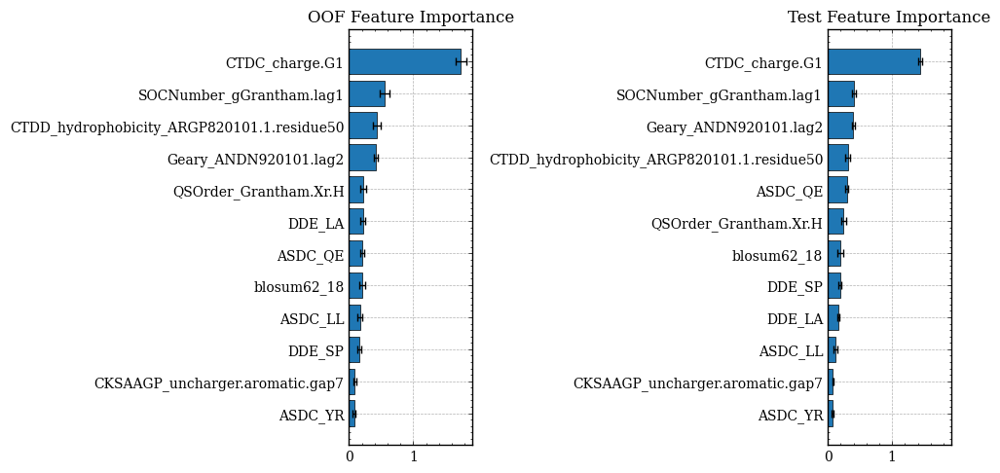

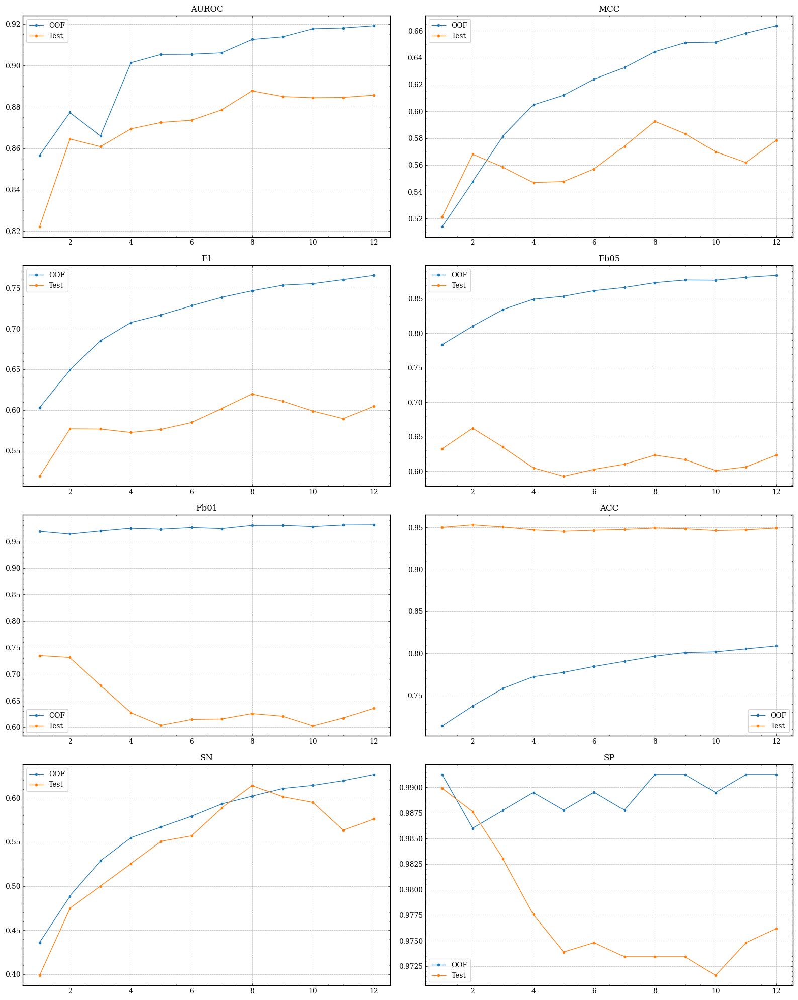

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    3.8s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.2s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.7s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.7s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.5s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.5s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.3s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.4s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.9s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   14.2s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.8s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   17.3s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.5s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   21.6s remaining:    4.2s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
CKSAAGP_postivecharger.uncharger.gap5,0.670823,0.670823
CTDD_hydrophobicity_ENGD860101.1.residue50,0.670709,0.670709
ASDC_CG,0.670657,0.670657
QSOrder_Schneider.Xr.H,0.667991,0.667991
CTDD_hydrophobicity_ENGD860101.1.residue75,0.667943,0.667943
PAAC_Xc1.V,0.666583,0.666583
CKSAAP_LA.gap1,0.666539,0.666539
CKSAAGP_uncharger.aromatic.gap9,0.666395,0.666395
ASDC_YS,0.665734,0.665734
CKSAAP_KK.gap0,0.665210,0.665210


(375, 2)


,relevance,redundancy
AAC_A,0.641193,0.127775
AAC_H,0.665181,0.457118
AAC_T,0.636070,0.060931
AAindex_p.1.ARGP820101,0.661274,0.639107
AAindex_p.1.BEGF750103,0.638718,0.226853
AAindex_p.2.ARGP820101,0.649018,0.096822
AAindex_p.6.BHAR880101,0.618424,0.089743
ACC_ANDN920101.lag1,0.647969,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.650280,0.046444
ACC_ANDN920101_ARGP820102_lag.3,0.648032,0.009530


(375, 2)


,relevance,redundancy,score
CKSAAGP_postivecharger.uncharger.gap5,0.670823,0.075037,0.670823
CTDD_hydrophobicity_ENGD860101.1.residue50,0.670709,0.021147,0.670709
ASDC_CG,0.670657,0.116283,0.670657
CTDD_hydrophobicity_ENGD860101.1.residue75,0.667943,0.041450,0.667943
PAAC_Xc1.V,0.666583,0.141157,0.666583
CKSAAP_LA.gap1,0.666539,0.082861,0.666539
CKSAAGP_uncharger.aromatic.gap9,0.666395,0.050762,0.666395
ASDC_YS,0.665734,0.092840,0.665734
CKSAAP_KA.gap3,0.665166,0.009908,0.665166
GTPC_alphaticr.negativecharger.uncharger,0.665157,0.019131,0.665157


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.4s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.7s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.1s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.8s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.2s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP,ASDC_YR,ASDC_QE,CKSAAGP_uncharger.aromatic.gap7,blosum62_18,QSOrder_Grantham.Xr.H,ASDC_LL,CKSAAGP_postivecharger.uncharger.gap5
AAC_A,0.024413,0.127775,0.019490,0.006956,0.127775,0.000000,0.004676,0.000190,0.000136,0.003972,0.001647,0.000000,0.008443,0.012354
AAC_H,0.018387,0.457118,0.023488,0.013047,0.000722,0.000964,0.000545,0.000000,0.001573,0.000000,0.001875,0.457118,0.004168,0.005683
AAC_T,0.060931,0.060931,0.030053,0.004952,0.005018,0.000658,0.011297,0.009011,0.000000,0.002955,0.003179,0.000000,0.002892,0.000000
AAindex_p.1.ARGP820101,0.070906,0.639107,0.049374,0.006201,0.005995,0.003823,0.005226,0.042285,0.014632,0.002184,0.639107,0.000000,0.015339,0.012028
AAindex_p.1.BEGF750103,0.038836,0.226853,0.013649,0.000000,0.000695,0.001424,0.003642,0.011605,0.005822,0.000000,0.226853,0.000000,0.004757,0.007277
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892,0.025600,0.010807,0.001092,0.009628,0.012159,0.008207,0.003285,0.000000,0.000000,0.037656,0.006992
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719,0.009535,0.005916,0.006084,0.006207,0.015726,0.009945,0.012260,0.000000,0.000000,0.013758,0.008032
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822,0.036926,0.004001,0.029706,0.002232,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.046444,0.001092,0.005542,0.000000,0.046444,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005314,0.000583
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.009530,0.000000,0.009530,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002032,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP', 'ASDC_YR', 'ASDC_QE', 'CKSAAGP_uncharger.aromatic.gap7', 'blosum62_18', 'QSOrder_Grantham.Xr.H', 'ASDC_LL', 'CKSAAGP_postivecharger.uncharger.gap5']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.918034 + 0.00294544	cv_agg's valid auc: 0.900706 + 0.0311699
[200]	cv_agg's train auc: 0.929781 + 0.00265836	cv_agg's valid auc: 0.910191 + 0.0306615
[300]	cv_agg's train auc: 0.935159 + 0.00319443	cv_agg's valid auc: 0.913986 + 0.0291018
[400]	cv_agg's train auc: 0.939846 + 0.00320516	cv_agg's valid auc: 0.916872 + 0.0262398
[500]	cv_agg's train auc: 0.943303 + 0.00310441	cv_agg's valid auc: 0.918671 + 0.0258713
[600]	cv_agg's train auc: 0.945984 + 0.00295164	cv_agg's valid auc: 0.920038 + 0.0260268
Early stopping, best iteration is:
[626]	cv_agg's train auc: 0.946572 + 0.00286725	cv_agg's valid auc: 0.9206

,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.920620,0.670823,0.771669,0.887277,0.981395,0.813318,0.635118,0.991258
Test_ensemble,0.888042,0.581116,0.608974,0.613695,0.616725,0.947886,0.601266,0.972973
Test_refit,0.887057,0.572061,0.600639,0.604113,0.606335,0.946604,0.594937,0.972057


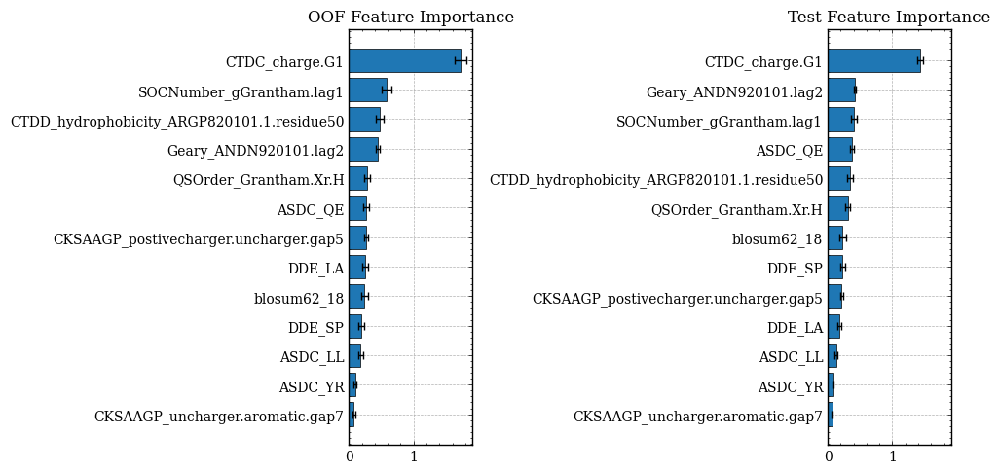

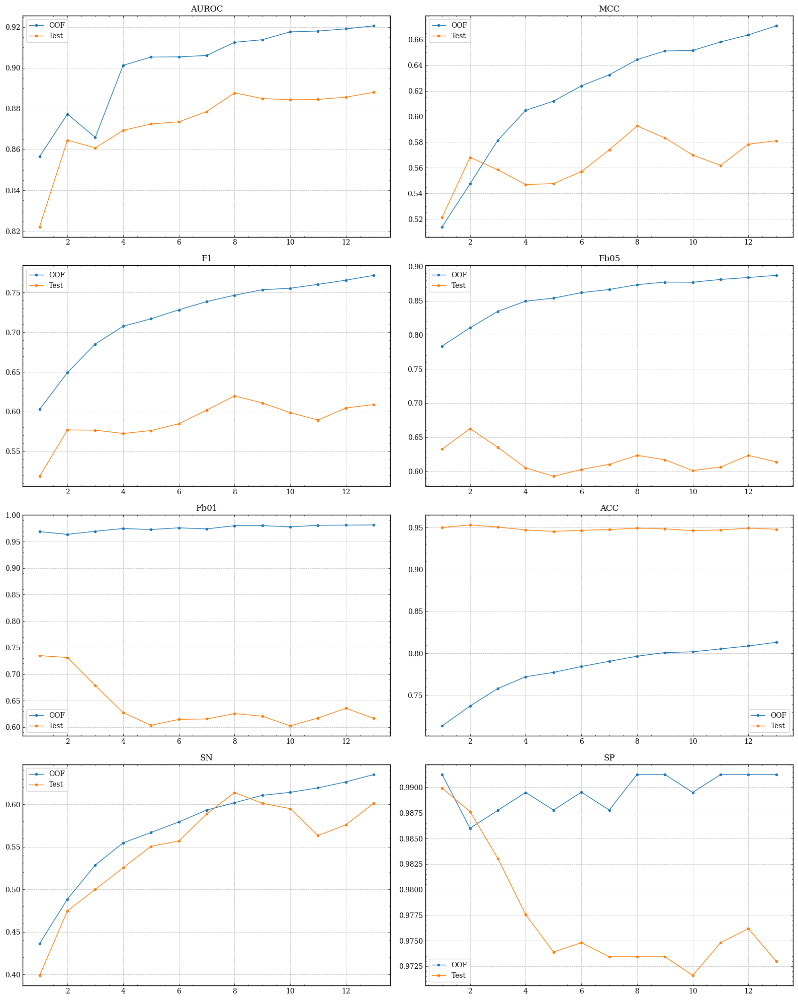

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    4.0s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.4s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    4.7s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    6.9s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    7.9s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.2s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.5s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.5s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.8s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   14.6s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.7s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   17.9s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   18.9s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   22.1s remaining:    4.3s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
ASDC_VG,0.675276,0.675276
ASDC_CG,0.674894,0.674894
Geary_ARGP820101.lag4,0.674866,0.674866
ZScale_p4.z5,0.672190,0.672190
Geary_ANDN920101.lag1,0.670793,0.670793
CKSAAGP_postivecharger.postivecharger.gap10,0.670324,0.670324
CKSAAP_KL.gap4,0.670095,0.670095
APAAC_Pc1.A,0.669917,0.669917
ASDC_AK,0.669729,0.669729
GTPC_alphaticr.negativecharger.uncharger,0.669420,0.669420


(375, 2)


,relevance,redundancy
AAC_A,0.645007,0.127775
AAC_H,0.654106,0.457118
AAC_T,0.666854,0.060931
AAindex_p.1.ARGP820101,0.659628,0.639107
AAindex_p.1.BEGF750103,0.656042,0.226853
AAindex_p.2.ARGP820101,0.644957,0.096822
AAindex_p.6.BHAR880101,0.647350,0.089743
ACC_ANDN920101.lag1,0.664491,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.658298,0.046444
ACC_ANDN920101_ARGP820102_lag.3,0.669261,0.009530


(375, 2)


,relevance,redundancy,score
ASDC_VG,0.675276,0.025809,0.675276
ASDC_CG,0.674894,0.116283,0.674894
Geary_ARGP820101.lag4,0.674866,0.007857,0.674866
ZScale_p4.z5,0.672190,0.083986,0.672190
Geary_ANDN920101.lag1,0.670793,0.062602,0.670793
CKSAAP_KL.gap4,0.670095,0.105408,0.670095
ASDC_AK,0.669729,0.084029,0.669729
GTPC_alphaticr.negativecharger.uncharger,0.669420,0.019131,0.669420
CKSAAGP_negativecharger.negativecharger.gap1,0.669410,0.008790,0.669410
CTDD_hydrophobicity_ENGD860101.1.residue0,0.669408,0.095484,0.669408


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.6s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.0s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.2s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.5s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.6s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    1.8s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.0s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.2s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.4s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.7s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.0s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP,ASDC_YR,ASDC_QE,CKSAAGP_uncharger.aromatic.gap7,blosum62_18,QSOrder_Grantham.Xr.H,ASDC_LL,CKSAAGP_postivecharger.uncharger.gap5,ASDC_VG
AAC_A,0.024413,0.127775,0.019490,0.006956,0.127775,0.000000,0.004676,0.000190,0.000136,0.003972,0.001647,0.000000,0.008443,0.012354,0.000000
AAC_H,0.018387,0.457118,0.023488,0.013047,0.000722,0.000964,0.000545,0.000000,0.001573,0.000000,0.001875,0.457118,0.004168,0.005683,0.001768
AAC_T,0.060931,0.060931,0.030053,0.004952,0.005018,0.000658,0.011297,0.009011,0.000000,0.002955,0.003179,0.000000,0.002892,0.000000,0.000000
AAindex_p.1.ARGP820101,0.070906,0.639107,0.049374,0.006201,0.005995,0.003823,0.005226,0.042285,0.014632,0.002184,0.639107,0.000000,0.015339,0.012028,0.021972
AAindex_p.1.BEGF750103,0.038836,0.226853,0.013649,0.000000,0.000695,0.001424,0.003642,0.011605,0.005822,0.000000,0.226853,0.000000,0.004757,0.007277,0.007818
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892,0.025600,0.010807,0.001092,0.009628,0.012159,0.008207,0.003285,0.000000,0.000000,0.037656,0.006992,0.015064
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719,0.009535,0.005916,0.006084,0.006207,0.015726,0.009945,0.012260,0.000000,0.000000,0.013758,0.008032,0.028867
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822,0.036926,0.004001,0.029706,0.002232,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001522
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.046444,0.001092,0.005542,0.000000,0.046444,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005314,0.000583,0.000000
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.009530,0.000000,0.009530,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002032,0.000000,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP', 'ASDC_YR', 'ASDC_QE', 'CKSAAGP_uncharger.aromatic.gap7', 'blosum62_18', 'QSOrder_Grantham.Xr.H', 'ASDC_LL', 'CKSAAGP_postivecharger.uncharger.gap5', 'ASDC_VG']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.916491 + 0.00316668	cv_agg's valid auc: 0.899832 + 0.0283977
[200]	cv_agg's train auc: 0.929711 + 0.00265109	cv_agg's valid auc: 0.907847 + 0.0279376
[300]	cv_agg's train auc: 0.935822 + 0.00306129	cv_agg's valid auc: 0.913068 + 0.0255939
[400]	cv_agg's train auc: 0.940652 + 0.00275917	cv_agg's valid auc: 0.917034 + 0.024511
[500]	cv_agg's train auc: 0.944269 + 0.00269079	cv_agg's valid auc: 0.918809 + 0.0238542
[600]	cv_agg's train auc: 0.946906 + 0.00255049	cv_agg's valid auc: 0.920456 + 0.0241464
[700]	cv_agg's train auc: 0.948803 + 0.00248718	cv_agg's valid auc: 0.921244 + 0.0241794
[100]	trai

,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.922493,0.675276,0.777442,0.889081,0.978863,0.816796,0.643799,0.989534
Test_ensemble,0.897456,0.608777,0.635514,0.629630,0.625957,0.950021,0.645570,0.972057
Test_refit,0.896142,0.597548,0.625000,0.620347,0.617435,0.948740,0.632911,0.971599


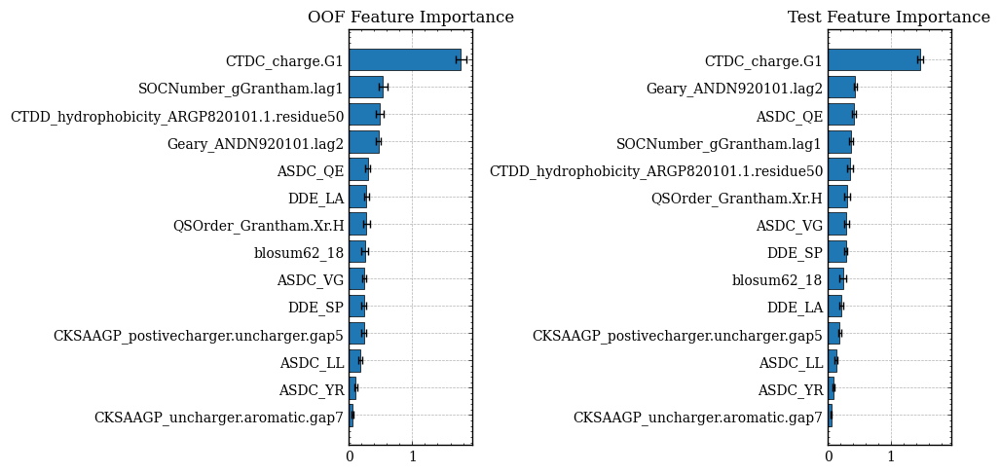

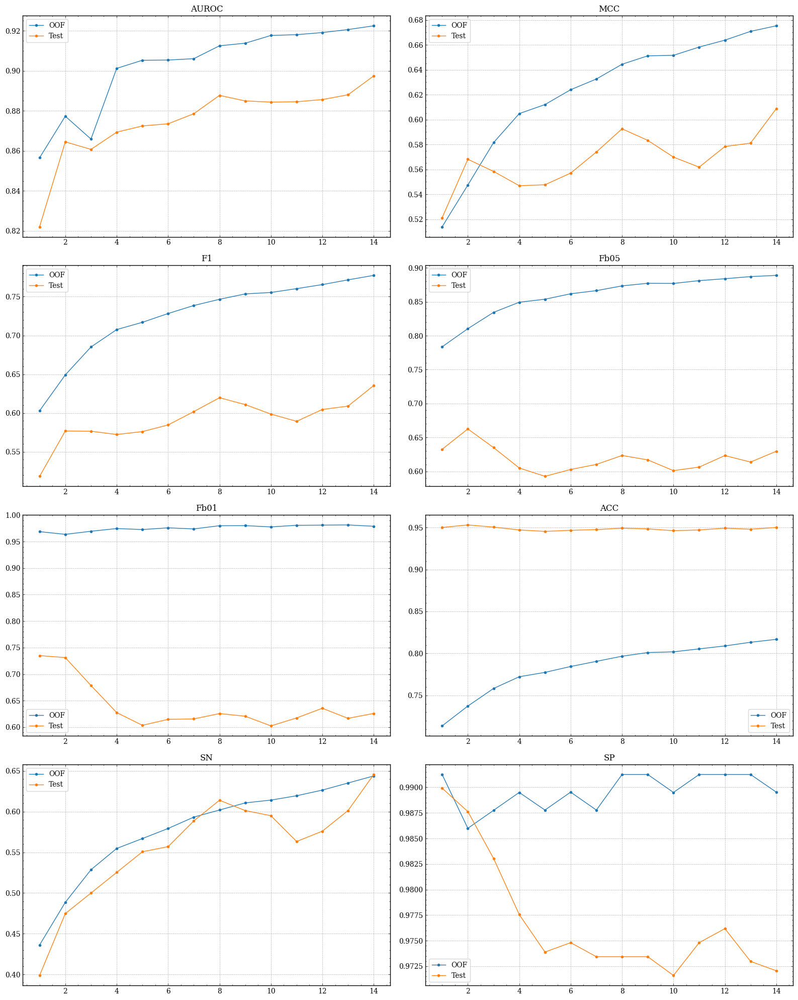

[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    4.2s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    4.5s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    5.1s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    7.1s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    8.0s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    8.7s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:   10.6s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:   11.6s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:   12.7s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:   14.7s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:   15.8s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:   17.9s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:   19.3s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:   22.8s remaining:    4.4s
[Parallel(n_jobs=50)]: Done 352 out 

,MCC,relevance
Fsp3,0.678679,0.678679
CTDC_solventaccess.G3,0.676693,0.676693
KSCTriad_g6.g2.g5.gap1,0.675276,0.675276
CKSAAP_KA.gap3,0.675238,0.675238
CKSAAP_AA.gap0,0.674912,0.674912
DDE_LS,0.674329,0.674329
ASDC_AK,0.673942,0.673942
CTDT_polarity.Tr1221,0.673554,0.673554
CKSAAP_LS.gap1,0.673472,0.673472
CKSAAGP_postivecharger.alphaticr.gap7,0.672572,0.672572


(375, 2)


,relevance,redundancy
AAC_A,0.657364,0.127775
AAC_H,0.660080,0.457118
AAC_T,0.666053,0.060931
AAindex_p.1.ARGP820101,0.655989,0.639107
AAindex_p.1.BEGF750103,0.644012,0.226853
AAindex_p.2.ARGP820101,0.657307,0.096822
AAindex_p.6.BHAR880101,0.664839,0.089743
ACC_ANDN920101.lag1,0.658731,0.037008
ACC_ANDN920101_ARGP820102_lag.2,0.665123,0.046444
ACC_ANDN920101_ARGP820102_lag.3,0.661539,0.009530


(375, 2)


,relevance,redundancy,score
Fsp3,0.678679,0.101571,0.678679
CTDC_solventaccess.G3,0.676693,0.191861,0.676693
KSCTriad_g6.g2.g5.gap1,0.675276,0.003966,0.675276
CKSAAP_KA.gap3,0.675238,0.009908,0.675238
CKSAAP_AA.gap0,0.674912,0.022601,0.674912
DDE_LS,0.674329,0.027382,0.674329
ASDC_AK,0.673942,0.084029,0.673942
CKSAAP_LS.gap1,0.673472,0.018696,0.673472
CKSAAGP_postivecharger.alphaticr.gap7,0.672572,0.074649,0.672572
ASDC_YQ,0.672501,0.045416,0.672501


[Parallel(n_jobs=50)]: Using backend LokyBackend with 50 concurrent workers.
[Parallel(n_jobs=50)]: Done  13 tasks      | elapsed:    0.7s
[Parallel(n_jobs=50)]: Done  28 tasks      | elapsed:    0.8s
[Parallel(n_jobs=50)]: Done  45 tasks      | elapsed:    0.9s
[Parallel(n_jobs=50)]: Done  62 tasks      | elapsed:    1.1s
[Parallel(n_jobs=50)]: Done  81 tasks      | elapsed:    1.3s
[Parallel(n_jobs=50)]: Done 100 tasks      | elapsed:    1.5s
[Parallel(n_jobs=50)]: Done 121 tasks      | elapsed:    1.7s
[Parallel(n_jobs=50)]: Done 142 tasks      | elapsed:    1.9s
[Parallel(n_jobs=50)]: Done 165 tasks      | elapsed:    2.0s
[Parallel(n_jobs=50)]: Done 188 tasks      | elapsed:    2.2s
[Parallel(n_jobs=50)]: Done 213 tasks      | elapsed:    2.5s
[Parallel(n_jobs=50)]: Done 238 tasks      | elapsed:    2.6s
[Parallel(n_jobs=50)]: Done 265 tasks      | elapsed:    2.9s
[Parallel(n_jobs=50)]: Done 314 out of 375 | elapsed:    3.3s remaining:    0.6s
[Parallel(n_jobs=50)]: Done 352 out 

,CTDC_charge.G1,redundancy,CTDD_hydrophobicity_ARGP820101.1.residue50,SOCNumber_gGrantham.lag1,DDE_LA,Geary_ANDN920101.lag2,DDE_SP,ASDC_YR,ASDC_QE,CKSAAGP_uncharger.aromatic.gap7,blosum62_18,QSOrder_Grantham.Xr.H,ASDC_LL,CKSAAGP_postivecharger.uncharger.gap5,ASDC_VG,Fsp3
AAC_A,0.024413,0.127775,0.019490,0.006956,0.127775,0.000000,0.004676,0.000190,0.000136,0.003972,0.001647,0.000000,0.008443,0.012354,0.000000,0.019779
AAC_H,0.018387,0.457118,0.023488,0.013047,0.000722,0.000964,0.000545,0.000000,0.001573,0.000000,0.001875,0.457118,0.004168,0.005683,0.001768,0.064444
AAC_T,0.060931,0.060931,0.030053,0.004952,0.005018,0.000658,0.011297,0.009011,0.000000,0.002955,0.003179,0.000000,0.002892,0.000000,0.000000,0.000000
AAindex_p.1.ARGP820101,0.070906,0.639107,0.049374,0.006201,0.005995,0.003823,0.005226,0.042285,0.014632,0.002184,0.639107,0.000000,0.015339,0.012028,0.021972,0.021514
AAindex_p.1.BEGF750103,0.038836,0.226853,0.013649,0.000000,0.000695,0.001424,0.003642,0.011605,0.005822,0.000000,0.226853,0.000000,0.004757,0.007277,0.007818,0.000000
AAindex_p.2.ARGP820101,0.096822,0.096822,0.044892,0.025600,0.010807,0.001092,0.009628,0.012159,0.008207,0.003285,0.000000,0.000000,0.037656,0.006992,0.015064,0.036071
AAindex_p.6.BHAR880101,0.089743,0.089743,0.037719,0.009535,0.005916,0.006084,0.006207,0.015726,0.009945,0.012260,0.000000,0.000000,0.013758,0.008032,0.028867,0.026257
ACC_ANDN920101.lag1,0.037008,0.037008,0.000822,0.036926,0.004001,0.029706,0.002232,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001522,0.000296
ACC_ANDN920101_ARGP820102_lag.2,0.011372,0.046444,0.001092,0.005542,0.000000,0.046444,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005314,0.000583,0.000000,0.000000
ACC_ANDN920101_ARGP820102_lag.3,0.008323,0.009530,0.000000,0.009530,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002032,0.000000,0.000000,0.000000


(375, 2)
['CTDC_charge.G1', 'CTDD_hydrophobicity_ARGP820101.1.residue50', 'SOCNumber_gGrantham.lag1', 'DDE_LA', 'Geary_ANDN920101.lag2', 'DDE_SP', 'ASDC_YR', 'ASDC_QE', 'CKSAAGP_uncharger.aromatic.gap7', 'blosum62_18', 'QSOrder_Grantham.Xr.H', 'ASDC_LL', 'CKSAAGP_postivecharger.uncharger.gap5', 'ASDC_VG', 'Fsp3']
Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.916715 + 0.00334811	cv_agg's valid auc: 0.900211 + 0.0277362
[200]	cv_agg's train auc: 0.930529 + 0.00265289	cv_agg's valid auc: 0.907498 + 0.0275509
[300]	cv_agg's train auc: 0.936927 + 0.0026614	cv_agg's valid auc: 0.913859 + 0.0245615
[400]	cv_agg's train auc: 0.941917 + 0.00262633	cv_agg's valid auc: 0.916682 + 0.0228504
[500]	cv_agg's train auc: 0.945678 + 0.00259047	cv_agg's valid auc: 0.919459 + 0.022781
[600]	cv_agg's train auc: 0.948297 + 0.00244318	cv_agg's valid auc: 0.920791 + 0.0217121
[700]	cv_agg's train auc: 0.950344 + 0.00240317	cv_agg's valid auc: 0.921708 + 0.0218806
[10

,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.921864,0.678679,0.781723,0.890176,0.976798,0.819420,0.650786,0.987780
Test_ensemble,0.901004,0.628897,0.654088,0.651629,0.650080,0.953012,0.658228,0.974347
Test_refit,0.899120,0.610859,0.636943,0.639386,0.640944,0.951303,0.632911,0.974347


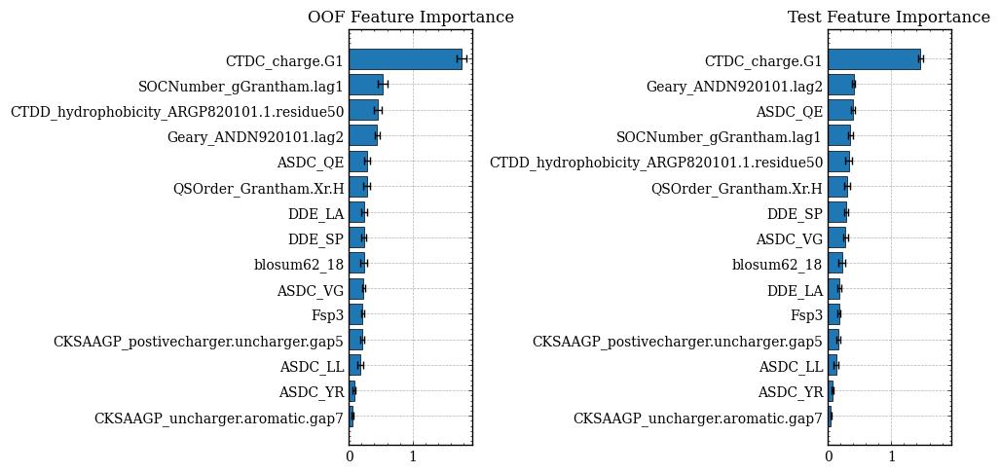

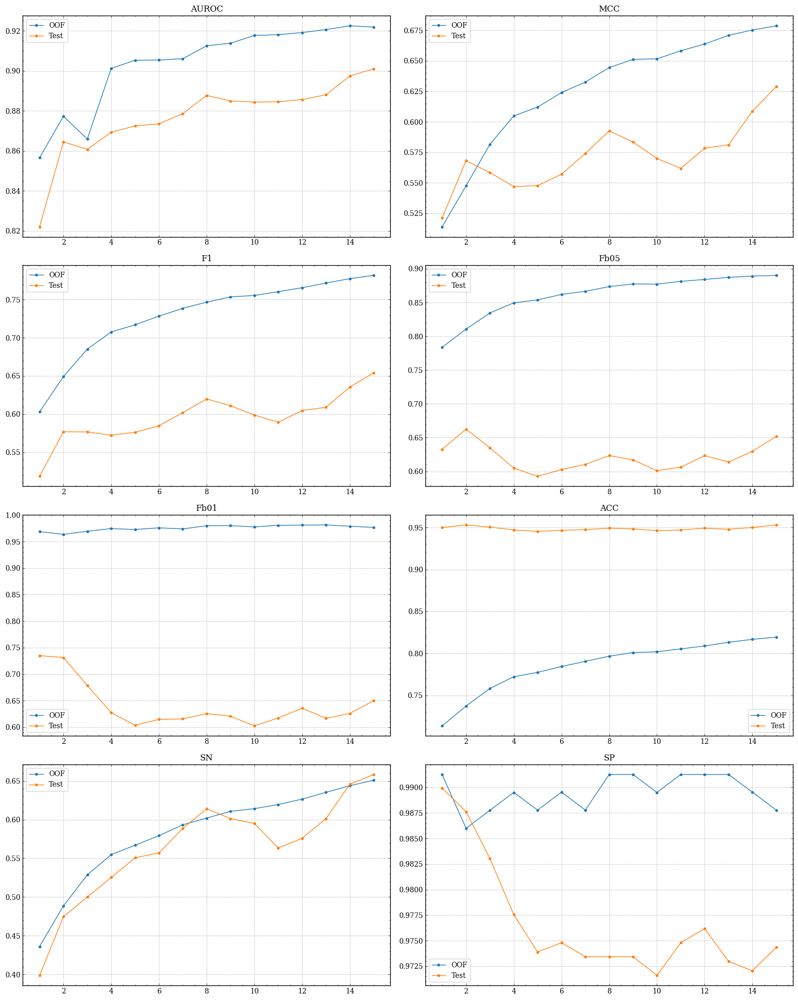

In [14]:
if not sys.warnoptions:
    warnings.simplefilter('ignore')
    os.environ["PYTHONWARNINGS"] = 'ignore'
    
γ = 0.2
fold = 'OOF'
metrics = ['MCC']
selected_features = []
desired_features_number = 15
relevance_dict = dict()
redundancy_dict = dict()
history = []
strategy = 'max_redundancy'
redundancy_threshold = 0.2

for i in range(desired_features_number):
    
    ## Compute relevance
    relevance_tmp = Parallel(n_jobs=50, verbose=10)(delayed(compute_relevance)(train=train,
                                                                               test=test,
                                                                               feature=feature,
                                                                               selected_features=selected_features,
                                                                               target=TARGET,
                                                                               num_folds=NUM_FOLDS,
                                                                               num_repeats=NUM_REPEATS,
                                                                               seed=SEED,
                                                                               params=PARAMS_GB,
                                                                               metrics=metrics,
                                                                               optimization_fold=fold) for feature in features)
    relevance_dict[repr(selected_features)] = dict(relevance_tmp)
    relevance_df = pd.DataFrame(data=relevance_dict[repr(selected_features)].values(),
                                index=relevance_dict[repr(selected_features)].keys(),
                                columns=metrics)
    relevance_df['relevance'] = relevance_df[metrics].mean(axis=1)
    display(relevance_df.sort_values('relevance', ascending=False).head(10))
    print(relevance_df.shape)
    
    ## Select best feature
    if len(selected_features) == 0:
        last_selected_feature = relevance_df['relevance'].idxmax()
        selected_features.append(last_selected_feature)
    else:
        score_df = pd.merge(relevance_df['relevance'], redundancy_df['redundancy'], left_index=True, right_index=True)
        display(score_df.head(10))
        print(score_df.shape)
        if strategy != 'max_redundancy':
            score_df['score'] = score_df['relevance'] - γ * score_df['redundancy']
            display(score_df.sort_values('score', ascending=False).head(10))
            last_selected_feature = score_df['score'].idxmax()
        else:
            score_df['score'] = score_df['relevance'] * (score_df['redundancy'] < redundancy_threshold).astype(int)
            display(score_df.sort_values('score', ascending=False).head(10))
            last_selected_feature = score_df['score'].idxmax()

        selected_features.append(last_selected_feature)


    ## Compute redundancy
    redudancy_tmp = Parallel(n_jobs=50, verbose=10)(delayed(compute_redundancy)(comb=comb,
                                                                                feature1=last_selected_feature,
                                                                                feature2=feature,
                                                                                num_folds=NUM_FOLDS,
                                                                                seed=SEED,
                                                                                params=PARAMS_GB) for feature in features)
    redundancy_dict[last_selected_feature] = dict(redudancy_tmp)
    if len(selected_features) == 1:
        redundancy_df = pd.DataFrame(data=redundancy_dict[last_selected_feature].values(),
                                     index=redundancy_dict[last_selected_feature].keys(),
                                     columns=[last_selected_feature])
        redundancy_df['redundancy'] = redundancy_df[last_selected_feature]
    else:
        redundancy_df = pd.merge(redundancy_df, pd.DataFrame(data=redundancy_dict[last_selected_feature].values(),
                                     index=redundancy_dict[last_selected_feature].keys(),
                                     columns=[last_selected_feature]), left_index=True, right_index=True)
        if strategy != 'max_redundancy':
            redundancy_df['redundancy'] = redundancy_df[selected_features].mean(axis=1)
        else:
            redundancy_df['redundancy'] = redundancy_df[selected_features].max(axis=1)
    
    display(redundancy_df.head(10))
    print(relevance_df.shape)
    print(selected_features)
    
    ## Compute results
    oof_results, test_results = cross_validate(train=train,
                                               test=test,
                                               features=selected_features,
                                               target=TARGET,
                                               num_folds=NUM_FOLDS,
                                               num_repeats=NUM_REPEATS,
                                               seed=SEED,
                                               params={**PARAMS_GB, **{'scale_pos_weight': 0.1, 'num_leaves': 2}},
                                               threshold=0.5,
                                               feval=None,
                                               refit=True,
                                               compute_oof_importance=True,
                                               compute_test_importance=True)
    res = print_results(oof_results, test_results, return_metrics=True)
    history.append(res)
    plot_importance(oof_results, test_results, selected_features, max_features=20)
    
    ## Plot progress
    history_df = pd.concat(history, keys=range(1, desired_features_number+1))
    history_df.reset_index(1, inplace=True)
    fig, axs = plt.subplots(4, 2, figsize=(16,20))
    for i, (ax, metric) in enumerate(zip(axs.flat, ['AUROC', 'MCC', 'F1', 'Fb05', 'Fb01', 'ACC', 'SN', 'SP'])): 
        history_df[history_df['fold']=='OOF'][metric].plot(style='.-', ax=ax, label='OOF')
        history_df[history_df['fold']=='Test_ensemble'][metric].plot(style='.-', ax=ax, label='Test')
        ax.legend()
        ax.set_title(metric)
    plt.tight_layout()
    plt.show()

In [15]:
selected_features

['CTDC_charge.G1',
 'CTDD_hydrophobicity_ARGP820101.1.residue50',
 'SOCNumber_gGrantham.lag1',
 'DDE_LA',
 'Geary_ANDN920101.lag2',
 'DDE_SP',
 'ASDC_YR',
 'ASDC_QE',
 'CKSAAGP_uncharger.aromatic.gap7',
 'blosum62_18',
 'QSOrder_Grantham.Xr.H',
 'ASDC_LL',
 'CKSAAGP_postivecharger.uncharger.gap5',
 'ASDC_VG',
 'Fsp3']

Training until validation scores don't improve for 20 rounds
[100]	cv_agg's train auc: 0.916715 + 0.00334811	cv_agg's valid auc: 0.900211 + 0.0277362
[200]	cv_agg's train auc: 0.930529 + 0.00265289	cv_agg's valid auc: 0.907498 + 0.0275509
[300]	cv_agg's train auc: 0.936927 + 0.0026614	cv_agg's valid auc: 0.913859 + 0.0245615
[400]	cv_agg's train auc: 0.941917 + 0.00262633	cv_agg's valid auc: 0.916682 + 0.0228504
[500]	cv_agg's train auc: 0.945678 + 0.00259047	cv_agg's valid auc: 0.919459 + 0.022781
[600]	cv_agg's train auc: 0.948297 + 0.00244318	cv_agg's valid auc: 0.920791 + 0.0217121
[700]	cv_agg's train auc: 0.950344 + 0.00240317	cv_agg's valid auc: 0.921708 + 0.0218806
Early stopping, best iteration is:
[686]	cv_agg's train auc: 0.950075 + 0.00244634	cv_agg's valid auc: 0.921864 + 0.0223996
[100]	training's auc: 0.914206	valid_1's auc: 0.908048
[200]	training's auc: 0.930725	valid_1's auc: 0.905279
[300]	training's auc: 0.936286	valid_1's auc: 0.901391
[400]	training's auc: 0.94079

,AUROC,MCC,F1,Fb05,Fb01,ACC,SN,SP
fold,,,,,,,,
OOF,0.921864,0.678679,0.781723,0.890176,0.976798,0.819420,0.650786,0.987780
Test_ensemble,0.901004,0.628897,0.654088,0.651629,0.650080,0.953012,0.658228,0.974347
Test_refit,0.899120,0.610859,0.636943,0.639386,0.640944,0.951303,0.632911,0.974347


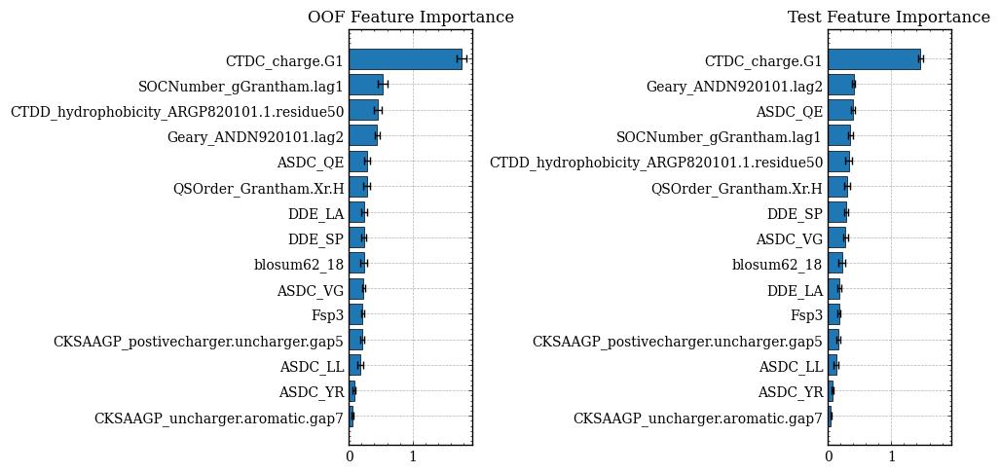

In [16]:
oof_results, test_results = cross_validate(train=train,
                                           test=test,
                                           features=selected_features,
                                           target=TARGET,
                                           num_folds=NUM_FOLDS,
                                           num_repeats=NUM_REPEATS,
                                           seed=SEED,
                                           params={**PARAMS_GB, **{'scale_pos_weight': 0.1, 'num_leaves': 2}},
                                           threshold=0.5,
                                           feval=None,
                                           refit=True,
                                           compute_oof_importance=True,
                                           compute_test_importance=True)
print_results(oof_results, test_results)
plot_importance(oof_results, test_results, selected_features, max_features=20)